In [1]:
#Data: https://grouplens.org/datasets/movielens/

# importing libraries
import pandas as pd
import numpy as np

# pass in column names for each CSV as the column name is not given in the file and read them using pandas.
# You can check the column names from the readme file

# reading users file:
u_cols = ['user_id', 'age', 'sex', 'occupation', 'zip_code']
users = pd.read_csv('u.user', sep='|', names=u_cols,encoding='latin-1')

# reading ratings file:
r_cols = ['user_id', 'movie_id', 'rating', 'unix_timestamp']
ratings = pd.read_csv('u.data', sep='\t', names=r_cols,encoding='latin-1')

# reading items file:
i_cols = ['movie id', 'movie title' ,'release date','video release date', 'IMDb URL', 'unknown', 'Action', 'Adventure',
'Animation', 'Children\'s', 'Comedy', 'Crime', 'Documentary', 'Drama', 'Fantasy',
'Film-Noir', 'Horror', 'Musical', 'Mystery', 'Romance', 'Sci-Fi', 'Thriller', 'War', 'Western']
items = pd.read_csv('u.item', sep='|', names=i_cols,
encoding='latin-1')

# After loading the dataset, we should look at the content of each file (users, ratings, items).

# Looking at the user file
print("\nUser Data :")
print("shape : ", users.shape)
users.head()


User Data :
shape :  (943, 5)


,user_id,age,sex,occupation,zip_code
0,1,24,M,technician,85711
1,2,53,F,other,94043
2,3,23,M,writer,32067
3,4,24,M,technician,43537
4,5,33,F,other,15213


We have 943 users in the dataset and each user has 5 features, i.e. user_ID, age, sex, occupation and zip_code. Now let’s look at the ratings file.


In [2]:
# Ratings Data
print("\nRatings Data :")
print("shape : ", ratings.shape)
ratings.head()


Ratings Data :
shape :  (100000, 4)


,user_id,movie_id,rating,unix_timestamp
0,196,242,3,881250949
1,186,302,3,891717742
2,22,377,1,878887116
3,244,51,2,880606923
4,166,346,1,886397596


We have 100k ratings for different user and movie combinations. Now finally examine the items file.

In [3]:
# Item Data
print("\nItem Data :")
print("shape : ", items.shape)
items.head()


Item Data :
shape :  (1682, 24)


,movie id,movie title,release date,video release date,IMDb URL,unknown,Action,Adventure,Animation,Children's,...,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
0,1,Toy Story (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Toy%20Story%2...,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
1,2,GoldenEye (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?GoldenEye%20(...,0,1,1,0,0,...,0,0,0,0,0,0,0,1,0,0
2,3,Four Rooms (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Four%20Rooms%...,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,4,Get Shorty (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Get%20Shorty%...,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,5,Copycat (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Copycat%20(1995),0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


This dataset contains attributes of 1682 movies. There are 24 columns out of which last 19 columns specify the genre of a particular movie. These are binary columns, i.e., a value of 1 denotes that the movie belongs to that genre, and 0 otherwise.

The dataset has already been divided into train and test by GroupLens where the test data has 10 ratings for each user, i.e. 9,430 rows in total.


In [4]:
r_cols = ['user_id', 'movie_id', 'rating', 'unix_timestamp']
ratings_train = pd.read_csv('ua.base', sep='\t', names=r_cols, encoding='latin-1')
ratings_test = pd.read_csv('ua.test', sep='\t', names=r_cols, encoding='latin-1')
print(ratings_train.shape, ratings_test.shape)

(90570, 4) (9430, 4)


In [5]:
ratings_train.head()

,user_id,movie_id,rating,unix_timestamp
0,1,1,5,874965758
1,1,2,3,876893171
2,1,3,4,878542960
3,1,4,3,876893119
4,1,5,3,889751712


In [66]:
train=ratings_train.merge(items,how='left', left_on="movie_id", right_on='movie id' )

test=ratings_test.merge(items,how='left', left_on="movie_id", right_on='movie id' )

train= train.loc[:,['user_id', 'movie_id', 'rating', 'unix_timestamp','movie title']]

test= test.loc[:,['user_id', 'movie_id', 'rating', 'unix_timestamp','movie title']]

train.head()

,user_id,movie_id,rating,unix_timestamp,movie title
0,1,1,5,874965758,Toy Story (1995)
1,1,2,3,876893171,GoldenEye (1995)
2,1,3,4,878542960,Four Rooms (1995)
3,1,4,3,876893119,Get Shorty (1995)
4,1,5,3,889751712,Copycat (1995)


In [67]:
train.movie_id.nunique()

1680

In [68]:
df= pd.concat([train,test], axis=0)

df.reset_index(inplace=True)

df.drop(['index','unix_timestamp'],axis=1, inplace=True)

df.head()

,user_id,movie_id,rating,movie title
0,1,1,5,Toy Story (1995)
1,1,2,3,GoldenEye (1995)
2,1,3,4,Four Rooms (1995)
3,1,4,3,Get Shorty (1995)
4,1,5,3,Copycat (1995)


# EDA

In [69]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('white')
%matplotlib inline

In [70]:
df.groupby('movie title')['rating'].mean().sort_values(ascending=False).head()

movie title
Marlene Dietrich: Shadow and Light (1996)     5.0
Prefontaine (1997)                            5.0
Santa with Muscles (1996)                     5.0
Star Kid (1997)                               5.0
Someone Else's America (1995)                 5.0
Name: rating, dtype: float64

But we can not trust it as we dont know how much people has rated it, so one person with 5 rating will give mean 5 to over come this we will have to taken no f ratings in account

In [71]:
df.groupby('movie title')['rating'].count().sort_values(ascending=False).head()

movie title
Star Wars (1977)             583
Contact (1997)               509
Fargo (1996)                 508
Return of the Jedi (1983)    507
Liar Liar (1997)             485
Name: rating, dtype: int64

In [72]:
ratings = pd.DataFrame(df.groupby('movie title')['rating'].mean())
ratings.head()

,rating
movie title,
'Til There Was You (1997),2.333333
1-900 (1994),2.600000
101 Dalmatians (1996),2.908257
12 Angry Men (1957),4.344000
187 (1997),3.024390


In [73]:
ratings['num of ratings'] = pd.DataFrame(df.groupby('movie title')['rating'].count())
ratings.head()

,rating,num of ratings
movie title,,
'Til There Was You (1997),2.333333,9
1-900 (1994),2.600000,5
101 Dalmatians (1996),2.908257,109
12 Angry Men (1957),4.344000,125
187 (1997),3.024390,41


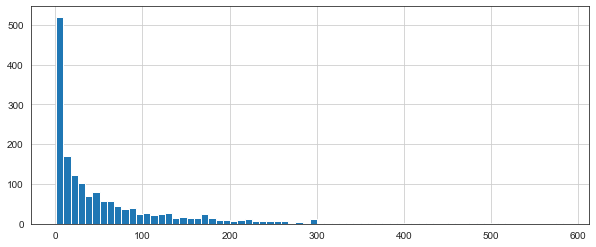

In [74]:
plt.figure(figsize=(10,4))
ratings['num of ratings'].hist(bins=70)

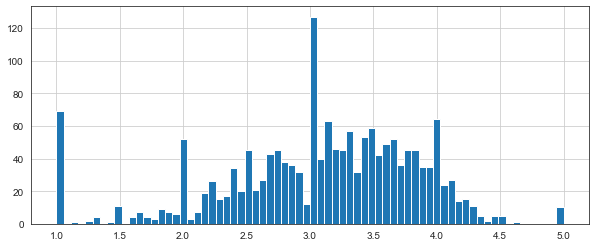

In [75]:
plt.figure(figsize=(10,4))
ratings['rating'].hist(bins=70)

This say that our ratings are normally distributed with few outliers

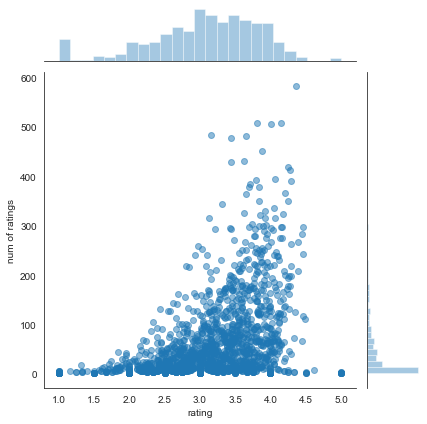

In [76]:
sns.jointplot(x='rating',y='num of ratings',data=ratings,alpha=0.5)

It shows the histograms with their scatter plot , by this we can judge main ratings are from 2.5 to 4

### Recommending Similar Movies
Now let's create a matrix that has the user ids on one access and the movie title on another axis. Each cell will then consist of the rating the user gave to that movie. Note there will be a lot of NaN values, because most people have not seen most of the movies.

In [77]:
df.columns

Index(['user_id', 'movie_id', 'rating', 'movie title'], dtype='object')

In [78]:
moviemat = df.pivot_table(index='user_id',columns='movie title',values='rating')
moviemat.head()

movie title,'Til There Was You (1997),1-900 (1994),101 Dalmatians (1996),12 Angry Men (1957),187 (1997),2 Days in the Valley (1996),"20,000 Leagues Under the Sea (1954)",2001: A Space Odyssey (1968),3 Ninjas: High Noon At Mega Mountain (1998),"39 Steps, The (1935)",...,Yankee Zulu (1994),Year of the Horse (1997),You So Crazy (1994),Young Frankenstein (1974),Young Guns (1988),Young Guns II (1990),"Young Poisoner's Handbook, The (1995)",Zeus and Roxanne (1997),unknown,Á köldum klaka (Cold Fever) (1994)
user_id,,,,,,,,,,,,,,,,,,,,,
1,NaN,NaN,2.0,5.0,NaN,NaN,3.0,4.0,NaN,NaN,...,NaN,NaN,NaN,5.0,3.0,NaN,NaN,NaN,4.0,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,2.0,NaN,NaN,NaN,NaN,4.0,NaN,NaN,...,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,4.0,NaN


In [79]:
# we can see the most rated movie
ratings.sort_values('num of ratings',ascending=False).head(10)


,rating,num of ratings
movie title,,
Star Wars (1977),4.358491,583
Contact (1997),3.803536,509
Fargo (1996),4.155512,508
Return of the Jedi (1983),4.007890,507
Liar Liar (1997),3.156701,485
"English Patient, The (1996)",3.656965,481
Scream (1996),3.441423,478
Toy Story (1995),3.878319,452
Air Force One (1997),3.631090,431


In [80]:
starwars_user_ratings = moviemat['Star Wars (1977)']
starwars_user_ratings.head()

user_id
1    5.0
2    5.0
3    NaN
4    5.0
5    4.0
Name: Star Wars (1977), dtype: float64

In [81]:
# Now we will find the correlation of ratings given to starwars with other movies in pivot table to get similarity
# We can then use corrwith() method to get correlations

similar_to_starwars = moviemat.corrwith(starwars_user_ratings)
corr_starwars = pd.DataFrame(similar_to_starwars,columns=['Correlation'])
corr_starwars.dropna(inplace=True)
corr_starwars.head()

/Users/Kukreja/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:2526: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar)
/Users/Kukreja/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:2455: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)


,Correlation
movie title,
'Til There Was You (1997),0.872872
1-900 (1994),-0.645497
101 Dalmatians (1996),0.211132
12 Angry Men (1957),0.184289
187 (1997),0.027398


Now if we sort the dataframe by correlation, we should get the most similar movies, however note that we get some results that don't really make sense. This is because there are a lot of movies only watched once by users who also watched star wars (it was the most popular movie)

In [82]:
corr_starwars.sort_values('Correlation',ascending=False).head(10)

,Correlation
movie title,
Hollow Reed (1996),1.0
Commandments (1997),1.0
Cosi (1996),1.0
No Escape (1994),1.0
Stripes (1981),1.0
Star Wars (1977),1.0
Man of the Year (1995),1.0
"Beans of Egypt, Maine, The (1994)",1.0
"Old Lady Who Walked in the Sea, The (Vieille qui marchait dans la mer, La) (1991)",1.0


Let's fix this by filtering out movies that have less than 100 reviews (this value was chosen based off the histogram from earlier).

In [83]:
corr_starwars = corr_starwars.join(ratings['num of ratings'])
corr_starwars.head()

,Correlation,num of ratings
movie title,,
'Til There Was You (1997),0.872872,9
1-900 (1994),-0.645497,5
101 Dalmatians (1996),0.211132,109
12 Angry Men (1957),0.184289,125
187 (1997),0.027398,41


In [84]:
corr_starwars[corr_starwars['num of ratings']>100].sort_values('Correlation',ascending=False).head()

,Correlation,num of ratings
movie title,,
Star Wars (1977),1.000000,583
"Empire Strikes Back, The (1980)",0.747981,367
Return of the Jedi (1983),0.672556,507
Raiders of the Lost Ark (1981),0.536117,420
Austin Powers: International Man of Mystery (1997),0.377433,130


Taking top 5 related movie to show

In [85]:
top5= corr_starwars[corr_starwars['num of ratings']>100].sort_values('Correlation',ascending=False)[1:6]

In [86]:
top5

,Correlation,num of ratings
movie title,,
"Empire Strikes Back, The (1980)",0.747981,367
Return of the Jedi (1983),0.672556,507
Raiders of the Lost Ark (1981),0.536117,420
Austin Powers: International Man of Mystery (1997),0.377433,130
"Sting, The (1973)",0.367538,241


In [87]:
def top5(movie):
    movie_user_ratings = moviemat[movie]
    similar_to_movie = moviemat.corrwith(movie_user_ratings)
    corr_movie = pd.DataFrame(similar_to_movie,columns=['Correlation'])
    corr_movie.dropna(inplace=True)
    corr_movie = corr_movie.join(ratings['num of ratings'])
    top5= corr_movie[corr_movie['num of ratings']>100].sort_values('Correlation',ascending=False)[1:6]
    return top5

In [88]:
top5('Empire Strikes Back, The (1980)')

,Correlation,num of ratings
movie title,,
Star Wars (1977),0.747981,583
Return of the Jedi (1983),0.721229,507
Raiders of the Lost Ark (1981),0.538659,420
"Philadelphia Story, The (1940)",0.482151,104
"Frighteners, The (1996)",0.442761,115


### Building collaborative filtering model using nearest neighbour concept.
In this cosine similarity is found using NearestNeighbours algorithm which is unsuper vised algorithm.


In [114]:
df.head()

,user_id,movie_id,rating,movie title
0,1,1,5,Toy Story (1995)
1,1,2,3,GoldenEye (1995)
2,1,3,4,Four Rooms (1995)
3,1,4,3,Get Shorty (1995)
4,1,5,3,Copycat (1995)


In [117]:
combine_movie_rating = df.dropna(axis = 0, subset = ['movie title'])
movie_ratingCount = (combine_movie_rating.
     groupby(by = ['movie title'])['rating'].
     count().
     reset_index().
     rename(columns = {'rating': 'totalRatingCount'})
     [['movie title', 'totalRatingCount']]
    )
movie_ratingCount.head()

,movie title,totalRatingCount
0,'Til There Was You (1997),9
1,1-900 (1994),5
2,101 Dalmatians (1996),109
3,12 Angry Men (1957),125
4,187 (1997),41


In [118]:
rating_with_totalRatingCount = combine_movie_rating.merge(movie_ratingCount, left_on = 'movie title',
                                                          right_on = 'movie title', how = 'left')
rating_with_totalRatingCount.head()

,user_id,movie_id,rating,movie title,totalRatingCount
0,1,1,5,Toy Story (1995),452
1,1,2,3,GoldenEye (1995),131
2,1,3,4,Four Rooms (1995),90
3,1,4,3,Get Shorty (1995),209
4,1,5,3,Copycat (1995),86


In [119]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
print(movie_ratingCount['totalRatingCount'].describe())

count   1664.000
mean      60.096
std       80.956
min        1.000
25%        7.000
50%       27.000
75%       80.250
max      583.000
Name: totalRatingCount, dtype: float64


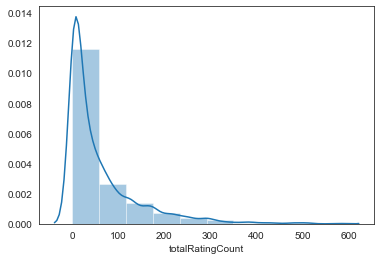

In [122]:
sns.distplot(movie_ratingCount['totalRatingCount'],bins=10)

In [123]:
popularity_threshold = 50 # choosen 50 as in distribution it is maximum 
rating_popular_movie= rating_with_totalRatingCount.query('totalRatingCount >= @popularity_threshold')
rating_popular_movie.head()

,user_id,movie_id,rating,movie title,totalRatingCount
0,1,1,5,Toy Story (1995),452
1,1,2,3,GoldenEye (1995),131
2,1,3,4,Four Rooms (1995),90
3,1,4,3,Get Shorty (1995),209
4,1,5,3,Copycat (1995),86


In [124]:
rating_popular_movie.shape

(84069, 5)

In [128]:
## First lets create a Pivot matrix, it is item item similarity

movie_features_df=rating_popular_movie.pivot_table(index='movie title',columns='user_id',values='rating').fillna(0)
movie_features_df.head()

user_id,1,2,3,4,5,6,7,8,9,10,...,934,935,936,937,938,939,940,941,942,943
movie title,,,,,,,,,,,,,,,,,,,,,
101 Dalmatians (1996),2.000,0.000,0.000,0.000,2.000,0.000,0.000,0.000,0.000,0.000,...,2.000,0.000,0.000,2.000,4.000,0.000,0.000,0.000,0.000,0.000
12 Angry Men (1957),5.000,0.000,0.000,0.000,0.000,4.000,4.000,0.000,0.000,5.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2 Days in the Valley (1996),0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,4.000,0.000,0.000,0.000,0.000,0.000,0.000,2.000
"20,000 Leagues Under the Sea (1954)",3.000,0.000,0.000,0.000,0.000,0.000,5.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2001: A Space Odyssey (1968),4.000,0.000,0.000,0.000,4.000,5.000,5.000,0.000,0.000,5.000,...,4.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,3.000,0.000


In [136]:
from scipy.sparse import csr_matrix # Creating a matrix out of values of Data Frame= movie_features_df.values

movie_features_df_matrix = csr_matrix(movie_features_df.values)

In [158]:
pd.DataFrame(csr_matrix(movie_features_df.values).toarray())

,0,1,2,3,4,5,6,7,8,9,...,933,934,935,936,937,938,939,940,941,942
0,2.000,0.000,0.000,0.000,2.000,0.000,0.000,0.000,0.000,0.000,...,2.000,0.000,0.000,2.000,4.000,0.000,0.000,0.000,0.000,0.000
1,5.000,0.000,0.000,0.000,0.000,4.000,4.000,0.000,0.000,5.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,4.000,0.000,0.000,0.000,0.000,0.000,0.000,2.000
3,3.000,0.000,0.000,0.000,0.000,0.000,5.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,4.000,0.000,0.000,0.000,4.000,5.000,5.000,0.000,0.000,5.000,...,4.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,3.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
600,0.000,0.000,0.000,0.000,0.000,0.000,4.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,2.000
601,5.000,0.000,0.000,0.000,5.000,4.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
602,0.000,0.000,0.000,0.000,0.000,0.000,3.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000
603,5.000,0.000,0.000,0.000,4.000,4.000,5.000,0.000,0.000,0.000,...,5.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


In [159]:
movie_features_df.values

array([[2., 0., 0., ..., 0., 0., 0.],
       [5., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 2.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [5., 0., 0., ..., 0., 0., 0.],
       [3., 0., 0., ..., 0., 0., 4.]])

In [173]:
from sklearn.neighbors import NearestNeighbors


model_knn = NearestNeighbors(metric = 'cosine', algorithm = 'brute')
model_knn.fit(movie_features_df_matrix)

NearestNeighbors(algorithm='brute', leaf_size=30, metric='cosine',
                 metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                 radius=1.0)

In [174]:
query_index = np.random.choice(movie_features_df.shape[0]) # Randomly Selecting a no from total no of movies
print(query_index)
distances,indices = model_knn.kneighbors(movie_features_df.iloc[query_index,:].values.reshape(1, -1), n_neighbors = 6)

471


In [175]:
distances # cosine distance 

array([[3.10862447e-15, 3.29569344e-01, 3.46754444e-01, 3.55851707e-01,
        3.69637661e-01, 3.69644718e-01]])

In [176]:
indices # total 6 movies nearest to input movie

array([[471, 212, 487, 141, 175, 591]])

In [193]:
distances.flatten()

array([0.        , 0.34548134, 0.35105477, 0.3527924 , 0.35465958,
       0.3764707 ])

In [177]:
for i in range(0, len(distances.flatten())):
    if i == 0:
        print('Recommendations for {0}:\n'.format(movie_features_df.index[query_index]))
    else:
        print('{0}: {1}, with distance of {2}:'.format(i, movie_features_df.index[indices.flatten()[i]],
                                                       distances.flatten()[i]))

Recommendations for Schindler's List (1993):

1: Forrest Gump (1994), with distance of 0.3295693437170719:
2: Shawshank Redemption, The (1994), with distance of 0.34675444412900436:
3: Dances with Wolves (1990), with distance of 0.35585170708045055:
4: E.T. the Extra-Terrestrial (1982), with distance of 0.3696376605899083:
5: When Harry Met Sally... (1989), with distance of 0.3696447183780306:


In [178]:
def nearestmovie(movie_index):
    distances,indices = model_knn.kneighbors(movie_features_df.iloc[movie_index,:].values.reshape(1, -1), n_neighbors = 6)
    for i in range(0, len(distances.flatten())):
        if i == 0:
            print('Recommendations for {0}:\n'.format(movie_features_df.index[movie_index]))
        else:
            print('{0}: {1}, with distance of {2}:'.format(i, movie_features_df.index[indices.flatten()[i]],
                                                       distances.flatten()[i]))
        
    

In [179]:
nearestmovie(50)

Recommendations for Barcelona (1994):

1: Ed Wood (1994), with distance of 0.565173329674167:
2: Age of Innocence, The (1993), with distance of 0.5767311388826657:
3: Muriel's Wedding (1994), with distance of 0.6008088652337988:
4: Madness of King George, The (1994), with distance of 0.6037040960897777:
5: Cinema Paradiso (1988), with distance of 0.6040817665166629:


In [192]:
movie_features_df.transpose() # User Matrix

movie title,101 Dalmatians (1996),12 Angry Men (1957),2 Days in the Valley (1996),"20,000 Leagues Under the Sea (1954)",2001: A Space Odyssey (1968),"39 Steps, The (1935)",Absolute Power (1997),"Abyss, The (1989)",Ace Ventura: Pet Detective (1994),Addams Family Values (1993),...,Willy Wonka and the Chocolate Factory (1971),Wings of Desire (1987),"Wings of the Dove, The (1997)",Winnie the Pooh and the Blustery Day (1968),"Wizard of Oz, The (1939)",Wolf (1994),"Wrong Trousers, The (1993)",Wyatt Earp (1994),Young Frankenstein (1974),Young Guns (1988)
user_id,,,,,,,,,,,,,,,,,,,,,
1,2.000,5.000,0.000,3.000,4.000,0.000,0.000,3.000,3.000,0.000,...,4.000,0.000,0.000,0.000,4.000,0.000,5.000,0.000,5.000,3.000
2,0.000,0.000,0.000,0.000,0.000,0.000,3.000,0.000,0.000,0.000,...,0.000,0.000,5.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
5,2.000,0.000,0.000,0.000,4.000,0.000,0.000,0.000,0.000,2.000,...,3.000,0.000,0.000,0.000,0.000,0.000,5.000,0.000,4.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
939,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
940,0.000,0.000,0.000,0.000,0.000,0.000,0.000,2.000,0.000,0.000,...,3.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
941,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


In [190]:
model_knn = NearestNeighbors(metric = 'cosine', algorithm = 'brute')
model_knn.fit(movie_features_df.transpose().values)
def similarusers(index):
    distances,indices = model_knn.kneighbors(movie_features_df.transpose().iloc[index,:].values.reshape(1, -1), n_neighbors = 6)
    for i in range(0, len(distances.flatten())):
        if i == 0:
            print('Recommendations for {0}:\n'.format(movie_features_df.transpose().index[index]))
        else:
            print('{0}: {1}, with distance of {2}:'.format(i, movie_features_df.transpose().index[indices.flatten()[i]],
                                                       distances.flatten()[i]))
        

In [191]:
nearestmovie(5)

Recommendations for 6:

1: 537, with distance of 0.3454813355220777:
2: 18, with distance of 0.3510547708207218:
3: 474, with distance of 0.3527924046005012:
4: 234, with distance of 0.354659576436574:
5: 312, with distance of 0.37647069828399915:


### Building collaborative filtering model using U-U and I-I similarity
We will recommend movies based on user-user similarity and item-item similarity. For that, first we need to calculate the number of unique users and movies.

In [89]:
r_cols = ['user_id', 'movie_id', 'rating', 'unix_timestamp']
ratings = pd.read_csv('u.data', sep='\t', names=r_cols,encoding='latin-1')
ratings.head()

,user_id,movie_id,rating,unix_timestamp
0,196,242,3,881250949
1,186,302,3,891717742
2,22,377,1,878887116
3,244,51,2,880606923
4,166,346,1,886397596


In [90]:
n_users = df.user_id.nunique()
n_items = df.movie_id.nunique()
print(n_users, n_items)

943 1682


In [91]:
# Now, we will create a user-item matrix which can be used to calculate the similarity between users and items.

data_matrix = np.zeros((n_users, n_items))
for line in df.itertuples():
    data_matrix[line[1]-1, line[2]-1] = line[3]

In [92]:
df.head()

,user_id,movie_id,rating,movie title
0,1,1,5,Toy Story (1995)
1,1,2,3,GoldenEye (1995)
2,1,3,4,Four Rooms (1995)
3,1,4,3,Get Shorty (1995)
4,1,5,3,Copycat (1995)


In [112]:
for line in df.itertuples():
    print(line)

Pandas(Index=0, user_id=1, movie_id=1, rating=5, _4='Toy Story (1995)')
Pandas(Index=1, user_id=1, movie_id=2, rating=3, _4='GoldenEye (1995)')
Pandas(Index=2, user_id=1, movie_id=3, rating=4, _4='Four Rooms (1995)')
Pandas(Index=3, user_id=1, movie_id=4, rating=3, _4='Get Shorty (1995)')
Pandas(Index=4, user_id=1, movie_id=5, rating=3, _4='Copycat (1995)')
Pandas(Index=5, user_id=1, movie_id=6, rating=5, _4='Shanghai Triad (Yao a yao yao dao waipo qiao) (1995)')
Pandas(Index=6, user_id=1, movie_id=7, rating=4, _4='Twelve Monkeys (1995)')
Pandas(Index=7, user_id=1, movie_id=8, rating=1, _4='Babe (1995)')
Pandas(Index=8, user_id=1, movie_id=9, rating=5, _4='Dead Man Walking (1995)')
Pandas(Index=9, user_id=1, movie_id=10, rating=3, _4='Richard III (1995)')
Pandas(Index=10, user_id=1, movie_id=11, rating=2, _4='Seven (Se7en) (1995)')
Pandas(Index=11, user_id=1, movie_id=12, rating=5, _4='Usual Suspects, The (1995)')
Pandas(Index=12, user_id=1, movie_id=13, rating=5, _4='Mighty Aphrodite 

Pandas(Index=860, user_id=7, movie_id=219, rating=1, _4='Nightmare on Elm Street, A (1984)')
Pandas(Index=861, user_id=7, movie_id=223, rating=5, _4='Sling Blade (1996)')
Pandas(Index=862, user_id=7, movie_id=226, rating=5, _4='Die Hard 2 (1990)')
Pandas(Index=863, user_id=7, movie_id=227, rating=3, _4='Star Trek VI: The Undiscovered Country (1991)')
Pandas(Index=864, user_id=7, movie_id=228, rating=4, _4='Star Trek: The Wrath of Khan (1982)')
Pandas(Index=865, user_id=7, movie_id=229, rating=3, _4='Star Trek III: The Search for Spock (1984)')
Pandas(Index=866, user_id=7, movie_id=230, rating=3, _4='Star Trek IV: The Voyage Home (1986)')
Pandas(Index=867, user_id=7, movie_id=231, rating=3, _4='Batman Returns (1992)')
Pandas(Index=868, user_id=7, movie_id=232, rating=3, _4='Young Guns (1988)')
Pandas(Index=869, user_id=7, movie_id=234, rating=5, _4='Jaws (1975)')
Pandas(Index=870, user_id=7, movie_id=237, rating=5, _4='Jerry Maguire (1996)')
Pandas(Index=871, user_id=7, movie_id=238, ra

Pandas(Index=1457, user_id=11, movie_id=399, rating=3, _4='Three Musketeers, The (1993)')
Pandas(Index=1458, user_id=11, movie_id=401, rating=3, _4='Brady Bunch Movie, The (1995)')
Pandas(Index=1459, user_id=11, movie_id=402, rating=4, _4='Ghost (1990)')
Pandas(Index=1460, user_id=11, movie_id=405, rating=3, _4='Mission: Impossible (1996)')
Pandas(Index=1461, user_id=11, movie_id=414, rating=3, _4='My Favorite Year (1982)')
Pandas(Index=1462, user_id=11, movie_id=423, rating=5, _4='E.T. the Extra-Terrestrial (1982)')
Pandas(Index=1463, user_id=11, movie_id=427, rating=4, _4='To Kill a Mockingbird (1962)')
Pandas(Index=1464, user_id=11, movie_id=428, rating=4, _4='Harold and Maude (1971)')
Pandas(Index=1465, user_id=11, movie_id=429, rating=5, _4='Day the Earth Stood Still, The (1951)')
Pandas(Index=1466, user_id=11, movie_id=430, rating=3, _4='Duck Soup (1933)')
Pandas(Index=1467, user_id=11, movie_id=431, rating=2, _4='Highlander (1986)')
Pandas(Index=1468, user_id=11, movie_id=433, r

Pandas(Index=1598, user_id=13, movie_id=32, rating=4, _4='Crumb (1994)')
Pandas(Index=1599, user_id=13, movie_id=33, rating=5, _4='Desperado (1995)')
Pandas(Index=1600, user_id=13, movie_id=37, rating=1, _4='Nadja (1994)')
Pandas(Index=1601, user_id=13, movie_id=38, rating=3, _4='Net, The (1995)')
Pandas(Index=1602, user_id=13, movie_id=39, rating=3, _4='Strange Days (1995)')
Pandas(Index=1603, user_id=13, movie_id=40, rating=2, _4='To Wong Foo, Thanks for Everything! Julie Newmar (1995)')
Pandas(Index=1604, user_id=13, movie_id=42, rating=4, _4='Clerks (1994)')
Pandas(Index=1605, user_id=13, movie_id=45, rating=3, _4='Eat Drink Man Woman (1994)')
Pandas(Index=1606, user_id=13, movie_id=48, rating=5, _4='Hoop Dreams (1994)')
Pandas(Index=1607, user_id=13, movie_id=49, rating=4, _4='I.Q. (1994)')
Pandas(Index=1608, user_id=13, movie_id=50, rating=5, _4='Star Wars (1977)')
Pandas(Index=1609, user_id=13, movie_id=51, rating=3, _4='Legends of the Fall (1994)')
Pandas(Index=1610, user_id=13

Pandas(Index=2529, user_id=17, movie_id=323, rating=1, _4="Dante's Peak (1997)")
Pandas(Index=2530, user_id=17, movie_id=471, rating=2, _4='Courage Under Fire (1996)')
Pandas(Index=2531, user_id=17, movie_id=475, rating=4, _4='Trainspotting (1996)')
Pandas(Index=2532, user_id=17, movie_id=628, rating=1, _4='Sleepers (1996)')
Pandas(Index=2533, user_id=17, movie_id=919, rating=4, _4='City of Lost Children, The (1995)')
Pandas(Index=2534, user_id=18, movie_id=1, rating=5, _4='Toy Story (1995)')
Pandas(Index=2535, user_id=18, movie_id=4, rating=3, _4='Get Shorty (1995)')
Pandas(Index=2536, user_id=18, movie_id=6, rating=5, _4='Shanghai Triad (Yao a yao yao dao waipo qiao) (1995)')
Pandas(Index=2537, user_id=18, movie_id=8, rating=5, _4='Babe (1995)')
Pandas(Index=2538, user_id=18, movie_id=9, rating=5, _4='Dead Man Walking (1995)')
Pandas(Index=2539, user_id=18, movie_id=12, rating=5, _4='Usual Suspects, The (1995)')
Pandas(Index=2540, user_id=18, movie_id=13, rating=5, _4='Mighty Aphrodi

Pandas(Index=2955, user_id=21, movie_id=674, rating=2, _4='Cat People (1982)')
Pandas(Index=2956, user_id=21, movie_id=675, rating=5, _4='Nosferatu (Nosferatu, eine Symphonie des Grauens) (1922)')
Pandas(Index=2957, user_id=21, movie_id=678, rating=2, _4='Volcano (1997)')
Pandas(Index=2958, user_id=21, movie_id=680, rating=1, _4='Kull the Conqueror (1997)')
Pandas(Index=2959, user_id=21, movie_id=687, rating=2, _4="McHale's Navy (1997)")
Pandas(Index=2960, user_id=21, movie_id=688, rating=1, _4='Leave It to Beaver (1997)')
Pandas(Index=2961, user_id=21, movie_id=696, rating=2, _4='City Hall (1996)')
Pandas(Index=2962, user_id=21, movie_id=706, rating=2, _4='Bad Moon (1996)')
Pandas(Index=2963, user_id=21, movie_id=717, rating=1, _4='Juror, The (1996)')
Pandas(Index=2964, user_id=21, movie_id=741, rating=3, _4='Last Supper, The (1995)')
Pandas(Index=2965, user_id=21, movie_id=742, rating=3, _4='Ransom (1996)')
Pandas(Index=2966, user_id=21, movie_id=748, rating=1, _4='Saint, The (1997)'

Pandas(Index=3818, user_id=38, movie_id=145, rating=1, _4='Lawnmower Man, The (1992)')
Pandas(Index=3819, user_id=38, movie_id=155, rating=5, _4='Dirty Dancing (1987)')
Pandas(Index=3820, user_id=38, movie_id=162, rating=5, _4='On Golden Pond (1981)')
Pandas(Index=3821, user_id=38, movie_id=185, rating=2, _4='Psycho (1960)')
Pandas(Index=3822, user_id=38, movie_id=188, rating=2, _4='Full Metal Jacket (1987)')
Pandas(Index=3823, user_id=38, movie_id=195, rating=1, _4='Terminator, The (1984)')
Pandas(Index=3824, user_id=38, movie_id=200, rating=5, _4='Shining, The (1980)')
Pandas(Index=3825, user_id=38, movie_id=202, rating=2, _4='Groundhog Day (1993)')
Pandas(Index=3826, user_id=38, movie_id=211, rating=1, _4='M*A*S*H (1970)')
Pandas(Index=3827, user_id=38, movie_id=216, rating=5, _4='When Harry Met Sally... (1989)')
Pandas(Index=3828, user_id=38, movie_id=218, rating=3, _4='Cape Fear (1991)')
Pandas(Index=3829, user_id=38, movie_id=225, rating=5, _4='101 Dalmatians (1996)')
Pandas(Inde

Pandas(Index=4383, user_id=44, movie_id=69, rating=4, _4='Forrest Gump (1994)')
Pandas(Index=4384, user_id=44, movie_id=71, rating=3, _4='Lion King, The (1994)')
Pandas(Index=4385, user_id=44, movie_id=81, rating=4, _4='Hudsucker Proxy, The (1994)')
Pandas(Index=4386, user_id=44, movie_id=82, rating=4, _4='Jurassic Park (1993)')
Pandas(Index=4387, user_id=44, movie_id=87, rating=5, _4='Searching for Bobby Fischer (1993)')
Pandas(Index=4388, user_id=44, movie_id=88, rating=2, _4='Sleepless in Seattle (1993)')
Pandas(Index=4389, user_id=44, movie_id=89, rating=5, _4='Blade Runner (1982)')
Pandas(Index=4390, user_id=44, movie_id=90, rating=2, _4='So I Married an Axe Murderer (1993)')
Pandas(Index=4391, user_id=44, movie_id=91, rating=2, _4='Nightmare Before Christmas, The (1993)')
Pandas(Index=4392, user_id=44, movie_id=95, rating=4, _4='Aladdin (1992)')
Pandas(Index=4393, user_id=44, movie_id=96, rating=4, _4='Terminator 2: Judgment Day (1991)')
Pandas(Index=4394, user_id=44, movie_id=97

Pandas(Index=4841, user_id=50, movie_id=100, rating=2, _4='Fargo (1996)')
Pandas(Index=4842, user_id=50, movie_id=124, rating=1, _4='Lone Star (1996)')
Pandas(Index=4843, user_id=50, movie_id=268, rating=4, _4='Chasing Amy (1997)')
Pandas(Index=4844, user_id=50, movie_id=276, rating=2, _4='Leaving Las Vegas (1995)')
Pandas(Index=4845, user_id=50, movie_id=288, rating=4, _4='Scream (1996)')
Pandas(Index=4846, user_id=50, movie_id=319, rating=5, _4='Everyone Says I Love You (1996)')
Pandas(Index=4847, user_id=50, movie_id=324, rating=5, _4='Lost Highway (1997)')
Pandas(Index=4848, user_id=50, movie_id=327, rating=3, _4='Cop Land (1997)')
Pandas(Index=4849, user_id=50, movie_id=508, rating=5, _4='People vs. Larry Flynt, The (1996)')
Pandas(Index=4850, user_id=50, movie_id=544, rating=4, _4="Things to Do in Denver when You're Dead (1995)")
Pandas(Index=4851, user_id=50, movie_id=547, rating=4, _4="Young Poisoner's Handbook, The (1995)")
Pandas(Index=4852, user_id=50, movie_id=1008, rating=

Pandas(Index=5377, user_id=58, movie_id=645, rating=5, _4='Paris Is Burning (1990)')
Pandas(Index=5378, user_id=58, movie_id=651, rating=4, _4='Glory (1989)')
Pandas(Index=5379, user_id=58, movie_id=652, rating=5, _4='Rosencrantz and Guildenstern Are Dead (1990)')
Pandas(Index=5380, user_id=58, movie_id=654, rating=5, _4='Chinatown (1974)')
Pandas(Index=5381, user_id=58, movie_id=655, rating=5, _4='Stand by Me (1986)')
Pandas(Index=5382, user_id=58, movie_id=663, rating=2, _4='Being There (1979)')
Pandas(Index=5383, user_id=58, movie_id=684, rating=4, _4='In the Line of Fire (1993)')
Pandas(Index=5384, user_id=58, movie_id=692, rating=2, _4='American President, The (1995)')
Pandas(Index=5385, user_id=58, movie_id=730, rating=5, _4='Queen Margot (Reine Margot, La) (1994)')
Pandas(Index=5386, user_id=58, movie_id=732, rating=3, _4='Dave (1993)')
Pandas(Index=5387, user_id=58, movie_id=741, rating=2, _4='Last Supper, The (1995)')
Pandas(Index=5388, user_id=58, movie_id=773, rating=4, _4='

Pandas(Index=5953, user_id=60, movie_id=656, rating=4, _4='M (1931)')
Pandas(Index=5954, user_id=60, movie_id=659, rating=4, _4='Arsenic and Old Lace (1944)')
Pandas(Index=5955, user_id=60, movie_id=660, rating=4, _4='Fried Green Tomatoes (1991)')
Pandas(Index=5956, user_id=60, movie_id=661, rating=4, _4='High Noon (1952)')
Pandas(Index=5957, user_id=60, movie_id=665, rating=4, _4='Alien 3 (1992)')
Pandas(Index=5958, user_id=60, movie_id=671, rating=4, _4='Bride of Frankenstein (1935)')
Pandas(Index=5959, user_id=60, movie_id=673, rating=4, _4='Cape Fear (1962)')
Pandas(Index=5960, user_id=60, movie_id=675, rating=4, _4='Nosferatu (Nosferatu, eine Symphonie des Grauens) (1922)')
Pandas(Index=5961, user_id=60, movie_id=684, rating=4, _4='In the Line of Fire (1993)')
Pandas(Index=5962, user_id=60, movie_id=699, rating=4, _4='Little Women (1994)')
Pandas(Index=5963, user_id=60, movie_id=705, rating=4, _4="Singin' in the Rain (1952)")
Pandas(Index=5964, user_id=60, movie_id=708, rating=4, 

Pandas(Index=6201, user_id=62, movie_id=1060, rating=1, _4='Adventures of Pinocchio, The (1996)')
Pandas(Index=6202, user_id=62, movie_id=1073, rating=4, _4='Shallow Grave (1994)')
Pandas(Index=6203, user_id=62, movie_id=1074, rating=4, _4='Reality Bites (1994)')
Pandas(Index=6204, user_id=62, movie_id=1077, rating=3, _4='Love and a .45 (1994)')
Pandas(Index=6205, user_id=62, movie_id=1091, rating=3, _4="Pete's Dragon (1977)")
Pandas(Index=6206, user_id=62, movie_id=1107, rating=1, _4='Beyond Rangoon (1995)')
Pandas(Index=6207, user_id=62, movie_id=1118, rating=3, _4='Up in Smoke (1978)')
Pandas(Index=6208, user_id=62, movie_id=1128, rating=2, _4='Heidi Fleiss: Hollywood Madam (1995) ')
Pandas(Index=6209, user_id=62, movie_id=1129, rating=5, _4='Chungking Express (1994)')
Pandas(Index=6210, user_id=62, movie_id=1130, rating=4, _4="Jupiter's Wife (1994)")
Pandas(Index=6211, user_id=62, movie_id=1131, rating=3, _4='Safe (1995)')
Pandas(Index=6212, user_id=62, movie_id=1132, rating=2, _4=

Pandas(Index=7103, user_id=75, movie_id=845, rating=3, _4='That Thing You Do! (1996)')
Pandas(Index=7104, user_id=75, movie_id=864, rating=4, _4='My Fellow Americans (1996)')
Pandas(Index=7105, user_id=75, movie_id=866, rating=2, _4='Michael (1996)')
Pandas(Index=7106, user_id=75, movie_id=926, rating=3, _4='Down Periscope (1996)')
Pandas(Index=7107, user_id=75, movie_id=952, rating=5, _4='Blue in the Face (1995)')
Pandas(Index=7108, user_id=75, movie_id=988, rating=2, _4='Beautician and the Beast, The (1997)')
Pandas(Index=7109, user_id=75, movie_id=1001, rating=1, _4='Stupids, The (1996)')
Pandas(Index=7110, user_id=75, movie_id=1028, rating=4, _4='Grumpier Old Men (1995)')
Pandas(Index=7111, user_id=75, movie_id=1047, rating=3, _4='Multiplicity (1996)')
Pandas(Index=7112, user_id=75, movie_id=1048, rating=4, _4="She's the One (1996)")
Pandas(Index=7113, user_id=75, movie_id=1059, rating=1, _4="Don't Be a Menace to South Central While Drinking Your Juice in the Hood (1996)")
Pandas(I

Pandas(Index=7434, user_id=82, movie_id=231, rating=2, _4='Batman Returns (1992)')
Pandas(Index=7435, user_id=82, movie_id=235, rating=1, _4='Mars Attacks! (1996)')
Pandas(Index=7436, user_id=82, movie_id=237, rating=3, _4='Jerry Maguire (1996)')
Pandas(Index=7437, user_id=82, movie_id=238, rating=3, _4='Raising Arizona (1987)')
Pandas(Index=7438, user_id=82, movie_id=240, rating=1, _4='Beavis and Butt-head Do America (1996)')
Pandas(Index=7439, user_id=82, movie_id=241, rating=3, _4='Last of the Mohicans, The (1992)')
Pandas(Index=7440, user_id=82, movie_id=265, rating=4, _4='Hunt for Red October, The (1990)')
Pandas(Index=7441, user_id=82, movie_id=274, rating=3, _4='Sabrina (1995)')
Pandas(Index=7442, user_id=82, movie_id=275, rating=2, _4='Sense and Sensibility (1995)')
Pandas(Index=7443, user_id=82, movie_id=276, rating=4, _4='Leaving Las Vegas (1995)')
Pandas(Index=7444, user_id=82, movie_id=281, rating=3, _4='River Wild, The (1994)')
Pandas(Index=7445, user_id=82, movie_id=283, 

Pandas(Index=8051, user_id=87, movie_id=70, rating=5, _4='Four Weddings and a Funeral (1994)')
Pandas(Index=8052, user_id=87, movie_id=72, rating=3, _4='Mask, The (1994)')
Pandas(Index=8053, user_id=87, movie_id=73, rating=3, _4='Maverick (1994)')
Pandas(Index=8054, user_id=87, movie_id=79, rating=5, _4='Fugitive, The (1993)')
Pandas(Index=8055, user_id=87, movie_id=80, rating=4, _4='Hot Shots! Part Deux (1993)')
Pandas(Index=8056, user_id=87, movie_id=87, rating=4, _4='Searching for Bobby Fischer (1993)')
Pandas(Index=8057, user_id=87, movie_id=88, rating=5, _4='Sleepless in Seattle (1993)')
Pandas(Index=8058, user_id=87, movie_id=89, rating=4, _4='Blade Runner (1982)')
Pandas(Index=8059, user_id=87, movie_id=90, rating=2, _4='So I Married an Axe Murderer (1993)')
Pandas(Index=8060, user_id=87, movie_id=94, rating=4, _4='Home Alone (1990)')
Pandas(Index=8061, user_id=87, movie_id=96, rating=5, _4='Terminator 2: Judgment Day (1991)')
Pandas(Index=8062, user_id=87, movie_id=97, rating=5

Pandas(Index=8415, user_id=90, movie_id=307, rating=5, _4="Devil's Advocate, The (1997)")
Pandas(Index=8416, user_id=90, movie_id=310, rating=3, _4='Rainmaker, The (1997)')
Pandas(Index=8417, user_id=90, movie_id=311, rating=4, _4='Wings of the Dove, The (1997)')
Pandas(Index=8418, user_id=90, movie_id=312, rating=4, _4='Midnight in the Garden of Good and Evil (1997)')
Pandas(Index=8419, user_id=90, movie_id=313, rating=5, _4='Titanic (1997)')
Pandas(Index=8420, user_id=90, movie_id=316, rating=5, _4='As Good As It Gets (1997)')
Pandas(Index=8421, user_id=90, movie_id=317, rating=4, _4='In the Name of the Father (1993)')
Pandas(Index=8422, user_id=90, movie_id=318, rating=5, _4="Schindler's List (1993)")
Pandas(Index=8423, user_id=90, movie_id=322, rating=4, _4='Murder at 1600 (1997)')
Pandas(Index=8424, user_id=90, movie_id=323, rating=3, _4="Dante's Peak (1997)")
Pandas(Index=8425, user_id=90, movie_id=328, rating=3, _4='Conspiracy Theory (1997)')
Pandas(Index=8426, user_id=90, movie

Pandas(Index=9365, user_id=94, movie_id=715, rating=4, _4='To Die For (1995)')
Pandas(Index=9366, user_id=94, movie_id=716, rating=3, _4='Home for the Holidays (1995)')
Pandas(Index=9367, user_id=94, movie_id=721, rating=2, _4='Mallrats (1995)')
Pandas(Index=9368, user_id=94, movie_id=722, rating=2, _4='Nine Months (1995)')
Pandas(Index=9369, user_id=94, movie_id=723, rating=3, _4='Boys on the Side (1995)')
Pandas(Index=9370, user_id=94, movie_id=727, rating=5, _4='Immortal Beloved (1994)')
Pandas(Index=9371, user_id=94, movie_id=728, rating=2, _4='Junior (1994)')
Pandas(Index=9372, user_id=94, movie_id=731, rating=3, _4='Corrina, Corrina (1994)')
Pandas(Index=9373, user_id=94, movie_id=732, rating=3, _4='Dave (1993)')
Pandas(Index=9374, user_id=94, movie_id=735, rating=5, _4='Philadelphia (1993)')
Pandas(Index=9375, user_id=94, movie_id=736, rating=5, _4='Shadowlands (1993)')
Pandas(Index=9376, user_id=94, movie_id=737, rating=4, _4='Sirens (1994)')
Pandas(Index=9377, user_id=94, movi

Pandas(Index=9568, user_id=95, movie_id=232, rating=4, _4='Young Guns (1988)')
Pandas(Index=9569, user_id=95, movie_id=234, rating=2, _4='Jaws (1975)')
Pandas(Index=9570, user_id=95, movie_id=237, rating=2, _4='Jerry Maguire (1996)')
Pandas(Index=9571, user_id=95, movie_id=238, rating=5, _4='Raising Arizona (1987)')
Pandas(Index=9572, user_id=95, movie_id=239, rating=3, _4='Sneakers (1992)')
Pandas(Index=9573, user_id=95, movie_id=241, rating=3, _4='Last of the Mohicans, The (1992)')
Pandas(Index=9574, user_id=95, movie_id=250, rating=4, _4='Fifth Element, The (1997)')
Pandas(Index=9575, user_id=95, movie_id=257, rating=5, _4='Men in Black (1997)')
Pandas(Index=9576, user_id=95, movie_id=265, rating=3, _4='Hunt for Red October, The (1990)')
Pandas(Index=9577, user_id=95, movie_id=274, rating=4, _4='Sabrina (1995)')
Pandas(Index=9578, user_id=95, movie_id=275, rating=3, _4='Sense and Sensibility (1995)')
Pandas(Index=9579, user_id=95, movie_id=282, rating=4, _4='Time to Kill, A (1996)')

Pandas(Index=10274, user_id=102, movie_id=993, rating=2, _4='Hercules (1997)')
Pandas(Index=10275, user_id=102, movie_id=1025, rating=2, _4='Fire Down Below (1997)')
Pandas(Index=10276, user_id=102, movie_id=1030, rating=1, _4='Beverly Hillbillies, The (1993)')
Pandas(Index=10277, user_id=102, movie_id=1052, rating=2, _4='Dracula: Dead and Loving It (1995)')
Pandas(Index=10278, user_id=102, movie_id=1076, rating=2, _4='Pagemaster, The (1994)')
Pandas(Index=10279, user_id=102, movie_id=1228, rating=1, _4='Under Siege 2: Dark Territory (1995)')
Pandas(Index=10280, user_id=102, movie_id=1239, rating=2, _4='Cutthroat Island (1995)')
Pandas(Index=10281, user_id=102, movie_id=1240, rating=2, _4='Ghost in the Shell (Kokaku kidotai) (1995)')
Pandas(Index=10282, user_id=103, movie_id=56, rating=5, _4='Pulp Fiction (1994)')
Pandas(Index=10283, user_id=103, movie_id=69, rating=3, _4='Forrest Gump (1994)')
Pandas(Index=10284, user_id=103, movie_id=96, rating=4, _4='Terminator 2: Judgment Day (1991

Pandas(Index=10554, user_id=109, movie_id=144, rating=4, _4='Die Hard (1988)')
Pandas(Index=10555, user_id=109, movie_id=147, rating=4, _4='Long Kiss Goodnight, The (1996)')
Pandas(Index=10556, user_id=109, movie_id=151, rating=5, _4='Willy Wonka and the Chocolate Factory (1971)')
Pandas(Index=10557, user_id=109, movie_id=154, rating=2, _4="Monty Python's Life of Brian (1979)")
Pandas(Index=10558, user_id=109, movie_id=156, rating=5, _4='Reservoir Dogs (1992)')
Pandas(Index=10559, user_id=109, movie_id=157, rating=4, _4='Platoon (1986)')
Pandas(Index=10560, user_id=109, movie_id=158, rating=1, _4="Weekend at Bernie's (1989)")
Pandas(Index=10561, user_id=109, movie_id=159, rating=4, _4='Basic Instinct (1992)')
Pandas(Index=10562, user_id=109, movie_id=161, rating=3, _4='Top Gun (1986)')
Pandas(Index=10563, user_id=109, movie_id=162, rating=2, _4='On Golden Pond (1981)')
Pandas(Index=10564, user_id=109, movie_id=164, rating=5, _4='Abyss, The (1989)')
Pandas(Index=10565, user_id=109, movi

Pandas(Index=11249, user_id=117, movie_id=597, rating=4, _4='Eraser (1996)')
Pandas(Index=11250, user_id=117, movie_id=628, rating=5, _4='Sleepers (1996)')
Pandas(Index=11251, user_id=117, movie_id=678, rating=4, _4='Volcano (1997)')
Pandas(Index=11252, user_id=117, movie_id=742, rating=4, _4='Ransom (1996)')
Pandas(Index=11253, user_id=117, movie_id=743, rating=1, _4='Crow: City of Angels, The (1996)')
Pandas(Index=11254, user_id=117, movie_id=748, rating=3, _4='Saint, The (1997)')
Pandas(Index=11255, user_id=117, movie_id=751, rating=5, _4='Tomorrow Never Dies (1997)')
Pandas(Index=11256, user_id=117, movie_id=763, rating=5, _4='Happy Gilmore (1996)')
Pandas(Index=11257, user_id=117, movie_id=772, rating=4, _4='Kids (1995)')
Pandas(Index=11258, user_id=117, movie_id=789, rating=4, _4='Swimming with Sharks (1995)')
Pandas(Index=11259, user_id=117, movie_id=886, rating=5, _4='Life Less Ordinary, A (1997)')
Pandas(Index=11260, user_id=117, movie_id=895, rating=2, _4='Scream 2 (1997)')
P

Pandas(Index=11554, user_id=121, movie_id=298, rating=2, _4='Face/Off (1997)')
Pandas(Index=11555, user_id=121, movie_id=300, rating=3, _4='Air Force One (1997)')
Pandas(Index=11556, user_id=121, movie_id=313, rating=5, _4='Titanic (1997)')
Pandas(Index=11557, user_id=121, movie_id=315, rating=4, _4='Apt Pupil (1998)')
Pandas(Index=11558, user_id=121, movie_id=318, rating=5, _4="Schindler's List (1993)")
Pandas(Index=11559, user_id=121, movie_id=347, rating=3, _4='Wag the Dog (1997)')
Pandas(Index=11560, user_id=121, movie_id=357, rating=5, _4="One Flew Over the Cuckoo's Nest (1975)")
Pandas(Index=11561, user_id=121, movie_id=411, rating=1, _4='Nutty Professor, The (1996)')
Pandas(Index=11562, user_id=121, movie_id=427, rating=4, _4='To Kill a Mockingbird (1962)')
Pandas(Index=11563, user_id=121, movie_id=428, rating=5, _4='Harold and Maude (1971)')
Pandas(Index=11564, user_id=121, movie_id=458, rating=1, _4='Nixon (1995)')
Pandas(Index=11565, user_id=121, movie_id=472, rating=3, _4='D

Pandas(Index=12189, user_id=130, movie_id=196, rating=5, _4='Dead Poets Society (1989)')
Pandas(Index=12190, user_id=130, movie_id=200, rating=5, _4='Shining, The (1980)')
Pandas(Index=12191, user_id=130, movie_id=202, rating=5, _4='Groundhog Day (1993)')
Pandas(Index=12192, user_id=130, movie_id=203, rating=4, _4='Unforgiven (1992)')
Pandas(Index=12193, user_id=130, movie_id=204, rating=5, _4='Back to the Future (1985)')
Pandas(Index=12194, user_id=130, movie_id=206, rating=3, _4='Akira (1988)')
Pandas(Index=12195, user_id=130, movie_id=210, rating=5, _4='Indiana Jones and the Last Crusade (1989)')
Pandas(Index=12196, user_id=130, movie_id=215, rating=5, _4='Field of Dreams (1989)')
Pandas(Index=12197, user_id=130, movie_id=217, rating=3, _4="Bram Stoker's Dracula (1992)")
Pandas(Index=12198, user_id=130, movie_id=218, rating=5, _4='Cape Fear (1991)')
Pandas(Index=12199, user_id=130, movie_id=219, rating=5, _4='Nightmare on Elm Street, A (1984)')
Pandas(Index=12200, user_id=130, movie

Pandas(Index=12478, user_id=132, movie_id=806, rating=3, _4='Menace II Society (1993)')
Pandas(Index=12479, user_id=132, movie_id=1019, rating=3, _4='Die xue shuang xiong (Killer, The) (1989)')
Pandas(Index=12480, user_id=132, movie_id=1154, rating=3, _4='Alphaville (1965)')
Pandas(Index=12481, user_id=133, movie_id=243, rating=3, _4='Jungle2Jungle (1997)')
Pandas(Index=12482, user_id=133, movie_id=245, rating=3, _4="Devil's Own, The (1997)")
Pandas(Index=12483, user_id=133, movie_id=269, rating=4, _4='Full Monty, The (1997)')
Pandas(Index=12484, user_id=133, movie_id=271, rating=5, _4='Starship Troopers (1997)')
Pandas(Index=12485, user_id=133, movie_id=286, rating=2, _4='English Patient, The (1996)')
Pandas(Index=12486, user_id=133, movie_id=300, rating=3, _4='Air Force One (1997)')
Pandas(Index=12487, user_id=133, movie_id=306, rating=4, _4='Mrs. Brown (Her Majesty, Mrs. Brown) (1997)')
Pandas(Index=12488, user_id=133, movie_id=313, rating=3, _4='Titanic (1997)')
Pandas(Index=12489,

Pandas(Index=13340, user_id=147, movie_id=304, rating=5, _4='Fly Away Home (1996)')
Pandas(Index=13341, user_id=147, movie_id=313, rating=4, _4='Titanic (1997)')
Pandas(Index=13342, user_id=147, movie_id=319, rating=4, _4='Everyone Says I Love You (1996)')
Pandas(Index=13343, user_id=147, movie_id=750, rating=5, _4='Amistad (1997)')
Pandas(Index=13344, user_id=147, movie_id=898, rating=5, _4='Postman, The (1997)')
Pandas(Index=13345, user_id=147, movie_id=937, rating=3, _4='Thousand Acres, A (1997)')
Pandas(Index=13346, user_id=148, movie_id=7, rating=5, _4='Twelve Monkeys (1995)')
Pandas(Index=13347, user_id=148, movie_id=8, rating=4, _4='Babe (1995)')
Pandas(Index=13348, user_id=148, movie_id=50, rating=5, _4='Star Wars (1977)')
Pandas(Index=13349, user_id=148, movie_id=56, rating=5, _4='Pulp Fiction (1994)')
Pandas(Index=13350, user_id=148, movie_id=69, rating=5, _4='Forrest Gump (1994)')
Pandas(Index=13351, user_id=148, movie_id=71, rating=5, _4='Lion King, The (1994)')
Pandas(Inde

Pandas(Index=13633, user_id=151, movie_id=504, rating=4, _4='Bonnie and Clyde (1967)')
Pandas(Index=13634, user_id=151, movie_id=505, rating=5, _4='Dial M for Murder (1954)')
Pandas(Index=13635, user_id=151, movie_id=506, rating=4, _4='Rebel Without a Cause (1955)')
Pandas(Index=13636, user_id=151, movie_id=507, rating=5, _4='Streetcar Named Desire, A (1951)')
Pandas(Index=13637, user_id=151, movie_id=509, rating=4, _4='My Left Foot (1989)')
Pandas(Index=13638, user_id=151, movie_id=512, rating=5, _4='Wings of Desire (1987)')
Pandas(Index=13639, user_id=151, movie_id=514, rating=4, _4='Annie Hall (1977)')
Pandas(Index=13640, user_id=151, movie_id=516, rating=5, _4='Local Hero (1983)')
Pandas(Index=13641, user_id=151, movie_id=517, rating=2, _4='Manhattan (1979)')
Pandas(Index=13642, user_id=151, movie_id=522, rating=5, _4='Down by Law (1986)')
Pandas(Index=13643, user_id=151, movie_id=523, rating=5, _4='Cool Hand Luke (1967)')
Pandas(Index=13644, user_id=151, movie_id=525, rating=4, _4

Pandas(Index=14408, user_id=162, movie_id=174, rating=4, _4='Raiders of the Lost Ark (1981)')
Pandas(Index=14409, user_id=162, movie_id=179, rating=3, _4='Clockwork Orange, A (1971)')
Pandas(Index=14410, user_id=162, movie_id=208, rating=3, _4='Young Frankenstein (1974)')
Pandas(Index=14411, user_id=162, movie_id=237, rating=4, _4='Jerry Maguire (1996)')
Pandas(Index=14412, user_id=162, movie_id=254, rating=3, _4='Batman & Robin (1997)')
Pandas(Index=14413, user_id=162, movie_id=294, rating=3, _4='Liar Liar (1997)')
Pandas(Index=14414, user_id=162, movie_id=358, rating=3, _4='Spawn (1997)')
Pandas(Index=14415, user_id=162, movie_id=403, rating=3, _4='Batman (1989)')
Pandas(Index=14416, user_id=162, movie_id=474, rating=3, _4='Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1963)')
Pandas(Index=14417, user_id=162, movie_id=508, rating=5, _4='People vs. Larry Flynt, The (1996)')
Pandas(Index=14418, user_id=162, movie_id=544, rating=4, _4="Things to Do in Denver when

Pandas(Index=14611, user_id=168, movie_id=323, rating=3, _4="Dante's Peak (1997)")
Pandas(Index=14612, user_id=168, movie_id=325, rating=1, _4='Crash (1996)')
Pandas(Index=14613, user_id=168, movie_id=405, rating=4, _4='Mission: Impossible (1996)')
Pandas(Index=14614, user_id=168, movie_id=409, rating=4, _4='Jack (1996)')
Pandas(Index=14615, user_id=168, movie_id=411, rating=1, _4='Nutty Professor, The (1996)')
Pandas(Index=14616, user_id=168, movie_id=458, rating=1, _4='Nixon (1995)')
Pandas(Index=14617, user_id=168, movie_id=472, rating=3, _4='Dragonheart (1996)')
Pandas(Index=14618, user_id=168, movie_id=473, rating=2, _4='James and the Giant Peach (1996)')
Pandas(Index=14619, user_id=168, movie_id=546, rating=3, _4='Broken Arrow (1996)')
Pandas(Index=14620, user_id=168, movie_id=597, rating=3, _4='Eraser (1996)')
Pandas(Index=14621, user_id=168, movie_id=619, rating=3, _4='Extreme Measures (1996)')
Pandas(Index=14622, user_id=168, movie_id=678, rating=1, _4='Volcano (1997)')
Pandas

Pandas(Index=15233, user_id=178, movie_id=293, rating=4, _4='Donnie Brasco (1997)')
Pandas(Index=15234, user_id=178, movie_id=294, rating=2, _4='Liar Liar (1997)')
Pandas(Index=15235, user_id=178, movie_id=295, rating=3, _4='Breakdown (1997)')
Pandas(Index=15236, user_id=178, movie_id=298, rating=2, _4='Face/Off (1997)')
Pandas(Index=15237, user_id=178, movie_id=300, rating=5, _4='Air Force One (1997)')
Pandas(Index=15238, user_id=178, movie_id=302, rating=4, _4='L.A. Confidential (1997)')
Pandas(Index=15239, user_id=178, movie_id=304, rating=4, _4='Fly Away Home (1996)')
Pandas(Index=15240, user_id=178, movie_id=313, rating=5, _4='Titanic (1997)')
Pandas(Index=15241, user_id=178, movie_id=316, rating=4, _4='As Good As It Gets (1997)')
Pandas(Index=15242, user_id=178, movie_id=318, rating=5, _4="Schindler's List (1993)")
Pandas(Index=15243, user_id=178, movie_id=319, rating=1, _4='Everyone Says I Love You (1996)')
Pandas(Index=15244, user_id=178, movie_id=322, rating=3, _4='Murder at 1

Pandas(Index=15661, user_id=181, movie_id=875, rating=3, _4="She's So Lovely (1997)")
Pandas(Index=15662, user_id=181, movie_id=876, rating=1, _4='Money Talks (1997)')
Pandas(Index=15663, user_id=181, movie_id=877, rating=2, _4='Excess Baggage (1997)')
Pandas(Index=15664, user_id=181, movie_id=878, rating=1, _4='That Darn Cat! (1997)')
Pandas(Index=15665, user_id=181, movie_id=879, rating=2, _4='Peacemaker, The (1997)')
Pandas(Index=15666, user_id=181, movie_id=880, rating=1, _4='Soul Food (1997)')
Pandas(Index=15667, user_id=181, movie_id=881, rating=1, _4='Money Talks (1997)')
Pandas(Index=15668, user_id=181, movie_id=882, rating=1, _4='Washington Square (1997)')
Pandas(Index=15669, user_id=181, movie_id=883, rating=1, _4='Telling Lies in America (1997)')
Pandas(Index=15670, user_id=181, movie_id=884, rating=1, _4='Year of the Horse (1997)')
Pandas(Index=15671, user_id=181, movie_id=885, rating=1, _4='Phantoms (1998)')
Pandas(Index=15672, user_id=181, movie_id=886, rating=1, _4='Life

Pandas(Index=16348, user_id=188, movie_id=50, rating=4, _4='Star Wars (1977)')
Pandas(Index=16349, user_id=188, movie_id=54, rating=4, _4='Outbreak (1995)')
Pandas(Index=16350, user_id=188, movie_id=56, rating=4, _4='Pulp Fiction (1994)')
Pandas(Index=16351, user_id=188, movie_id=64, rating=5, _4='Shawshank Redemption, The (1994)')
Pandas(Index=16352, user_id=188, movie_id=66, rating=3, _4='While You Were Sleeping (1995)')
Pandas(Index=16353, user_id=188, movie_id=69, rating=4, _4='Forrest Gump (1994)')
Pandas(Index=16354, user_id=188, movie_id=76, rating=4, _4="Carlito's Way (1993)")
Pandas(Index=16355, user_id=188, movie_id=77, rating=4, _4='Firm, The (1993)')
Pandas(Index=16356, user_id=188, movie_id=79, rating=5, _4='Fugitive, The (1993)')
Pandas(Index=16357, user_id=188, movie_id=97, rating=5, _4='Dances with Wolves (1990)')
Pandas(Index=16358, user_id=188, movie_id=98, rating=5, _4='Silence of the Lambs, The (1991)')
Pandas(Index=16359, user_id=188, movie_id=100, rating=4, _4='Fa

Pandas(Index=16785, user_id=193, movie_id=485, rating=5, _4='My Fair Lady (1964)')
Pandas(Index=16786, user_id=193, movie_id=487, rating=5, _4='Roman Holiday (1953)')
Pandas(Index=16787, user_id=193, movie_id=508, rating=4, _4='People vs. Larry Flynt, The (1996)')
Pandas(Index=16788, user_id=193, movie_id=541, rating=1, _4='Mortal Kombat (1995)')
Pandas(Index=16789, user_id=193, movie_id=553, rating=4, _4='Walk in the Clouds, A (1995)')
Pandas(Index=16790, user_id=193, movie_id=554, rating=3, _4='Waterworld (1995)')
Pandas(Index=16791, user_id=193, movie_id=562, rating=3, _4='Quick and the Dead, The (1995)')
Pandas(Index=16792, user_id=193, movie_id=580, rating=4, _4='Englishman Who Went Up a Hill, But Came Down a Mountain, The (1995)')
Pandas(Index=16793, user_id=193, movie_id=673, rating=4, _4='Cape Fear (1962)')
Pandas(Index=16794, user_id=193, movie_id=682, rating=1, _4='I Know What You Did Last Summer (1997)')
Pandas(Index=16795, user_id=193, movie_id=684, rating=4, _4='In the Lin

Pandas(Index=17361, user_id=198, movie_id=79, rating=3, _4='Fugitive, The (1993)')
Pandas(Index=17362, user_id=198, movie_id=81, rating=5, _4='Hudsucker Proxy, The (1994)')
Pandas(Index=17363, user_id=198, movie_id=82, rating=3, _4='Jurassic Park (1993)')
Pandas(Index=17364, user_id=198, movie_id=89, rating=5, _4='Blade Runner (1982)')
Pandas(Index=17365, user_id=198, movie_id=93, rating=3, _4='Welcome to the Dollhouse (1995)')
Pandas(Index=17366, user_id=198, movie_id=95, rating=3, _4='Aladdin (1992)')
Pandas(Index=17367, user_id=198, movie_id=96, rating=4, _4='Terminator 2: Judgment Day (1991)')
Pandas(Index=17368, user_id=198, movie_id=97, rating=3, _4='Dances with Wolves (1990)')
Pandas(Index=17369, user_id=198, movie_id=98, rating=4, _4='Silence of the Lambs, The (1991)')
Pandas(Index=17370, user_id=198, movie_id=101, rating=5, _4='Heavy Metal (1981)')
Pandas(Index=17371, user_id=198, movie_id=108, rating=3, _4='Kids in the Hall: Brain Candy (1996)')
Pandas(Index=17372, user_id=19

Pandas(Index=17882, user_id=201, movie_id=240, rating=3, _4='Beavis and Butt-head Do America (1996)')
Pandas(Index=17883, user_id=201, movie_id=241, rating=2, _4='Last of the Mohicans, The (1992)')
Pandas(Index=17884, user_id=201, movie_id=242, rating=4, _4='Kolya (1996)')
Pandas(Index=17885, user_id=201, movie_id=258, rating=2, _4='Contact (1997)')
Pandas(Index=17886, user_id=201, movie_id=260, rating=4, _4='Event Horizon (1997)')
Pandas(Index=17887, user_id=201, movie_id=265, rating=3, _4='Hunt for Red October, The (1990)')
Pandas(Index=17888, user_id=201, movie_id=268, rating=4, _4='Chasing Amy (1997)')
Pandas(Index=17889, user_id=201, movie_id=269, rating=3, _4='Full Monty, The (1997)')
Pandas(Index=17890, user_id=201, movie_id=271, rating=4, _4='Starship Troopers (1997)')
Pandas(Index=17891, user_id=201, movie_id=273, rating=2, _4='Heat (1995)')
Pandas(Index=17892, user_id=201, movie_id=275, rating=4, _4='Sense and Sensibility (1995)')
Pandas(Index=17893, user_id=201, movie_id=276

Pandas(Index=18507, user_id=209, movie_id=1, rating=5, _4='Toy Story (1995)')
Pandas(Index=18508, user_id=209, movie_id=9, rating=3, _4='Dead Man Walking (1995)')
Pandas(Index=18509, user_id=209, movie_id=14, rating=3, _4='Postino, Il (1994)')
Pandas(Index=18510, user_id=209, movie_id=16, rating=4, _4='French Twist (Gazon maudit) (1995)')
Pandas(Index=18511, user_id=209, movie_id=50, rating=5, _4='Star Wars (1977)')
Pandas(Index=18512, user_id=209, movie_id=127, rating=5, _4='Godfather, The (1972)')
Pandas(Index=18513, user_id=209, movie_id=129, rating=2, _4='Bound (1996)')
Pandas(Index=18514, user_id=209, movie_id=181, rating=4, _4='Return of the Jedi (1983)')
Pandas(Index=18515, user_id=209, movie_id=249, rating=2, _4='Austin Powers: International Man of Mystery (1997)')
Pandas(Index=18516, user_id=209, movie_id=271, rating=2, _4='Starship Troopers (1997)')
Pandas(Index=18517, user_id=209, movie_id=276, rating=2, _4='Leaving Las Vegas (1995)')
Pandas(Index=18518, user_id=209, movie_i

Pandas(Index=18911, user_id=214, movie_id=650, rating=5, _4='Seventh Seal, The (Sjunde inseglet, Det) (1957)')
Pandas(Index=18912, user_id=214, movie_id=652, rating=4, _4='Rosencrantz and Guildenstern Are Dead (1990)')
Pandas(Index=18913, user_id=214, movie_id=705, rating=4, _4="Singin' in the Rain (1952)")
Pandas(Index=18914, user_id=214, movie_id=708, rating=4, _4='Sex, Lies, and Videotape (1989)')
Pandas(Index=18915, user_id=214, movie_id=721, rating=3, _4='Mallrats (1995)')
Pandas(Index=18916, user_id=214, movie_id=752, rating=2, _4='Replacement Killers, The (1998)')
Pandas(Index=18917, user_id=214, movie_id=856, rating=4, _4='Night on Earth (1991)')
Pandas(Index=18918, user_id=214, movie_id=872, rating=2, _4='Love Jones (1997)')
Pandas(Index=18919, user_id=214, movie_id=896, rating=4, _4='Sweet Hereafter, The (1997)')
Pandas(Index=18920, user_id=214, movie_id=952, rating=3, _4='Blue in the Face (1995)')
Pandas(Index=18921, user_id=214, movie_id=960, rating=2, _4='Naked (1993)')
Pa

Pandas(Index=19586, user_id=222, movie_id=373, rating=3, _4='Judge Dredd (1995)')
Pandas(Index=19587, user_id=222, movie_id=375, rating=1, _4='Showgirls (1995)')
Pandas(Index=19588, user_id=222, movie_id=377, rating=1, _4='Heavyweights (1994)')
Pandas(Index=19589, user_id=222, movie_id=378, rating=1, _4='Miracle on 34th Street (1994)')
Pandas(Index=19590, user_id=222, movie_id=379, rating=1, _4='Tales From the Crypt Presents: Demon Knight (1995)')
Pandas(Index=19591, user_id=222, movie_id=380, rating=4, _4='Star Trek: Generations (1994)')
Pandas(Index=19592, user_id=222, movie_id=385, rating=4, _4='True Lies (1994)')
Pandas(Index=19593, user_id=222, movie_id=386, rating=2, _4='Addams Family Values (1993)')
Pandas(Index=19594, user_id=222, movie_id=388, rating=2, _4='Beverly Hills Cop III (1994)')
Pandas(Index=19595, user_id=222, movie_id=391, rating=3, _4='Last Action Hero (1993)')
Pandas(Index=19596, user_id=222, movie_id=392, rating=4, _4='Man Without a Face, The (1993)')
Pandas(Inde

Pandas(Index=19939, user_id=224, movie_id=392, rating=4, _4='Man Without a Face, The (1993)')
Pandas(Index=19940, user_id=224, movie_id=402, rating=5, _4='Ghost (1990)')
Pandas(Index=19941, user_id=224, movie_id=403, rating=4, _4='Batman (1989)')
Pandas(Index=19942, user_id=224, movie_id=423, rating=4, _4='E.T. the Extra-Terrestrial (1982)')
Pandas(Index=19943, user_id=224, movie_id=468, rating=4, _4='Rudy (1993)')
Pandas(Index=19944, user_id=224, movie_id=469, rating=1, _4='Short Cuts (1993)')
Pandas(Index=19945, user_id=224, movie_id=470, rating=4, _4='Tombstone (1993)')
Pandas(Index=19946, user_id=224, movie_id=518, rating=1, _4="Miller's Crossing (1990)")
Pandas(Index=19947, user_id=224, movie_id=526, rating=4, _4='Ben-Hur (1959)')
Pandas(Index=19948, user_id=224, movie_id=528, rating=3, _4='Killing Fields, The (1984)')
Pandas(Index=19949, user_id=224, movie_id=544, rating=1, _4="Things to Do in Denver when You're Dead (1995)")
Pandas(Index=19950, user_id=224, movie_id=549, rating=

Pandas(Index=20439, user_id=233, movie_id=509, rating=4, _4='My Left Foot (1989)')
Pandas(Index=20440, user_id=233, movie_id=511, rating=5, _4='Lawrence of Arabia (1962)')
Pandas(Index=20441, user_id=233, movie_id=515, rating=5, _4='Boot, Das (1981)')
Pandas(Index=20442, user_id=233, movie_id=521, rating=5, _4='Deer Hunter, The (1978)')
Pandas(Index=20443, user_id=233, movie_id=523, rating=4, _4='Cool Hand Luke (1967)')
Pandas(Index=20444, user_id=233, movie_id=527, rating=5, _4='Gandhi (1982)')
Pandas(Index=20445, user_id=233, movie_id=528, rating=5, _4='Killing Fields, The (1984)')
Pandas(Index=20446, user_id=233, movie_id=568, rating=5, _4='Speed (1994)')
Pandas(Index=20447, user_id=233, movie_id=584, rating=4, _4='Secret Garden, The (1993)')
Pandas(Index=20448, user_id=233, movie_id=588, rating=5, _4='Beauty and the Beast (1991)')
Pandas(Index=20449, user_id=233, movie_id=603, rating=4, _4='Rear Window (1954)')
Pandas(Index=20450, user_id=233, movie_id=614, rating=4, _4='Giant (195

Pandas(Index=20939, user_id=235, movie_id=66, rating=2, _4='While You Were Sleeping (1995)')
Pandas(Index=20940, user_id=235, movie_id=69, rating=4, _4='Forrest Gump (1994)')
Pandas(Index=20941, user_id=235, movie_id=79, rating=4, _4='Fugitive, The (1993)')
Pandas(Index=20942, user_id=235, movie_id=82, rating=2, _4='Jurassic Park (1993)')
Pandas(Index=20943, user_id=235, movie_id=83, rating=4, _4='Much Ado About Nothing (1993)')
Pandas(Index=20944, user_id=235, movie_id=85, rating=4, _4='Ref, The (1994)')
Pandas(Index=20945, user_id=235, movie_id=86, rating=4, _4='Remains of the Day, The (1993)')
Pandas(Index=20946, user_id=235, movie_id=96, rating=4, _4='Terminator 2: Judgment Day (1991)')
Pandas(Index=20947, user_id=235, movie_id=100, rating=4, _4='Fargo (1996)')
Pandas(Index=20948, user_id=235, movie_id=135, rating=4, _4='2001: A Space Odyssey (1968)')
Pandas(Index=20949, user_id=235, movie_id=153, rating=4, _4='Fish Called Wanda, A (1988)')
Pandas(Index=20950, user_id=235, movie_id

Pandas(Index=21533, user_id=244, movie_id=220, rating=2, _4='Mirror Has Two Faces, The (1996)')
Pandas(Index=21534, user_id=244, movie_id=222, rating=2, _4='Star Trek: First Contact (1996)')
Pandas(Index=21535, user_id=244, movie_id=226, rating=1, _4='Die Hard 2 (1990)')
Pandas(Index=21536, user_id=244, movie_id=232, rating=4, _4='Young Guns (1988)')
Pandas(Index=21537, user_id=244, movie_id=234, rating=3, _4='Jaws (1975)')
Pandas(Index=21538, user_id=244, movie_id=235, rating=1, _4='Mars Attacks! (1996)')
Pandas(Index=21539, user_id=244, movie_id=237, rating=5, _4='Jerry Maguire (1996)')
Pandas(Index=21540, user_id=244, movie_id=238, rating=5, _4='Raising Arizona (1987)')
Pandas(Index=21541, user_id=244, movie_id=240, rating=3, _4='Beavis and Butt-head Do America (1996)')
Pandas(Index=21542, user_id=244, movie_id=241, rating=4, _4='Last of the Mohicans, The (1992)')
Pandas(Index=21543, user_id=244, movie_id=246, rating=5, _4='Chasing Amy (1997)')
Pandas(Index=21544, user_id=244, movie

Pandas(Index=22110, user_id=250, movie_id=135, rating=5, _4='2001: A Space Odyssey (1968)')
Pandas(Index=22111, user_id=250, movie_id=144, rating=4, _4='Die Hard (1988)')
Pandas(Index=22112, user_id=250, movie_id=151, rating=4, _4='Willy Wonka and the Chocolate Factory (1971)')
Pandas(Index=22113, user_id=250, movie_id=153, rating=2, _4='Fish Called Wanda, A (1988)')
Pandas(Index=22114, user_id=250, movie_id=154, rating=4, _4="Monty Python's Life of Brian (1979)")
Pandas(Index=22115, user_id=250, movie_id=159, rating=4, _4='Basic Instinct (1992)')
Pandas(Index=22116, user_id=250, movie_id=174, rating=3, _4='Raiders of the Lost Ark (1981)')
Pandas(Index=22117, user_id=250, movie_id=175, rating=5, _4='Brazil (1985)')
Pandas(Index=22118, user_id=250, movie_id=179, rating=4, _4='Clockwork Orange, A (1971)')
Pandas(Index=22119, user_id=250, movie_id=181, rating=4, _4='Return of the Jedi (1983)')
Pandas(Index=22120, user_id=250, movie_id=183, rating=4, _4='Alien (1979)')
Pandas(Index=22121, 

Pandas(Index=22437, user_id=254, movie_id=386, rating=2, _4='Addams Family Values (1993)')
Pandas(Index=22438, user_id=254, movie_id=389, rating=3, _4='Black Beauty (1994)')
Pandas(Index=22439, user_id=254, movie_id=393, rating=3, _4='Mrs. Doubtfire (1993)')
Pandas(Index=22440, user_id=254, movie_id=400, rating=3, _4='Little Rascals, The (1994)')
Pandas(Index=22441, user_id=254, movie_id=403, rating=3, _4='Batman (1989)')
Pandas(Index=22442, user_id=254, movie_id=405, rating=3, _4='Mission: Impossible (1996)')
Pandas(Index=22443, user_id=254, movie_id=415, rating=3, _4='Apple Dumpling Gang, The (1975)')
Pandas(Index=22444, user_id=254, movie_id=416, rating=4, _4='Old Yeller (1957)')
Pandas(Index=22445, user_id=254, movie_id=417, rating=3, _4='Parent Trap, The (1961)')
Pandas(Index=22446, user_id=254, movie_id=418, rating=3, _4='Cinderella (1950)')
Pandas(Index=22447, user_id=254, movie_id=419, rating=4, _4='Mary Poppins (1964)')
Pandas(Index=22448, user_id=254, movie_id=423, rating=5, 

Pandas(Index=22874, user_id=259, movie_id=1135, rating=5, _4='Doors, The (1991)')
Pandas(Index=22875, user_id=260, movie_id=258, rating=3, _4='Contact (1997)')
Pandas(Index=22876, user_id=260, movie_id=270, rating=5, _4='Gattaca (1997)')
Pandas(Index=22877, user_id=260, movie_id=288, rating=3, _4='Scream (1996)')
Pandas(Index=22878, user_id=260, movie_id=307, rating=3, _4="Devil's Advocate, The (1997)")
Pandas(Index=22879, user_id=260, movie_id=313, rating=5, _4='Titanic (1997)')
Pandas(Index=22880, user_id=260, movie_id=333, rating=4, _4='Game, The (1997)')
Pandas(Index=22881, user_id=260, movie_id=334, rating=5, _4='U Turn (1997)')
Pandas(Index=22882, user_id=260, movie_id=350, rating=4, _4='Fallen (1998)')
Pandas(Index=22883, user_id=260, movie_id=362, rating=5, _4='Blues Brothers 2000 (1998)')
Pandas(Index=22884, user_id=260, movie_id=748, rating=4, _4='Saint, The (1997)')
Pandas(Index=22885, user_id=260, movie_id=881, rating=4, _4='Money Talks (1997)')
Pandas(Index=22886, user_id=

Pandas(Index=23628, user_id=268, movie_id=233, rating=3, _4='Under Siege (1992)')
Pandas(Index=23629, user_id=268, movie_id=234, rating=4, _4='Jaws (1975)')
Pandas(Index=23630, user_id=268, movie_id=235, rating=3, _4='Mars Attacks! (1996)')
Pandas(Index=23631, user_id=268, movie_id=238, rating=3, _4='Raising Arizona (1987)')
Pandas(Index=23632, user_id=268, movie_id=239, rating=3, _4='Sneakers (1992)')
Pandas(Index=23633, user_id=268, movie_id=240, rating=2, _4='Beavis and Butt-head Do America (1996)')
Pandas(Index=23634, user_id=268, movie_id=241, rating=3, _4='Last of the Mohicans, The (1992)')
Pandas(Index=23635, user_id=268, movie_id=244, rating=4, _4="Smilla's Sense of Snow (1997)")
Pandas(Index=23636, user_id=268, movie_id=246, rating=5, _4='Chasing Amy (1997)')
Pandas(Index=23637, user_id=268, movie_id=248, rating=3, _4='Grosse Pointe Blank (1997)')
Pandas(Index=23638, user_id=268, movie_id=249, rating=4, _4='Austin Powers: International Man of Mystery (1997)')
Pandas(Index=2363

Pandas(Index=24082, user_id=269, movie_id=825, rating=1, _4='Arrival, The (1996)')
Pandas(Index=24083, user_id=269, movie_id=831, rating=2, _4='Escape from L.A. (1996)')
Pandas(Index=24084, user_id=269, movie_id=843, rating=3, _4='Shaggy Dog, The (1959)')
Pandas(Index=24085, user_id=269, movie_id=856, rating=5, _4='Night on Earth (1991)')
Pandas(Index=24086, user_id=269, movie_id=886, rating=3, _4='Life Less Ordinary, A (1997)')
Pandas(Index=24087, user_id=269, movie_id=902, rating=5, _4='Big Lebowski, The (1998)')
Pandas(Index=24088, user_id=269, movie_id=919, rating=4, _4='City of Lost Children, The (1995)')
Pandas(Index=24089, user_id=269, movie_id=922, rating=5, _4='Dead Man (1995)')
Pandas(Index=24090, user_id=269, movie_id=923, rating=4, _4='Raise the Red Lantern (1991)')
Pandas(Index=24091, user_id=269, movie_id=928, rating=1, _4='Craft, The (1996)')
Pandas(Index=24092, user_id=269, movie_id=931, rating=1, _4='Island of Dr. Moreau, The (1996)')
Pandas(Index=24093, user_id=269, m

Pandas(Index=24698, user_id=275, movie_id=431, rating=3, _4='Highlander (1986)')
Pandas(Index=24699, user_id=275, movie_id=432, rating=4, _4='Fantasia (1940)')
Pandas(Index=24700, user_id=275, movie_id=434, rating=3, _4='Forbidden Planet (1956)')
Pandas(Index=24701, user_id=275, movie_id=435, rating=3, _4='Butch Cassidy and the Sundance Kid (1969)')
Pandas(Index=24702, user_id=275, movie_id=448, rating=3, _4='Omen, The (1976)')
Pandas(Index=24703, user_id=275, movie_id=450, rating=3, _4='Star Trek V: The Final Frontier (1989)')
Pandas(Index=24704, user_id=275, movie_id=451, rating=3, _4='Grease (1978)')
Pandas(Index=24705, user_id=275, movie_id=470, rating=3, _4='Tombstone (1993)')
Pandas(Index=24706, user_id=275, movie_id=472, rating=3, _4='Dragonheart (1996)')
Pandas(Index=24707, user_id=275, movie_id=473, rating=3, _4='James and the Giant Peach (1996)')
Pandas(Index=24708, user_id=275, movie_id=496, rating=3, _4="It's a Wonderful Life (1946)")
Pandas(Index=24709, user_id=275, movie_

Pandas(Index=24967, user_id=276, movie_id=397, rating=1, _4='Striking Distance (1993)')
Pandas(Index=24968, user_id=276, movie_id=399, rating=2, _4='Three Musketeers, The (1993)')
Pandas(Index=24969, user_id=276, movie_id=401, rating=3, _4='Brady Bunch Movie, The (1995)')
Pandas(Index=24970, user_id=276, movie_id=402, rating=3, _4='Ghost (1990)')
Pandas(Index=24971, user_id=276, movie_id=403, rating=4, _4='Batman (1989)')
Pandas(Index=24972, user_id=276, movie_id=404, rating=4, _4='Pinocchio (1940)')
Pandas(Index=24973, user_id=276, movie_id=405, rating=3, _4='Mission: Impossible (1996)')
Pandas(Index=24974, user_id=276, movie_id=406, rating=2, _4='Thinner (1996)')
Pandas(Index=24975, user_id=276, movie_id=407, rating=2, _4='Spy Hard (1996)')
Pandas(Index=24976, user_id=276, movie_id=408, rating=5, _4='Close Shave, A (1995)')
Pandas(Index=24977, user_id=276, movie_id=409, rating=3, _4='Jack (1996)')
Pandas(Index=24978, user_id=276, movie_id=410, rating=4, _4='Kingpin (1996)')
Pandas(In

Pandas(Index=25387, user_id=279, movie_id=180, rating=2, _4='Apocalypse Now (1979)')
Pandas(Index=25388, user_id=279, movie_id=181, rating=3, _4='Return of the Jedi (1983)')
Pandas(Index=25389, user_id=279, movie_id=184, rating=5, _4='Army of Darkness (1993)')
Pandas(Index=25390, user_id=279, movie_id=186, rating=5, _4='Blues Brothers, The (1980)')
Pandas(Index=25391, user_id=279, movie_id=189, rating=5, _4='Grand Day Out, A (1992)')
Pandas(Index=25392, user_id=279, movie_id=190, rating=3, _4='Henry V (1989)')
Pandas(Index=25393, user_id=279, movie_id=191, rating=3, _4='Amadeus (1984)')
Pandas(Index=25394, user_id=279, movie_id=193, rating=2, _4='Right Stuff, The (1983)')
Pandas(Index=25395, user_id=279, movie_id=195, rating=4, _4='Terminator, The (1984)')
Pandas(Index=25396, user_id=279, movie_id=198, rating=3, _4='Nikita (La Femme Nikita) (1990)')
Pandas(Index=25397, user_id=279, movie_id=201, rating=5, _4='Evil Dead II (1987)')
Pandas(Index=25398, user_id=279, movie_id=202, rating=4

Pandas(Index=25933, user_id=280, movie_id=934, rating=2, _4="Preacher's Wife, The (1996)")
Pandas(Index=25934, user_id=280, movie_id=942, rating=5, _4="What's Love Got to Do with It (1993)")
Pandas(Index=25935, user_id=280, movie_id=946, rating=4, _4='Fox and the Hound, The (1981)')
Pandas(Index=25936, user_id=280, movie_id=975, rating=4, _4='Fear (1996)')
Pandas(Index=25937, user_id=280, movie_id=977, rating=3, _4='Substitute, The (1996)')
Pandas(Index=25938, user_id=280, movie_id=1015, rating=3, _4='Shiloh (1997)')
Pandas(Index=25939, user_id=280, movie_id=1028, rating=5, _4='Grumpier Old Men (1995)')
Pandas(Index=25940, user_id=280, movie_id=1035, rating=4, _4='Cool Runnings (1993)')
Pandas(Index=25941, user_id=280, movie_id=1041, rating=5, _4='Forget Paris (1995)')
Pandas(Index=25942, user_id=280, movie_id=1047, rating=3, _4='Multiplicity (1996)')
Pandas(Index=25943, user_id=280, movie_id=1048, rating=4, _4="She's the One (1996)")
Pandas(Index=25944, user_id=280, movie_id=1051, rat

Pandas(Index=26433, user_id=288, movie_id=97, rating=4, _4='Dances with Wolves (1990)')
Pandas(Index=26434, user_id=288, movie_id=98, rating=5, _4='Silence of the Lambs, The (1991)')
Pandas(Index=26435, user_id=288, movie_id=100, rating=5, _4='Fargo (1996)')
Pandas(Index=26436, user_id=288, movie_id=121, rating=2, _4='Independence Day (ID4) (1996)')
Pandas(Index=26437, user_id=288, movie_id=134, rating=2, _4='Citizen Kane (1941)')
Pandas(Index=26438, user_id=288, movie_id=136, rating=5, _4='Mr. Smith Goes to Washington (1939)')
Pandas(Index=26439, user_id=288, movie_id=157, rating=4, _4='Platoon (1986)')
Pandas(Index=26440, user_id=288, movie_id=173, rating=3, _4='Princess Bride, The (1987)')
Pandas(Index=26441, user_id=288, movie_id=174, rating=4, _4='Raiders of the Lost Ark (1981)')
Pandas(Index=26442, user_id=288, movie_id=175, rating=1, _4='Brazil (1985)')
Pandas(Index=26443, user_id=288, movie_id=176, rating=4, _4='Aliens (1986)')
Pandas(Index=26444, user_id=288, movie_id=177, rat

Pandas(Index=27027, user_id=292, movie_id=603, rating=5, _4='Rear Window (1954)')
Pandas(Index=27028, user_id=292, movie_id=607, rating=4, _4='Rebecca (1940)')
Pandas(Index=27029, user_id=292, movie_id=628, rating=3, _4='Sleepers (1996)')
Pandas(Index=27030, user_id=292, movie_id=631, rating=5, _4='Crying Game, The (1992)')
Pandas(Index=27031, user_id=292, movie_id=653, rating=4, _4='Touch of Evil (1958)')
Pandas(Index=27032, user_id=292, movie_id=654, rating=5, _4='Chinatown (1974)')
Pandas(Index=27033, user_id=292, movie_id=657, rating=5, _4='Manchurian Candidate, The (1962)')
Pandas(Index=27034, user_id=292, movie_id=659, rating=5, _4='Arsenic and Old Lace (1944)')
Pandas(Index=27035, user_id=292, movie_id=665, rating=3, _4='Alien 3 (1992)')
Pandas(Index=27036, user_id=292, movie_id=705, rating=4, _4="Singin' in the Rain (1952)")
Pandas(Index=27037, user_id=292, movie_id=748, rating=3, _4='Saint, The (1997)')
Pandas(Index=27038, user_id=292, movie_id=789, rating=4, _4='Swimming with

Pandas(Index=27551, user_id=294, movie_id=1012, rating=4, _4='Private Parts (1997)')
Pandas(Index=27552, user_id=294, movie_id=1013, rating=2, _4='Anaconda (1997)')
Pandas(Index=27553, user_id=294, movie_id=1014, rating=2, _4="Romy and Michele's High School Reunion (1997)")
Pandas(Index=27554, user_id=294, movie_id=1016, rating=4, _4='Con Air (1997)')
Pandas(Index=27555, user_id=294, movie_id=1028, rating=3, _4='Grumpier Old Men (1995)')
Pandas(Index=27556, user_id=294, movie_id=1047, rating=3, _4='Multiplicity (1996)')
Pandas(Index=27557, user_id=294, movie_id=1067, rating=4, _4='Bottle Rocket (1996)')
Pandas(Index=27558, user_id=294, movie_id=1079, rating=2, _4="Joe's Apartment (1996)")
Pandas(Index=27559, user_id=294, movie_id=1081, rating=3, _4='Curdled (1996)')
Pandas(Index=27560, user_id=294, movie_id=1088, rating=1, _4='Double Team (1997)')
Pandas(Index=27561, user_id=294, movie_id=1089, rating=2, _4='Speed 2: Cruise Control (1997)')
Pandas(Index=27562, user_id=294, movie_id=113

Pandas(Index=28053, user_id=297, movie_id=742, rating=3, _4='Ransom (1996)')
Pandas(Index=28054, user_id=297, movie_id=746, rating=3, _4='Real Genius (1985)')
Pandas(Index=28055, user_id=297, movie_id=748, rating=2, _4='Saint, The (1997)')
Pandas(Index=28056, user_id=297, movie_id=750, rating=5, _4='Amistad (1997)')
Pandas(Index=28057, user_id=297, movie_id=751, rating=4, _4='Tomorrow Never Dies (1997)')
Pandas(Index=28058, user_id=297, movie_id=752, rating=4, _4='Replacement Killers, The (1998)')
Pandas(Index=28059, user_id=297, movie_id=864, rating=3, _4='My Fellow Americans (1996)')
Pandas(Index=28060, user_id=297, movie_id=919, rating=1, _4='City of Lost Children, The (1995)')
Pandas(Index=28061, user_id=297, movie_id=946, rating=2, _4='Fox and the Hound, The (1981)')
Pandas(Index=28062, user_id=297, movie_id=984, rating=1, _4='Shadow Conspiracy (1997)')
Pandas(Index=28063, user_id=297, movie_id=1007, rating=4, _4='Waiting for Guffman (1996)')
Pandas(Index=28064, user_id=297, movie

Pandas(Index=28626, user_id=301, movie_id=403, rating=4, _4='Batman (1989)')
Pandas(Index=28627, user_id=301, movie_id=404, rating=3, _4='Pinocchio (1940)')
Pandas(Index=28628, user_id=301, movie_id=405, rating=4, _4='Mission: Impossible (1996)')
Pandas(Index=28629, user_id=301, movie_id=407, rating=2, _4='Spy Hard (1996)')
Pandas(Index=28630, user_id=301, movie_id=409, rating=4, _4='Jack (1996)')
Pandas(Index=28631, user_id=301, movie_id=410, rating=4, _4='Kingpin (1996)')
Pandas(Index=28632, user_id=301, movie_id=411, rating=1, _4='Nutty Professor, The (1996)')
Pandas(Index=28633, user_id=301, movie_id=412, rating=4, _4='Very Brady Sequel, A (1996)')
Pandas(Index=28634, user_id=301, movie_id=418, rating=3, _4='Cinderella (1950)')
Pandas(Index=28635, user_id=301, movie_id=419, rating=3, _4='Mary Poppins (1964)')
Pandas(Index=28636, user_id=301, movie_id=420, rating=3, _4='Alice in Wonderland (1951)')
Pandas(Index=28637, user_id=301, movie_id=423, rating=1, _4='E.T. the Extra-Terrestri

Pandas(Index=28973, user_id=303, movie_id=410, rating=4, _4='Kingpin (1996)')
Pandas(Index=28974, user_id=303, movie_id=411, rating=4, _4='Nutty Professor, The (1996)')
Pandas(Index=28975, user_id=303, movie_id=412, rating=3, _4='Very Brady Sequel, A (1996)')
Pandas(Index=28976, user_id=303, movie_id=413, rating=2, _4='Tales from the Crypt Presents: Bordello of Blood (1996)')
Pandas(Index=28977, user_id=303, movie_id=416, rating=3, _4='Old Yeller (1957)')
Pandas(Index=28978, user_id=303, movie_id=418, rating=4, _4='Cinderella (1950)')
Pandas(Index=28979, user_id=303, movie_id=419, rating=4, _4='Mary Poppins (1964)')
Pandas(Index=28980, user_id=303, movie_id=420, rating=4, _4='Alice in Wonderland (1951)')
Pandas(Index=28981, user_id=303, movie_id=421, rating=4, _4="William Shakespeare's Romeo and Juliet (1996)")
Pandas(Index=28982, user_id=303, movie_id=423, rating=4, _4='E.T. the Extra-Terrestrial (1982)')
Pandas(Index=28983, user_id=303, movie_id=425, rating=4, _4='Bob Roberts (1992)'

Pandas(Index=29527, user_id=307, movie_id=269, rating=4, _4='Full Monty, The (1997)')
Pandas(Index=29528, user_id=307, movie_id=286, rating=3, _4='English Patient, The (1996)')
Pandas(Index=29529, user_id=307, movie_id=313, rating=5, _4='Titanic (1997)')
Pandas(Index=29530, user_id=307, movie_id=380, rating=3, _4='Star Trek: Generations (1994)')
Pandas(Index=29531, user_id=307, movie_id=393, rating=3, _4='Mrs. Doubtfire (1993)')
Pandas(Index=29532, user_id=307, movie_id=395, rating=3, _4='Robin Hood: Men in Tights (1993)')
Pandas(Index=29533, user_id=307, movie_id=401, rating=1, _4='Brady Bunch Movie, The (1995)')
Pandas(Index=29534, user_id=307, movie_id=402, rating=2, _4='Ghost (1990)')
Pandas(Index=29535, user_id=307, movie_id=403, rating=3, _4='Batman (1989)')
Pandas(Index=29536, user_id=307, movie_id=408, rating=5, _4='Close Shave, A (1995)')
Pandas(Index=29537, user_id=307, movie_id=419, rating=4, _4='Mary Poppins (1964)')
Pandas(Index=29538, user_id=307, movie_id=423, rating=5, 

Pandas(Index=29823, user_id=308, movie_id=523, rating=4, _4='Cool Hand Luke (1967)')
Pandas(Index=29824, user_id=308, movie_id=525, rating=5, _4='Big Sleep, The (1946)')
Pandas(Index=29825, user_id=308, movie_id=526, rating=3, _4='Ben-Hur (1959)')
Pandas(Index=29826, user_id=308, movie_id=528, rating=3, _4='Killing Fields, The (1984)')
Pandas(Index=29827, user_id=308, movie_id=530, rating=4, _4='Man Who Would Be King, The (1975)')
Pandas(Index=29828, user_id=308, movie_id=531, rating=4, _4='Shine (1996)')
Pandas(Index=29829, user_id=308, movie_id=537, rating=4, _4='My Own Private Idaho (1991)')
Pandas(Index=29830, user_id=308, movie_id=546, rating=3, _4='Broken Arrow (1996)')
Pandas(Index=29831, user_id=308, movie_id=550, rating=4, _4='Die Hard: With a Vengeance (1995)')
Pandas(Index=29832, user_id=308, movie_id=558, rating=4, _4='Heavenly Creatures (1994)')
Pandas(Index=29833, user_id=308, movie_id=559, rating=4, _4='Interview with the Vampire (1994)')
Pandas(Index=29834, user_id=308,

Pandas(Index=30373, user_id=312, movie_id=498, rating=5, _4='African Queen, The (1951)')
Pandas(Index=30374, user_id=312, movie_id=499, rating=4, _4='Cat on a Hot Tin Roof (1958)')
Pandas(Index=30375, user_id=312, movie_id=503, rating=5, _4='Candidate, The (1972)')
Pandas(Index=30376, user_id=312, movie_id=505, rating=5, _4='Dial M for Murder (1954)')
Pandas(Index=30377, user_id=312, movie_id=506, rating=4, _4='Rebel Without a Cause (1955)')
Pandas(Index=30378, user_id=312, movie_id=507, rating=5, _4='Streetcar Named Desire, A (1951)')
Pandas(Index=30379, user_id=312, movie_id=509, rating=5, _4='My Left Foot (1989)')
Pandas(Index=30380, user_id=312, movie_id=510, rating=5, _4='Magnificent Seven, The (1954)')
Pandas(Index=30381, user_id=312, movie_id=511, rating=5, _4='Lawrence of Arabia (1962)')
Pandas(Index=30382, user_id=312, movie_id=512, rating=3, _4='Wings of Desire (1987)')
Pandas(Index=30383, user_id=312, movie_id=513, rating=5, _4='Third Man, The (1949)')
Pandas(Index=30384, us

Pandas(Index=30865, user_id=314, movie_id=739, rating=5, _4='Pretty Woman (1990)')
Pandas(Index=30866, user_id=314, movie_id=742, rating=4, _4='Ransom (1996)')
Pandas(Index=30867, user_id=314, movie_id=743, rating=1, _4='Crow: City of Angels, The (1996)')
Pandas(Index=30868, user_id=314, movie_id=747, rating=1, _4='Benny & Joon (1993)')
Pandas(Index=30869, user_id=314, movie_id=756, rating=3, _4='Father of the Bride Part II (1995)')
Pandas(Index=30870, user_id=314, movie_id=761, rating=4, _4='Nick of Time (1995)')
Pandas(Index=30871, user_id=314, movie_id=762, rating=4, _4='Beautiful Girls (1996)')
Pandas(Index=30872, user_id=314, movie_id=763, rating=5, _4='Happy Gilmore (1996)')
Pandas(Index=30873, user_id=314, movie_id=764, rating=3, _4='If Lucy Fell (1996)')
Pandas(Index=30874, user_id=314, movie_id=765, rating=3, _4='Boomerang (1992)')
Pandas(Index=30875, user_id=314, movie_id=768, rating=5, _4='Casper (1995)')
Pandas(Index=30876, user_id=314, movie_id=772, rating=1, _4='Kids (199

Pandas(Index=31445, user_id=321, movie_id=45, rating=4, _4='Eat Drink Man Woman (1994)')
Pandas(Index=31446, user_id=321, movie_id=48, rating=4, _4='Hoop Dreams (1994)')
Pandas(Index=31447, user_id=321, movie_id=50, rating=4, _4='Star Wars (1977)')
Pandas(Index=31448, user_id=321, movie_id=52, rating=3, _4='Madness of King George, The (1994)')
Pandas(Index=31449, user_id=321, movie_id=56, rating=4, _4='Pulp Fiction (1994)')
Pandas(Index=31450, user_id=321, movie_id=59, rating=4, _4='Three Colors: Red (1994)')
Pandas(Index=31451, user_id=321, movie_id=60, rating=4, _4='Three Colors: Blue (1993)')
Pandas(Index=31452, user_id=321, movie_id=61, rating=5, _4='Three Colors: White (1994)')
Pandas(Index=31453, user_id=321, movie_id=64, rating=3, _4='Shawshank Redemption, The (1994)')
Pandas(Index=31454, user_id=321, movie_id=83, rating=4, _4='Much Ado About Nothing (1993)')
Pandas(Index=31455, user_id=321, movie_id=86, rating=4, _4='Remains of the Day, The (1993)')
Pandas(Index=31456, user_id=

Pandas(Index=32437, user_id=328, movie_id=343, rating=3, _4='Alien: Resurrection (1997)')
Pandas(Index=32438, user_id=328, movie_id=344, rating=4, _4='Apostle, The (1997)')
Pandas(Index=32439, user_id=328, movie_id=347, rating=5, _4='Wag the Dog (1997)')
Pandas(Index=32440, user_id=328, movie_id=349, rating=2, _4='Hard Rain (1998)')
Pandas(Index=32441, user_id=328, movie_id=350, rating=3, _4='Fallen (1998)')
Pandas(Index=32442, user_id=328, movie_id=356, rating=3, _4='Client, The (1994)')
Pandas(Index=32443, user_id=328, movie_id=357, rating=4, _4="One Flew Over the Cuckoo's Nest (1975)")
Pandas(Index=32444, user_id=328, movie_id=370, rating=3, _4='Mary Reilly (1996)')
Pandas(Index=32445, user_id=328, movie_id=371, rating=4, _4='Bridges of Madison County, The (1995)')
Pandas(Index=32446, user_id=328, movie_id=380, rating=3, _4='Star Trek: Generations (1994)')
Pandas(Index=32447, user_id=328, movie_id=383, rating=3, _4='Flintstones, The (1994)')
Pandas(Index=32448, user_id=328, movie_id

Pandas(Index=32927, user_id=332, movie_id=354, rating=5, _4='Wedding Singer, The (1998)')
Pandas(Index=32928, user_id=332, movie_id=356, rating=3, _4='Client, The (1994)')
Pandas(Index=32929, user_id=332, movie_id=367, rating=4, _4='Clueless (1995)')
Pandas(Index=32930, user_id=332, movie_id=369, rating=4, _4='Black Sheep (1996)')
Pandas(Index=32931, user_id=332, movie_id=370, rating=2, _4='Mary Reilly (1996)')
Pandas(Index=32932, user_id=332, movie_id=385, rating=5, _4='True Lies (1994)')
Pandas(Index=32933, user_id=332, movie_id=405, rating=4, _4='Mission: Impossible (1996)')
Pandas(Index=32934, user_id=332, movie_id=406, rating=3, _4='Thinner (1996)')
Pandas(Index=32935, user_id=332, movie_id=409, rating=3, _4='Jack (1996)')
Pandas(Index=32936, user_id=332, movie_id=410, rating=4, _4='Kingpin (1996)')
Pandas(Index=32937, user_id=332, movie_id=411, rating=4, _4='Nutty Professor, The (1996)')
Pandas(Index=32938, user_id=332, movie_id=431, rating=5, _4='Highlander (1986)')
Pandas(Index

Pandas(Index=33426, user_id=336, movie_id=585, rating=3, _4='Son in Law (1993)')
Pandas(Index=33427, user_id=336, movie_id=591, rating=5, _4='Primal Fear (1996)')
Pandas(Index=33428, user_id=336, movie_id=628, rating=3, _4='Sleepers (1996)')
Pandas(Index=33429, user_id=336, movie_id=655, rating=3, _4='Stand by Me (1986)')
Pandas(Index=33430, user_id=336, movie_id=692, rating=3, _4='American President, The (1995)')
Pandas(Index=33431, user_id=336, movie_id=710, rating=4, _4='Better Off Dead... (1985)')
Pandas(Index=33432, user_id=336, movie_id=716, rating=2, _4='Home for the Holidays (1995)')
Pandas(Index=33433, user_id=336, movie_id=722, rating=3, _4='Nine Months (1995)')
Pandas(Index=33434, user_id=336, movie_id=732, rating=3, _4='Dave (1993)')
Pandas(Index=33435, user_id=336, movie_id=734, rating=1, _4='Made in America (1993)')
Pandas(Index=33436, user_id=336, movie_id=738, rating=1, _4='Threesome (1994)')
Pandas(Index=33437, user_id=336, movie_id=742, rating=3, _4='Ransom (1996)')
P

Pandas(Index=33926, user_id=342, movie_id=220, rating=1, _4='Mirror Has Two Faces, The (1996)')
Pandas(Index=33927, user_id=342, movie_id=223, rating=4, _4='Sling Blade (1996)')
Pandas(Index=33928, user_id=342, movie_id=236, rating=3, _4='Citizen Ruth (1996)')
Pandas(Index=33929, user_id=342, movie_id=237, rating=4, _4='Jerry Maguire (1996)')
Pandas(Index=33930, user_id=342, movie_id=238, rating=4, _4='Raising Arizona (1987)')
Pandas(Index=33931, user_id=342, movie_id=240, rating=3, _4='Beavis and Butt-head Do America (1996)')
Pandas(Index=33932, user_id=342, movie_id=246, rating=4, _4='Chasing Amy (1997)')
Pandas(Index=33933, user_id=342, movie_id=248, rating=3, _4='Grosse Pointe Blank (1997)')
Pandas(Index=33934, user_id=342, movie_id=249, rating=3, _4='Austin Powers: International Man of Mystery (1997)')
Pandas(Index=33935, user_id=342, movie_id=251, rating=5, _4='Shall We Dance? (1996)')
Pandas(Index=33936, user_id=342, movie_id=255, rating=4, _4="My Best Friend's Wedding (1997)")


Pandas(Index=34126, user_id=343, movie_id=180, rating=5, _4='Apocalypse Now (1979)')
Pandas(Index=34127, user_id=343, movie_id=187, rating=4, _4='Godfather: Part II, The (1974)')
Pandas(Index=34128, user_id=343, movie_id=188, rating=4, _4='Full Metal Jacket (1987)')
Pandas(Index=34129, user_id=343, movie_id=189, rating=4, _4='Grand Day Out, A (1992)')
Pandas(Index=34130, user_id=343, movie_id=191, rating=5, _4='Amadeus (1984)')
Pandas(Index=34131, user_id=343, movie_id=193, rating=4, _4='Right Stuff, The (1983)')
Pandas(Index=34132, user_id=343, movie_id=194, rating=5, _4='Sting, The (1973)')
Pandas(Index=34133, user_id=343, movie_id=196, rating=4, _4='Dead Poets Society (1989)')
Pandas(Index=34134, user_id=343, movie_id=197, rating=4, _4='Graduate, The (1967)')
Pandas(Index=34135, user_id=343, movie_id=198, rating=4, _4='Nikita (La Femme Nikita) (1990)')
Pandas(Index=34136, user_id=343, movie_id=199, rating=5, _4='Bridge on the River Kwai, The (1957)')
Pandas(Index=34137, user_id=343,

Pandas(Index=34680, user_id=346, movie_id=7, rating=2, _4='Twelve Monkeys (1995)')
Pandas(Index=34681, user_id=346, movie_id=11, rating=4, _4='Seven (Se7en) (1995)')
Pandas(Index=34682, user_id=346, movie_id=12, rating=5, _4='Usual Suspects, The (1995)')
Pandas(Index=34683, user_id=346, movie_id=17, rating=1, _4='From Dusk Till Dawn (1996)')
Pandas(Index=34684, user_id=346, movie_id=22, rating=5, _4='Braveheart (1995)')
Pandas(Index=34685, user_id=346, movie_id=29, rating=4, _4='Batman Forever (1995)')
Pandas(Index=34686, user_id=346, movie_id=31, rating=4, _4='Crimson Tide (1995)')
Pandas(Index=34687, user_id=346, movie_id=38, rating=3, _4='Net, The (1995)')
Pandas(Index=34688, user_id=346, movie_id=50, rating=5, _4='Star Wars (1977)')
Pandas(Index=34689, user_id=346, movie_id=53, rating=1, _4='Natural Born Killers (1994)')
Pandas(Index=34690, user_id=346, movie_id=54, rating=4, _4='Outbreak (1995)')
Pandas(Index=34691, user_id=346, movie_id=55, rating=5, _4='Professional, The (1994)'

Pandas(Index=35177, user_id=351, movie_id=307, rating=4, _4="Devil's Advocate, The (1997)")
Pandas(Index=35178, user_id=351, movie_id=310, rating=5, _4='Rainmaker, The (1997)')
Pandas(Index=35179, user_id=351, movie_id=311, rating=4, _4='Wings of the Dove, The (1997)')
Pandas(Index=35180, user_id=351, movie_id=312, rating=5, _4='Midnight in the Garden of Good and Evil (1997)')
Pandas(Index=35181, user_id=351, movie_id=322, rating=5, _4='Murder at 1600 (1997)')
Pandas(Index=35182, user_id=351, movie_id=323, rating=5, _4="Dante's Peak (1997)")
Pandas(Index=35183, user_id=351, movie_id=326, rating=5, _4='G.I. Jane (1997)')
Pandas(Index=35184, user_id=351, movie_id=327, rating=5, _4='Cop Land (1997)')
Pandas(Index=35185, user_id=351, movie_id=328, rating=4, _4='Conspiracy Theory (1997)')
Pandas(Index=35186, user_id=351, movie_id=332, rating=5, _4='Kiss the Girls (1997)')
Pandas(Index=35187, user_id=351, movie_id=341, rating=4, _4='Critical Care (1997)')
Pandas(Index=35188, user_id=351, mov

Pandas(Index=36242, user_id=367, movie_id=324, rating=5, _4='Lost Highway (1997)')
Pandas(Index=36243, user_id=367, movie_id=326, rating=4, _4='G.I. Jane (1997)')
Pandas(Index=36244, user_id=367, movie_id=331, rating=4, _4='Edge, The (1997)')
Pandas(Index=36245, user_id=367, movie_id=333, rating=4, _4='Game, The (1997)')
Pandas(Index=36246, user_id=367, movie_id=334, rating=4, _4='U Turn (1997)')
Pandas(Index=36247, user_id=367, movie_id=379, rating=4, _4='Tales From the Crypt Presents: Demon Knight (1995)')
Pandas(Index=36248, user_id=367, movie_id=406, rating=4, _4='Thinner (1996)')
Pandas(Index=36249, user_id=367, movie_id=413, rating=4, _4='Tales from the Crypt Presents: Bordello of Blood (1996)')
Pandas(Index=36250, user_id=367, movie_id=443, rating=4, _4='Birds, The (1963)')
Pandas(Index=36251, user_id=367, movie_id=448, rating=4, _4='Omen, The (1976)')
Pandas(Index=36252, user_id=367, movie_id=452, rating=4, _4='Jaws 2 (1978)')
Pandas(Index=36253, user_id=367, movie_id=551, rati

Pandas(Index=36641, user_id=373, movie_id=568, rating=4, _4='Speed (1994)')
Pandas(Index=36642, user_id=373, movie_id=571, rating=1, _4='Another Stakeout (1993)')
Pandas(Index=36643, user_id=373, movie_id=577, rating=1, _4='Coneheads (1993)')
Pandas(Index=36644, user_id=373, movie_id=596, rating=3, _4='Hunchback of Notre Dame, The (1996)')
Pandas(Index=36645, user_id=373, movie_id=603, rating=4, _4='Rear Window (1954)')
Pandas(Index=36646, user_id=373, movie_id=625, rating=4, _4='Sword in the Stone, The (1963)')
Pandas(Index=36647, user_id=373, movie_id=627, rating=4, _4='Robin Hood: Prince of Thieves (1991)')
Pandas(Index=36648, user_id=373, movie_id=632, rating=3, _4="Sophie's Choice (1982)")
Pandas(Index=36649, user_id=373, movie_id=633, rating=4, _4='Christmas Carol, A (1938)')
Pandas(Index=36650, user_id=373, movie_id=645, rating=5, _4='Paris Is Burning (1990)')
Pandas(Index=36651, user_id=373, movie_id=648, rating=4, _4='Quiet Man, The (1952)')
Pandas(Index=36652, user_id=373, mo

Pandas(Index=36923, user_id=374, movie_id=934, rating=3, _4="Preacher's Wife, The (1996)")
Pandas(Index=36924, user_id=374, movie_id=948, rating=2, _4='Booty Call (1997)')
Pandas(Index=36925, user_id=374, movie_id=952, rating=2, _4='Blue in the Face (1995)')
Pandas(Index=36926, user_id=374, movie_id=963, rating=5, _4='Some Folks Call It a Sling Blade (1993)')
Pandas(Index=36927, user_id=374, movie_id=974, rating=4, _4='Eye for an Eye (1996)')
Pandas(Index=36928, user_id=374, movie_id=975, rating=4, _4='Fear (1996)')
Pandas(Index=36929, user_id=374, movie_id=978, rating=2, _4="Heaven's Prisoners (1996)")
Pandas(Index=36930, user_id=374, movie_id=979, rating=3, _4='Trigger Effect, The (1996)')
Pandas(Index=36931, user_id=374, movie_id=983, rating=2, _4="Rich Man's Wife, The (1996)")
Pandas(Index=36932, user_id=374, movie_id=986, rating=3, _4='Turbulence (1997)')
Pandas(Index=36933, user_id=374, movie_id=1001, rating=1, _4='Stupids, The (1996)')
Pandas(Index=36934, user_id=374, movie_id=1

Pandas(Index=37422, user_id=379, movie_id=135, rating=4, _4='2001: A Space Odyssey (1968)')
Pandas(Index=37423, user_id=379, movie_id=137, rating=5, _4='Big Night (1996)')
Pandas(Index=37424, user_id=379, movie_id=141, rating=4, _4='20,000 Leagues Under the Sea (1954)')
Pandas(Index=37425, user_id=379, movie_id=143, rating=4, _4='Sound of Music, The (1965)')
Pandas(Index=37426, user_id=379, movie_id=144, rating=5, _4='Die Hard (1988)')
Pandas(Index=37427, user_id=379, movie_id=151, rating=4, _4='Willy Wonka and the Chocolate Factory (1971)')
Pandas(Index=37428, user_id=379, movie_id=152, rating=5, _4='Sleeper (1973)')
Pandas(Index=37429, user_id=379, movie_id=153, rating=4, _4='Fish Called Wanda, A (1988)')
Pandas(Index=37430, user_id=379, movie_id=157, rating=4, _4='Platoon (1986)')
Pandas(Index=37431, user_id=379, movie_id=158, rating=1, _4="Weekend at Bernie's (1989)")
Pandas(Index=37432, user_id=379, movie_id=161, rating=2, _4='Top Gun (1986)')
Pandas(Index=37433, user_id=379, movi

Pandas(Index=37922, user_id=383, movie_id=340, rating=5, _4='Boogie Nights (1997)')
Pandas(Index=37923, user_id=383, movie_id=345, rating=2, _4='Deconstructing Harry (1997)')
Pandas(Index=37924, user_id=383, movie_id=357, rating=5, _4="One Flew Over the Cuckoo's Nest (1975)")
Pandas(Index=37925, user_id=383, movie_id=427, rating=5, _4='To Kill a Mockingbird (1962)')
Pandas(Index=37926, user_id=383, movie_id=435, rating=4, _4='Butch Cassidy and the Sundance Kid (1969)')
Pandas(Index=37927, user_id=383, movie_id=478, rating=5, _4='Philadelphia Story, The (1940)')
Pandas(Index=37928, user_id=383, movie_id=479, rating=4, _4='Vertigo (1958)')
Pandas(Index=37929, user_id=383, movie_id=480, rating=5, _4='North by Northwest (1959)')
Pandas(Index=37930, user_id=383, movie_id=483, rating=5, _4='Casablanca (1942)')
Pandas(Index=37931, user_id=383, movie_id=484, rating=4, _4='Maltese Falcon, The (1941)')
Pandas(Index=37932, user_id=383, movie_id=488, rating=4, _4='Sunset Blvd. (1950)')
Pandas(Inde

Pandas(Index=38421, user_id=387, movie_id=458, rating=1, _4='Nixon (1995)')
Pandas(Index=38422, user_id=387, movie_id=461, rating=5, _4='Smoke (1995)')
Pandas(Index=38423, user_id=387, movie_id=463, rating=4, _4='Secret of Roan Inish, The (1994)')
Pandas(Index=38424, user_id=387, movie_id=470, rating=3, _4='Tombstone (1993)')
Pandas(Index=38425, user_id=387, movie_id=473, rating=4, _4='James and the Giant Peach (1996)')
Pandas(Index=38426, user_id=387, movie_id=474, rating=5, _4='Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1963)')
Pandas(Index=38427, user_id=387, movie_id=475, rating=3, _4='Trainspotting (1996)')
Pandas(Index=38428, user_id=387, movie_id=477, rating=1, _4='Matilda (1996)')
Pandas(Index=38429, user_id=387, movie_id=488, rating=3, _4='Sunset Blvd. (1950)')
Pandas(Index=38430, user_id=387, movie_id=496, rating=3, _4="It's a Wonderful Life (1946)")
Pandas(Index=38431, user_id=387, movie_id=501, rating=4, _4='Dumbo (1941)')
Pandas(Index=38432, user

Pandas(Index=39078, user_id=393, movie_id=5, rating=3, _4='Copycat (1995)')
Pandas(Index=39079, user_id=393, movie_id=7, rating=4, _4='Twelve Monkeys (1995)')
Pandas(Index=39080, user_id=393, movie_id=8, rating=3, _4='Babe (1995)')
Pandas(Index=39081, user_id=393, movie_id=9, rating=4, _4='Dead Man Walking (1995)')
Pandas(Index=39082, user_id=393, movie_id=11, rating=3, _4='Seven (Se7en) (1995)')
Pandas(Index=39083, user_id=393, movie_id=12, rating=5, _4='Usual Suspects, The (1995)')
Pandas(Index=39084, user_id=393, movie_id=17, rating=1, _4='From Dusk Till Dawn (1996)')
Pandas(Index=39085, user_id=393, movie_id=21, rating=3, _4='Muppet Treasure Island (1996)')
Pandas(Index=39086, user_id=393, movie_id=22, rating=4, _4='Braveheart (1995)')
Pandas(Index=39087, user_id=393, movie_id=24, rating=3, _4='Rumble in the Bronx (1995)')
Pandas(Index=39088, user_id=393, movie_id=25, rating=2, _4='Birdcage, The (1996)')
Pandas(Index=39089, user_id=393, movie_id=26, rating=3, _4='Brothers McMullen,

Pandas(Index=39920, user_id=398, movie_id=385, rating=3, _4='True Lies (1994)')
Pandas(Index=39921, user_id=398, movie_id=393, rating=5, _4='Mrs. Doubtfire (1993)')
Pandas(Index=39922, user_id=398, movie_id=399, rating=4, _4='Three Musketeers, The (1993)')
Pandas(Index=39923, user_id=398, movie_id=403, rating=4, _4='Batman (1989)')
Pandas(Index=39924, user_id=398, movie_id=414, rating=3, _4='My Favorite Year (1982)')
Pandas(Index=39925, user_id=398, movie_id=417, rating=3, _4='Parent Trap, The (1961)')
Pandas(Index=39926, user_id=398, movie_id=427, rating=4, _4='To Kill a Mockingbird (1962)')
Pandas(Index=39927, user_id=398, movie_id=429, rating=4, _4='Day the Earth Stood Still, The (1951)')
Pandas(Index=39928, user_id=398, movie_id=430, rating=4, _4='Duck Soup (1933)')
Pandas(Index=39929, user_id=398, movie_id=432, rating=3, _4='Fantasia (1940)')
Pandas(Index=39930, user_id=398, movie_id=435, rating=5, _4='Butch Cassidy and the Sundance Kid (1969)')
Pandas(Index=39931, user_id=398, mo

Pandas(Index=40420, user_id=401, movie_id=511, rating=2, _4='Lawrence of Arabia (1962)')
Pandas(Index=40421, user_id=401, movie_id=515, rating=4, _4='Boot, Das (1981)')
Pandas(Index=40422, user_id=401, movie_id=520, rating=3, _4='Great Escape, The (1963)')
Pandas(Index=40423, user_id=401, movie_id=527, rating=4, _4='Gandhi (1982)')
Pandas(Index=40424, user_id=401, movie_id=528, rating=5, _4='Killing Fields, The (1984)')
Pandas(Index=40425, user_id=401, movie_id=535, rating=2, _4='Addicted to Love (1997)')
Pandas(Index=40426, user_id=401, movie_id=537, rating=4, _4='My Own Private Idaho (1991)')
Pandas(Index=40427, user_id=401, movie_id=553, rating=5, _4='Walk in the Clouds, A (1995)')
Pandas(Index=40428, user_id=401, movie_id=566, rating=5, _4='Clear and Present Danger (1994)')
Pandas(Index=40429, user_id=401, movie_id=582, rating=4, _4='Piano, The (1993)')
Pandas(Index=40430, user_id=401, movie_id=584, rating=3, _4='Secret Garden, The (1993)')
Pandas(Index=40431, user_id=401, movie_id

Pandas(Index=41419, user_id=406, movie_id=191, rating=5, _4='Amadeus (1984)')
Pandas(Index=41420, user_id=406, movie_id=193, rating=4, _4='Right Stuff, The (1983)')
Pandas(Index=41421, user_id=406, movie_id=194, rating=5, _4='Sting, The (1973)')
Pandas(Index=41422, user_id=406, movie_id=195, rating=5, _4='Terminator, The (1984)')
Pandas(Index=41423, user_id=406, movie_id=196, rating=2, _4='Dead Poets Society (1989)')
Pandas(Index=41424, user_id=406, movie_id=197, rating=4, _4='Graduate, The (1967)')
Pandas(Index=41425, user_id=406, movie_id=198, rating=2, _4='Nikita (La Femme Nikita) (1990)')
Pandas(Index=41426, user_id=406, movie_id=199, rating=5, _4='Bridge on the River Kwai, The (1957)')
Pandas(Index=41427, user_id=406, movie_id=202, rating=3, _4='Groundhog Day (1993)')
Pandas(Index=41428, user_id=406, movie_id=203, rating=4, _4='Unforgiven (1992)')
Pandas(Index=41429, user_id=406, movie_id=204, rating=5, _4='Back to the Future (1985)')
Pandas(Index=41430, user_id=406, movie_id=205,

Pandas(Index=41919, user_id=409, movie_id=170, rating=4, _4='Cinema Paradiso (1988)')
Pandas(Index=41920, user_id=409, movie_id=171, rating=4, _4='Delicatessen (1991)')
Pandas(Index=41921, user_id=409, movie_id=172, rating=5, _4='Empire Strikes Back, The (1980)')
Pandas(Index=41922, user_id=409, movie_id=173, rating=3, _4='Princess Bride, The (1987)')
Pandas(Index=41923, user_id=409, movie_id=174, rating=4, _4='Raiders of the Lost Ark (1981)')
Pandas(Index=41924, user_id=409, movie_id=175, rating=4, _4='Brazil (1985)')
Pandas(Index=41925, user_id=409, movie_id=178, rating=5, _4='12 Angry Men (1957)')
Pandas(Index=41926, user_id=409, movie_id=179, rating=5, _4='Clockwork Orange, A (1971)')
Pandas(Index=41927, user_id=409, movie_id=180, rating=5, _4='Apocalypse Now (1979)')
Pandas(Index=41928, user_id=409, movie_id=181, rating=4, _4='Return of the Jedi (1983)')
Pandas(Index=41929, user_id=409, movie_id=186, rating=5, _4='Blues Brothers, The (1980)')
Pandas(Index=41930, user_id=409, movie

Pandas(Index=42580, user_id=416, movie_id=684, rating=5, _4='In the Line of Fire (1993)')
Pandas(Index=42581, user_id=416, movie_id=685, rating=3, _4='Executive Decision (1996)')
Pandas(Index=42582, user_id=416, movie_id=686, rating=5, _4='Perfect World, A (1993)')
Pandas(Index=42583, user_id=416, movie_id=689, rating=4, _4='Jackal, The (1997)')
Pandas(Index=42584, user_id=416, movie_id=690, rating=5, _4='Seven Years in Tibet (1997)')
Pandas(Index=42585, user_id=416, movie_id=692, rating=5, _4='American President, The (1995)')
Pandas(Index=42586, user_id=416, movie_id=693, rating=3, _4='Casino (1995)')
Pandas(Index=42587, user_id=416, movie_id=696, rating=3, _4='City Hall (1996)')
Pandas(Index=42588, user_id=416, movie_id=699, rating=5, _4='Little Women (1994)')
Pandas(Index=42589, user_id=416, movie_id=707, rating=4, _4='Enchanted April (1991)')
Pandas(Index=42590, user_id=416, movie_id=708, rating=4, _4='Sex, Lies, and Videotape (1989)')
Pandas(Index=42591, user_id=416, movie_id=710,

Pandas(Index=42937, user_id=417, movie_id=447, rating=3, _4='Carrie (1976)')
Pandas(Index=42938, user_id=417, movie_id=449, rating=3, _4='Star Trek: The Motion Picture (1979)')
Pandas(Index=42939, user_id=417, movie_id=450, rating=2, _4='Star Trek V: The Final Frontier (1989)')
Pandas(Index=42940, user_id=417, movie_id=451, rating=4, _4='Grease (1978)')
Pandas(Index=42941, user_id=417, movie_id=452, rating=2, _4='Jaws 2 (1978)')
Pandas(Index=42942, user_id=417, movie_id=461, rating=3, _4='Smoke (1995)')
Pandas(Index=42943, user_id=417, movie_id=465, rating=4, _4='Jungle Book, The (1994)')
Pandas(Index=42944, user_id=417, movie_id=472, rating=2, _4='Dragonheart (1996)')
Pandas(Index=42945, user_id=417, movie_id=473, rating=2, _4='James and the Giant Peach (1996)')
Pandas(Index=42946, user_id=417, movie_id=474, rating=4, _4='Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1963)')
Pandas(Index=42947, user_id=417, movie_id=475, rating=4, _4='Trainspotting (1996)')
Pan

Pandas(Index=43575, user_id=426, movie_id=132, rating=4, _4='Wizard of Oz, The (1939)')
Pandas(Index=43576, user_id=426, movie_id=133, rating=5, _4='Gone with the Wind (1939)')
Pandas(Index=43577, user_id=426, movie_id=134, rating=4, _4='Citizen Kane (1941)')
Pandas(Index=43578, user_id=426, movie_id=135, rating=3, _4='2001: A Space Odyssey (1968)')
Pandas(Index=43579, user_id=426, movie_id=136, rating=4, _4='Mr. Smith Goes to Washington (1939)')
Pandas(Index=43580, user_id=426, movie_id=143, rating=3, _4='Sound of Music, The (1965)')
Pandas(Index=43581, user_id=426, movie_id=168, rating=3, _4='Monty Python and the Holy Grail (1974)')
Pandas(Index=43582, user_id=426, movie_id=174, rating=3, _4='Raiders of the Lost Ark (1981)')
Pandas(Index=43583, user_id=426, movie_id=178, rating=4, _4='12 Angry Men (1957)')
Pandas(Index=43584, user_id=426, movie_id=182, rating=2, _4='GoodFellas (1990)')
Pandas(Index=43585, user_id=426, movie_id=185, rating=5, _4='Psycho (1960)')
Pandas(Index=43586, us

Pandas(Index=43950, user_id=429, movie_id=462, rating=4, _4='Like Water For Chocolate (Como agua para chocolate) (1992)')
Pandas(Index=43951, user_id=429, movie_id=464, rating=3, _4='Vanya on 42nd Street (1994)')
Pandas(Index=43952, user_id=429, movie_id=466, rating=2, _4='Red Rock West (1992)')
Pandas(Index=43953, user_id=429, movie_id=467, rating=4, _4='Bronx Tale, A (1993)')
Pandas(Index=43954, user_id=429, movie_id=468, rating=3, _4='Rudy (1993)')
Pandas(Index=43955, user_id=429, movie_id=469, rating=4, _4='Short Cuts (1993)')
Pandas(Index=43956, user_id=429, movie_id=470, rating=5, _4='Tombstone (1993)')
Pandas(Index=43957, user_id=429, movie_id=472, rating=3, _4='Dragonheart (1996)')
Pandas(Index=43958, user_id=429, movie_id=473, rating=3, _4='James and the Giant Peach (1996)')
Pandas(Index=43959, user_id=429, movie_id=475, rating=4, _4='Trainspotting (1996)')
Pandas(Index=43960, user_id=429, movie_id=479, rating=4, _4='Vertigo (1958)')
Pandas(Index=43961, user_id=429, movie_id=4

Pandas(Index=44726, user_id=436, movie_id=234, rating=3, _4='Jaws (1975)')
Pandas(Index=44727, user_id=436, movie_id=239, rating=3, _4='Sneakers (1992)')
Pandas(Index=44728, user_id=436, movie_id=264, rating=2, _4='Mimic (1997)')
Pandas(Index=44729, user_id=436, movie_id=265, rating=3, _4='Hunt for Red October, The (1990)')
Pandas(Index=44730, user_id=436, movie_id=273, rating=4, _4='Heat (1995)')
Pandas(Index=44731, user_id=436, movie_id=276, rating=4, _4='Leaving Las Vegas (1995)')
Pandas(Index=44732, user_id=436, movie_id=278, rating=2, _4='Bed of Roses (1996)')
Pandas(Index=44733, user_id=436, movie_id=287, rating=4, _4="Marvin's Room (1996)")
Pandas(Index=44734, user_id=436, movie_id=288, rating=4, _4='Scream (1996)')
Pandas(Index=44735, user_id=436, movie_id=313, rating=5, _4='Titanic (1997)')
Pandas(Index=44736, user_id=436, movie_id=325, rating=3, _4='Crash (1996)')
Pandas(Index=44737, user_id=436, movie_id=327, rating=5, _4='Cop Land (1997)')
Pandas(Index=44738, user_id=436, m

Pandas(Index=45075, user_id=438, movie_id=148, rating=5, _4='Ghost and the Darkness, The (1996)')
Pandas(Index=45076, user_id=438, movie_id=220, rating=4, _4='Mirror Has Two Faces, The (1996)')
Pandas(Index=45077, user_id=438, movie_id=245, rating=5, _4="Devil's Own, The (1997)")
Pandas(Index=45078, user_id=438, movie_id=252, rating=4, _4='Lost World: Jurassic Park, The (1997)')
Pandas(Index=45079, user_id=438, movie_id=255, rating=4, _4="My Best Friend's Wedding (1997)")
Pandas(Index=45080, user_id=438, movie_id=257, rating=4, _4='Men in Black (1997)')
Pandas(Index=45081, user_id=438, movie_id=280, rating=5, _4='Up Close and Personal (1996)')
Pandas(Index=45082, user_id=438, movie_id=281, rating=4, _4='River Wild, The (1994)')
Pandas(Index=45083, user_id=438, movie_id=282, rating=5, _4='Time to Kill, A (1996)')
Pandas(Index=45084, user_id=438, movie_id=284, rating=2, _4='Tin Cup (1996)')
Pandas(Index=45085, user_id=438, movie_id=286, rating=2, _4='English Patient, The (1996)')
Pandas(

Pandas(Index=45915, user_id=450, movie_id=381, rating=2, _4="Muriel's Wedding (1994)")
Pandas(Index=45916, user_id=450, movie_id=382, rating=3, _4='Adventures of Priscilla, Queen of the Desert, The (1994)')
Pandas(Index=45917, user_id=450, movie_id=383, rating=2, _4='Flintstones, The (1994)')
Pandas(Index=45918, user_id=450, movie_id=384, rating=3, _4='Naked Gun 33 1/3: The Final Insult (1994)')
Pandas(Index=45919, user_id=450, movie_id=385, rating=4, _4='True Lies (1994)')
Pandas(Index=45920, user_id=450, movie_id=386, rating=4, _4='Addams Family Values (1993)')
Pandas(Index=45921, user_id=450, movie_id=387, rating=5, _4='Age of Innocence, The (1993)')
Pandas(Index=45922, user_id=450, movie_id=388, rating=3, _4='Beverly Hills Cop III (1994)')
Pandas(Index=45923, user_id=450, movie_id=389, rating=4, _4='Black Beauty (1994)')
Pandas(Index=45924, user_id=450, movie_id=392, rating=4, _4='Man Without a Face, The (1993)')
Pandas(Index=45925, user_id=450, movie_id=393, rating=4, _4='Mrs. Dou

Pandas(Index=46348, user_id=452, movie_id=96, rating=2, _4='Terminator 2: Judgment Day (1991)')
Pandas(Index=46349, user_id=452, movie_id=97, rating=4, _4='Dances with Wolves (1990)')
Pandas(Index=46350, user_id=452, movie_id=98, rating=5, _4='Silence of the Lambs, The (1991)')
Pandas(Index=46351, user_id=452, movie_id=99, rating=3, _4='Snow White and the Seven Dwarfs (1937)')
Pandas(Index=46352, user_id=452, movie_id=100, rating=5, _4='Fargo (1996)')
Pandas(Index=46353, user_id=452, movie_id=102, rating=2, _4='Aristocats, The (1970)')
Pandas(Index=46354, user_id=452, movie_id=111, rating=3, _4='Truth About Cats & Dogs, The (1996)')
Pandas(Index=46355, user_id=452, movie_id=121, rating=5, _4='Independence Day (ID4) (1996)')
Pandas(Index=46356, user_id=452, movie_id=124, rating=5, _4='Lone Star (1996)')
Pandas(Index=46357, user_id=452, movie_id=127, rating=5, _4='Godfather, The (1972)')
Pandas(Index=46358, user_id=452, movie_id=132, rating=2, _4='Wizard of Oz, The (1939)')
Pandas(Index=

Pandas(Index=46914, user_id=455, movie_id=69, rating=4, _4='Forrest Gump (1994)')
Pandas(Index=46915, user_id=455, movie_id=70, rating=3, _4='Four Weddings and a Funeral (1994)')
Pandas(Index=46916, user_id=455, movie_id=71, rating=3, _4='Lion King, The (1994)')
Pandas(Index=46917, user_id=455, movie_id=77, rating=4, _4='Firm, The (1993)')
Pandas(Index=46918, user_id=455, movie_id=79, rating=4, _4='Fugitive, The (1993)')
Pandas(Index=46919, user_id=455, movie_id=82, rating=5, _4='Jurassic Park (1993)')
Pandas(Index=46920, user_id=455, movie_id=87, rating=3, _4='Searching for Bobby Fischer (1993)')
Pandas(Index=46921, user_id=455, movie_id=89, rating=3, _4='Blade Runner (1982)')
Pandas(Index=46922, user_id=455, movie_id=95, rating=4, _4='Aladdin (1992)')
Pandas(Index=46923, user_id=455, movie_id=96, rating=4, _4='Terminator 2: Judgment Day (1991)')
Pandas(Index=46924, user_id=455, movie_id=97, rating=5, _4='Dances with Wolves (1990)')
Pandas(Index=46925, user_id=455, movie_id=98, rating

Pandas(Index=47414, user_id=457, movie_id=356, rating=4, _4='Client, The (1994)')
Pandas(Index=47415, user_id=457, movie_id=357, rating=5, _4="One Flew Over the Cuckoo's Nest (1975)")
Pandas(Index=47416, user_id=457, movie_id=367, rating=4, _4='Clueless (1995)')
Pandas(Index=47417, user_id=457, movie_id=368, rating=1, _4='Bio-Dome (1996)')
Pandas(Index=47418, user_id=457, movie_id=370, rating=3, _4='Mary Reilly (1996)')
Pandas(Index=47419, user_id=457, movie_id=371, rating=4, _4='Bridges of Madison County, The (1995)')
Pandas(Index=47420, user_id=457, movie_id=372, rating=4, _4='Jeffrey (1995)')
Pandas(Index=47421, user_id=457, movie_id=373, rating=2, _4='Judge Dredd (1995)')
Pandas(Index=47422, user_id=457, movie_id=378, rating=4, _4='Miracle on 34th Street (1994)')
Pandas(Index=47423, user_id=457, movie_id=380, rating=4, _4='Star Trek: Generations (1994)')
Pandas(Index=47424, user_id=457, movie_id=385, rating=4, _4='True Lies (1994)')
Pandas(Index=47425, user_id=457, movie_id=386, ra

Pandas(Index=47914, user_id=463, movie_id=1, rating=1, _4='Toy Story (1995)')
Pandas(Index=47915, user_id=463, movie_id=3, rating=2, _4='Four Rooms (1995)')
Pandas(Index=47916, user_id=463, movie_id=7, rating=4, _4='Twelve Monkeys (1995)')
Pandas(Index=47917, user_id=463, movie_id=10, rating=1, _4='Richard III (1995)')
Pandas(Index=47918, user_id=463, movie_id=13, rating=3, _4='Mighty Aphrodite (1995)')
Pandas(Index=47919, user_id=463, movie_id=14, rating=1, _4='Postino, Il (1994)')
Pandas(Index=47920, user_id=463, movie_id=15, rating=4, _4="Mr. Holland's Opus (1995)")
Pandas(Index=47921, user_id=463, movie_id=16, rating=4, _4='French Twist (Gazon maudit) (1995)')
Pandas(Index=47922, user_id=463, movie_id=19, rating=5, _4="Antonia's Line (1995)")
Pandas(Index=47923, user_id=463, movie_id=20, rating=5, _4='Angels and Insects (1995)')
Pandas(Index=47924, user_id=463, movie_id=25, rating=3, _4='Birdcage, The (1996)')
Pandas(Index=47925, user_id=463, movie_id=50, rating=4, _4='Star Wars (1

Pandas(Index=48444, user_id=470, movie_id=13, rating=4, _4='Mighty Aphrodite (1995)')
Pandas(Index=48445, user_id=470, movie_id=19, rating=4, _4="Antonia's Line (1995)")
Pandas(Index=48446, user_id=470, movie_id=50, rating=5, _4='Star Wars (1977)')
Pandas(Index=48447, user_id=470, movie_id=100, rating=4, _4='Fargo (1996)')
Pandas(Index=48448, user_id=470, movie_id=118, rating=4, _4='Twister (1996)')
Pandas(Index=48449, user_id=470, movie_id=124, rating=3, _4='Lone Star (1996)')
Pandas(Index=48450, user_id=470, movie_id=125, rating=4, _4='Phenomenon (1996)')
Pandas(Index=48451, user_id=470, movie_id=129, rating=3, _4='Bound (1996)')
Pandas(Index=48452, user_id=470, movie_id=137, rating=3, _4='Big Night (1996)')
Pandas(Index=48453, user_id=470, movie_id=150, rating=5, _4='Swingers (1996)')
Pandas(Index=48454, user_id=470, movie_id=181, rating=4, _4='Return of the Jedi (1983)')
Pandas(Index=48455, user_id=470, movie_id=221, rating=4, _4='Breaking the Waves (1996)')
Pandas(Index=48456, use

Pandas(Index=49288, user_id=478, movie_id=469, rating=3, _4='Short Cuts (1993)')
Pandas(Index=49289, user_id=478, movie_id=496, rating=5, _4="It's a Wonderful Life (1946)")
Pandas(Index=49290, user_id=478, movie_id=518, rating=4, _4="Miller's Crossing (1990)")
Pandas(Index=49291, user_id=478, movie_id=568, rating=5, _4='Speed (1994)')
Pandas(Index=49292, user_id=478, movie_id=591, rating=3, _4='Primal Fear (1996)')
Pandas(Index=49293, user_id=478, movie_id=604, rating=3, _4='It Happened One Night (1934)')
Pandas(Index=49294, user_id=478, movie_id=616, rating=4, _4='Night of the Living Dead (1968)')
Pandas(Index=49295, user_id=478, movie_id=655, rating=3, _4='Stand by Me (1986)')
Pandas(Index=49296, user_id=478, movie_id=658, rating=3, _4='Pump Up the Volume (1990)')
Pandas(Index=49297, user_id=478, movie_id=708, rating=3, _4='Sex, Lies, and Videotape (1989)')
Pandas(Index=49298, user_id=478, movie_id=710, rating=5, _4='Better Off Dead... (1985)')
Pandas(Index=49299, user_id=478, movie_

Pandas(Index=49848, user_id=486, movie_id=236, rating=3, _4='Citizen Ruth (1996)')
Pandas(Index=49849, user_id=486, movie_id=237, rating=4, _4='Jerry Maguire (1996)')
Pandas(Index=49850, user_id=486, movie_id=242, rating=4, _4='Kolya (1996)')
Pandas(Index=49851, user_id=486, movie_id=244, rating=3, _4="Smilla's Sense of Snow (1997)")
Pandas(Index=49852, user_id=486, movie_id=245, rating=3, _4="Devil's Own, The (1997)")
Pandas(Index=49853, user_id=486, movie_id=246, rating=3, _4='Chasing Amy (1997)')
Pandas(Index=49854, user_id=486, movie_id=248, rating=4, _4='Grosse Pointe Blank (1997)')
Pandas(Index=49855, user_id=486, movie_id=250, rating=1, _4='Fifth Element, The (1997)')
Pandas(Index=49856, user_id=486, movie_id=251, rating=5, _4='Shall We Dance? (1996)')
Pandas(Index=49857, user_id=486, movie_id=252, rating=3, _4='Lost World: Jurassic Park, The (1997)')
Pandas(Index=49858, user_id=486, movie_id=255, rating=3, _4="My Best Friend's Wedding (1997)")
Pandas(Index=49859, user_id=486, m

Pandas(Index=50411, user_id=489, movie_id=538, rating=4, _4='Anastasia (1997)')
Pandas(Index=50412, user_id=489, movie_id=539, rating=4, _4='Mouse Hunt (1997)')
Pandas(Index=50413, user_id=489, movie_id=678, rating=4, _4='Volcano (1997)')
Pandas(Index=50414, user_id=489, movie_id=680, rating=5, _4='Kull the Conqueror (1997)')
Pandas(Index=50415, user_id=489, movie_id=681, rating=3, _4='Wishmaster (1997)')
Pandas(Index=50416, user_id=489, movie_id=682, rating=4, _4='I Know What You Did Last Summer (1997)')
Pandas(Index=50417, user_id=489, movie_id=683, rating=2, _4='Rocket Man (1997)')
Pandas(Index=50418, user_id=489, movie_id=687, rating=3, _4="McHale's Navy (1997)")
Pandas(Index=50419, user_id=489, movie_id=688, rating=2, _4='Leave It to Beaver (1997)')
Pandas(Index=50420, user_id=489, movie_id=689, rating=5, _4='Jackal, The (1997)')
Pandas(Index=50421, user_id=489, movie_id=748, rating=4, _4='Saint, The (1997)')
Pandas(Index=50422, user_id=489, movie_id=749, rating=4, _4='MatchMaker,

Pandas(Index=50573, user_id=493, movie_id=11, rating=3, _4='Seven (Se7en) (1995)')
Pandas(Index=50574, user_id=493, movie_id=12, rating=3, _4='Usual Suspects, The (1995)')
Pandas(Index=50575, user_id=493, movie_id=22, rating=5, _4='Braveheart (1995)')
Pandas(Index=50576, user_id=493, movie_id=24, rating=4, _4='Rumble in the Bronx (1995)')
Pandas(Index=50577, user_id=493, movie_id=25, rating=4, _4='Birdcage, The (1996)')
Pandas(Index=50578, user_id=493, movie_id=48, rating=4, _4='Hoop Dreams (1994)')
Pandas(Index=50579, user_id=493, movie_id=50, rating=5, _4='Star Wars (1977)')
Pandas(Index=50580, user_id=493, movie_id=56, rating=4, _4='Pulp Fiction (1994)')
Pandas(Index=50581, user_id=493, movie_id=59, rating=5, _4='Three Colors: Red (1994)')
Pandas(Index=50582, user_id=493, movie_id=60, rating=2, _4='Three Colors: Blue (1993)')
Pandas(Index=50583, user_id=493, movie_id=65, rating=4, _4="What's Eating Gilbert Grape (1993)")
Pandas(Index=50584, user_id=493, movie_id=71, rating=5, _4='Li

Pandas(Index=51434, user_id=498, movie_id=652, rating=5, _4='Rosencrantz and Guildenstern Are Dead (1990)')
Pandas(Index=51435, user_id=498, movie_id=656, rating=3, _4='M (1931)')
Pandas(Index=51436, user_id=498, movie_id=657, rating=3, _4='Manchurian Candidate, The (1962)')
Pandas(Index=51437, user_id=498, movie_id=663, rating=4, _4='Being There (1979)')
Pandas(Index=51438, user_id=498, movie_id=664, rating=5, _4='Paris, Texas (1984)')
Pandas(Index=51439, user_id=498, movie_id=673, rating=3, _4='Cape Fear (1962)')
Pandas(Index=51440, user_id=498, movie_id=675, rating=4, _4='Nosferatu (Nosferatu, eine Symphonie des Grauens) (1922)')
Pandas(Index=51441, user_id=498, movie_id=693, rating=3, _4='Casino (1995)')
Pandas(Index=51442, user_id=498, movie_id=754, rating=2, _4='Red Corner (1997)')
Pandas(Index=51443, user_id=498, movie_id=772, rating=1, _4='Kids (1995)')
Pandas(Index=51444, user_id=498, movie_id=806, rating=3, _4='Menace II Society (1993)')
Pandas(Index=51445, user_id=498, movie

Pandas(Index=51821, user_id=501, movie_id=845, rating=3, _4='That Thing You Do! (1996)')
Pandas(Index=51822, user_id=501, movie_id=922, rating=4, _4='Dead Man (1995)')
Pandas(Index=51823, user_id=501, movie_id=928, rating=3, _4='Craft, The (1996)')
Pandas(Index=51824, user_id=501, movie_id=952, rating=4, _4='Blue in the Face (1995)')
Pandas(Index=51825, user_id=501, movie_id=979, rating=3, _4='Trigger Effect, The (1996)')
Pandas(Index=51826, user_id=501, movie_id=1007, rating=4, _4='Waiting for Guffman (1996)')
Pandas(Index=51827, user_id=501, movie_id=1010, rating=4, _4='Basquiat (1996)')
Pandas(Index=51828, user_id=501, movie_id=1011, rating=4, _4='2 Days in the Valley (1996)')
Pandas(Index=51829, user_id=501, movie_id=1014, rating=4, _4="Romy and Michele's High School Reunion (1997)")
Pandas(Index=51830, user_id=501, movie_id=1067, rating=5, _4='Bottle Rocket (1996)')
Pandas(Index=51831, user_id=501, movie_id=1081, rating=3, _4='Curdled (1996)')
Pandas(Index=51832, user_id=501, movi

Pandas(Index=52456, user_id=506, movie_id=323, rating=3, _4="Dante's Peak (1997)")
Pandas(Index=52457, user_id=506, movie_id=324, rating=1, _4='Lost Highway (1997)')
Pandas(Index=52458, user_id=506, movie_id=328, rating=4, _4='Conspiracy Theory (1997)')
Pandas(Index=52459, user_id=506, movie_id=333, rating=4, _4='Game, The (1997)')
Pandas(Index=52460, user_id=506, movie_id=342, rating=3, _4='Man Who Knew Too Little, The (1997)')
Pandas(Index=52461, user_id=506, movie_id=356, rating=3, _4='Client, The (1994)')
Pandas(Index=52462, user_id=506, movie_id=363, rating=3, _4='Sudden Death (1995)')
Pandas(Index=52463, user_id=506, movie_id=367, rating=3, _4='Clueless (1995)')
Pandas(Index=52464, user_id=506, movie_id=380, rating=4, _4='Star Trek: Generations (1994)')
Pandas(Index=52465, user_id=506, movie_id=391, rating=2, _4='Last Action Hero (1993)')
Pandas(Index=52466, user_id=506, movie_id=393, rating=3, _4='Mrs. Doubtfire (1993)')
Pandas(Index=52467, user_id=506, movie_id=399, rating=5, _

Pandas(Index=52899, user_id=514, movie_id=313, rating=5, _4='Titanic (1997)')
Pandas(Index=52900, user_id=514, movie_id=318, rating=4, _4="Schindler's List (1993)")
Pandas(Index=52901, user_id=514, movie_id=336, rating=1, _4='Playing God (1997)')
Pandas(Index=52902, user_id=514, movie_id=342, rating=1, _4='Man Who Knew Too Little, The (1997)')
Pandas(Index=52903, user_id=514, movie_id=344, rating=3, _4='Apostle, The (1997)')
Pandas(Index=52904, user_id=514, movie_id=357, rating=4, _4="One Flew Over the Cuckoo's Nest (1975)")
Pandas(Index=52905, user_id=514, movie_id=367, rating=5, _4='Clueless (1995)')
Pandas(Index=52906, user_id=514, movie_id=380, rating=4, _4='Star Trek: Generations (1994)')
Pandas(Index=52907, user_id=514, movie_id=384, rating=3, _4='Naked Gun 33 1/3: The Final Insult (1994)')
Pandas(Index=52908, user_id=514, movie_id=385, rating=3, _4='True Lies (1994)')
Pandas(Index=52909, user_id=514, movie_id=392, rating=4, _4='Man Without a Face, The (1993)')
Pandas(Index=52910

Pandas(Index=53408, user_id=524, movie_id=6, rating=5, _4='Shanghai Triad (Yao a yao yao dao waipo qiao) (1995)')
Pandas(Index=53409, user_id=524, movie_id=7, rating=2, _4='Twelve Monkeys (1995)')
Pandas(Index=53410, user_id=524, movie_id=12, rating=3, _4='Usual Suspects, The (1995)')
Pandas(Index=53411, user_id=524, movie_id=13, rating=4, _4='Mighty Aphrodite (1995)')
Pandas(Index=53412, user_id=524, movie_id=14, rating=5, _4='Postino, Il (1994)')
Pandas(Index=53413, user_id=524, movie_id=22, rating=3, _4='Braveheart (1995)')
Pandas(Index=53414, user_id=524, movie_id=23, rating=5, _4='Taxi Driver (1976)')
Pandas(Index=53415, user_id=524, movie_id=24, rating=3, _4='Rumble in the Bronx (1995)')
Pandas(Index=53416, user_id=524, movie_id=29, rating=3, _4='Batman Forever (1995)')
Pandas(Index=53417, user_id=524, movie_id=31, rating=4, _4='Crimson Tide (1995)')
Pandas(Index=53418, user_id=524, movie_id=32, rating=4, _4='Crumb (1994)')
Pandas(Index=53419, user_id=524, movie_id=39, rating=5, 

Pandas(Index=53759, user_id=526, movie_id=250, rating=2, _4='Fifth Element, The (1997)')
Pandas(Index=53760, user_id=526, movie_id=258, rating=3, _4='Contact (1997)')
Pandas(Index=53761, user_id=526, movie_id=260, rating=1, _4='Event Horizon (1997)')
Pandas(Index=53762, user_id=526, movie_id=271, rating=3, _4='Starship Troopers (1997)')
Pandas(Index=53763, user_id=526, movie_id=272, rating=5, _4='Good Will Hunting (1997)')
Pandas(Index=53764, user_id=526, movie_id=273, rating=2, _4='Heat (1995)')
Pandas(Index=53765, user_id=526, movie_id=276, rating=4, _4='Leaving Las Vegas (1995)')
Pandas(Index=53766, user_id=526, movie_id=277, rating=2, _4='Restoration (1995)')
Pandas(Index=53767, user_id=526, movie_id=282, rating=3, _4='Time to Kill, A (1996)')
Pandas(Index=53768, user_id=526, movie_id=285, rating=5, _4='Secrets & Lies (1996)')
Pandas(Index=53769, user_id=526, movie_id=288, rating=4, _4='Scream (1996)')
Pandas(Index=53770, user_id=526, movie_id=293, rating=5, _4='Donnie Brasco (1997

Pandas(Index=54407, user_id=533, movie_id=193, rating=4, _4='Right Stuff, The (1983)')
Pandas(Index=54408, user_id=533, movie_id=194, rating=4, _4='Sting, The (1973)')
Pandas(Index=54409, user_id=533, movie_id=195, rating=4, _4='Terminator, The (1984)')
Pandas(Index=54410, user_id=533, movie_id=196, rating=4, _4='Dead Poets Society (1989)')
Pandas(Index=54411, user_id=533, movie_id=197, rating=5, _4='Graduate, The (1967)')
Pandas(Index=54412, user_id=533, movie_id=202, rating=4, _4='Groundhog Day (1993)')
Pandas(Index=54413, user_id=533, movie_id=203, rating=4, _4='Unforgiven (1992)')
Pandas(Index=54414, user_id=533, movie_id=204, rating=4, _4='Back to the Future (1985)')
Pandas(Index=54415, user_id=533, movie_id=205, rating=5, _4='Patton (1970)')
Pandas(Index=54416, user_id=533, movie_id=208, rating=4, _4='Young Frankenstein (1974)')
Pandas(Index=54417, user_id=533, movie_id=210, rating=5, _4='Indiana Jones and the Last Crusade (1989)')
Pandas(Index=54418, user_id=533, movie_id=211, r

Pandas(Index=54776, user_id=535, movie_id=492, rating=4, _4='East of Eden (1955)')
Pandas(Index=54777, user_id=535, movie_id=495, rating=3, _4='Around the World in 80 Days (1956)')
Pandas(Index=54778, user_id=535, movie_id=496, rating=5, _4="It's a Wonderful Life (1946)")
Pandas(Index=54779, user_id=535, movie_id=498, rating=4, _4='African Queen, The (1951)')
Pandas(Index=54780, user_id=535, movie_id=499, rating=4, _4='Cat on a Hot Tin Roof (1958)')
Pandas(Index=54781, user_id=535, movie_id=502, rating=5, _4='Bananas (1971)')
Pandas(Index=54782, user_id=535, movie_id=504, rating=3, _4='Bonnie and Clyde (1967)')
Pandas(Index=54783, user_id=535, movie_id=505, rating=4, _4='Dial M for Murder (1954)')
Pandas(Index=54784, user_id=535, movie_id=507, rating=5, _4='Streetcar Named Desire, A (1951)')
Pandas(Index=54785, user_id=535, movie_id=508, rating=5, _4='People vs. Larry Flynt, The (1996)')
Pandas(Index=54786, user_id=535, movie_id=511, rating=3, _4='Lawrence of Arabia (1962)')
Pandas(Ind

Pandas(Index=55406, user_id=537, movie_id=837, rating=3, _4='Meet John Doe (1941)')
Pandas(Index=55407, user_id=537, movie_id=844, rating=4, _4='Freeway (1996)')
Pandas(Index=55408, user_id=537, movie_id=845, rating=2, _4='That Thing You Do! (1996)')
Pandas(Index=55409, user_id=537, movie_id=848, rating=3, _4='Murder, My Sweet (1944)')
Pandas(Index=55410, user_id=537, movie_id=855, rating=3, _4='Diva (1981)')
Pandas(Index=55411, user_id=537, movie_id=873, rating=2, _4='Picture Perfect (1997)')
Pandas(Index=55412, user_id=537, movie_id=874, rating=3, _4='Career Girls (1997)')
Pandas(Index=55413, user_id=537, movie_id=875, rating=1, _4="She's So Lovely (1997)")
Pandas(Index=55414, user_id=537, movie_id=882, rating=4, _4='Washington Square (1997)')
Pandas(Index=55415, user_id=537, movie_id=890, rating=1, _4='Mortal Kombat: Annihilation (1997)')
Pandas(Index=55416, user_id=537, movie_id=894, rating=1, _4='Home Alone 3 (1997)')
Pandas(Index=55417, user_id=537, movie_id=896, rating=3, _4='Sw

Pandas(Index=55692, user_id=541, movie_id=196, rating=4, _4='Dead Poets Society (1989)')
Pandas(Index=55693, user_id=541, movie_id=204, rating=4, _4='Back to the Future (1985)')
Pandas(Index=55694, user_id=541, movie_id=215, rating=4, _4='Field of Dreams (1989)')
Pandas(Index=55695, user_id=541, movie_id=222, rating=4, _4='Star Trek: First Contact (1996)')
Pandas(Index=55696, user_id=541, movie_id=225, rating=4, _4='101 Dalmatians (1996)')
Pandas(Index=55697, user_id=541, movie_id=234, rating=5, _4='Jaws (1975)')
Pandas(Index=55698, user_id=541, movie_id=235, rating=1, _4='Mars Attacks! (1996)')
Pandas(Index=55699, user_id=541, movie_id=239, rating=4, _4='Sneakers (1992)')
Pandas(Index=55700, user_id=541, movie_id=254, rating=3, _4='Batman & Robin (1997)')
Pandas(Index=55701, user_id=541, movie_id=255, rating=3, _4="My Best Friend's Wedding (1997)")
Pandas(Index=55702, user_id=541, movie_id=257, rating=5, _4='Men in Black (1997)')
Pandas(Index=55703, user_id=541, movie_id=258, rating=4

Pandas(Index=56405, user_id=548, movie_id=333, rating=4, _4='Game, The (1997)')
Pandas(Index=56406, user_id=548, movie_id=340, rating=1, _4='Boogie Nights (1997)')
Pandas(Index=56407, user_id=548, movie_id=343, rating=4, _4='Alien: Resurrection (1997)')
Pandas(Index=56408, user_id=548, movie_id=344, rating=1, _4='Apostle, The (1997)')
Pandas(Index=56409, user_id=548, movie_id=345, rating=1, _4='Deconstructing Harry (1997)')
Pandas(Index=56410, user_id=548, movie_id=346, rating=4, _4='Jackie Brown (1997)')
Pandas(Index=56411, user_id=548, movie_id=347, rating=2, _4='Wag the Dog (1997)')
Pandas(Index=56412, user_id=548, movie_id=358, rating=2, _4='Spawn (1997)')
Pandas(Index=56413, user_id=548, movie_id=370, rating=3, _4='Mary Reilly (1996)')
Pandas(Index=56414, user_id=548, movie_id=405, rating=4, _4='Mission: Impossible (1996)')
Pandas(Index=56415, user_id=548, movie_id=413, rating=3, _4='Tales from the Crypt Presents: Bordello of Blood (1996)')
Pandas(Index=56416, user_id=548, movie_i

Pandas(Index=56652, user_id=551, movie_id=276, rating=5, _4='Leaving Las Vegas (1995)')
Pandas(Index=56653, user_id=551, movie_id=280, rating=3, _4='Up Close and Personal (1996)')
Pandas(Index=56654, user_id=551, movie_id=281, rating=5, _4='River Wild, The (1994)')
Pandas(Index=56655, user_id=551, movie_id=282, rating=5, _4='Time to Kill, A (1996)')
Pandas(Index=56656, user_id=551, movie_id=284, rating=4, _4='Tin Cup (1996)')
Pandas(Index=56657, user_id=551, movie_id=288, rating=4, _4='Scream (1996)')
Pandas(Index=56658, user_id=551, movie_id=291, rating=4, _4='Absolute Power (1997)')
Pandas(Index=56659, user_id=551, movie_id=292, rating=3, _4='Rosewood (1997)')
Pandas(Index=56660, user_id=551, movie_id=294, rating=4, _4='Liar Liar (1997)')
Pandas(Index=56661, user_id=551, movie_id=300, rating=4, _4='Air Force One (1997)')
Pandas(Index=56662, user_id=551, movie_id=302, rating=3, _4='L.A. Confidential (1997)')
Pandas(Index=56663, user_id=551, movie_id=307, rating=4, _4="Devil's Advocate

Pandas(Index=57349, user_id=560, movie_id=281, rating=3, _4='River Wild, The (1994)')
Pandas(Index=57350, user_id=560, movie_id=284, rating=3, _4='Tin Cup (1996)')
Pandas(Index=57351, user_id=560, movie_id=288, rating=4, _4='Scream (1996)')
Pandas(Index=57352, user_id=560, movie_id=301, rating=3, _4='In & Out (1997)')
Pandas(Index=57353, user_id=560, movie_id=302, rating=5, _4='L.A. Confidential (1997)')
Pandas(Index=57354, user_id=560, movie_id=318, rating=4, _4="Schindler's List (1993)")
Pandas(Index=57355, user_id=560, movie_id=321, rating=3, _4='Mother (1996)')
Pandas(Index=57356, user_id=560, movie_id=358, rating=3, _4='Spawn (1997)')
Pandas(Index=57357, user_id=560, movie_id=405, rating=4, _4='Mission: Impossible (1996)')
Pandas(Index=57358, user_id=560, movie_id=411, rating=3, _4='Nutty Professor, The (1996)')
Pandas(Index=57359, user_id=560, movie_id=423, rating=4, _4='E.T. the Extra-Terrestrial (1982)')
Pandas(Index=57360, user_id=560, movie_id=429, rating=3, _4='Day the Earth

Pandas(Index=57644, user_id=561, movie_id=636, rating=1, _4='Escape from New York (1981)')
Pandas(Index=57645, user_id=561, movie_id=639, rating=3, _4='Tin Drum, The (Blechtrommel, Die) (1979)')
Pandas(Index=57646, user_id=561, movie_id=640, rating=5, _4='Cook the Thief His Wife & Her Lover, The (1989)')
Pandas(Index=57647, user_id=561, movie_id=642, rating=3, _4='Grifters, The (1990)')
Pandas(Index=57648, user_id=561, movie_id=644, rating=3, _4='Thin Blue Line, The (1988)')
Pandas(Index=57649, user_id=561, movie_id=645, rating=3, _4='Paris Is Burning (1990)')
Pandas(Index=57650, user_id=561, movie_id=651, rating=3, _4='Glory (1989)')
Pandas(Index=57651, user_id=561, movie_id=652, rating=5, _4='Rosencrantz and Guildenstern Are Dead (1990)')
Pandas(Index=57652, user_id=561, movie_id=655, rating=3, _4='Stand by Me (1986)')
Pandas(Index=57653, user_id=561, movie_id=656, rating=4, _4='M (1931)')
Pandas(Index=57654, user_id=561, movie_id=657, rating=4, _4='Manchurian Candidate, The (1962)')

Pandas(Index=58403, user_id=575, movie_id=168, rating=5, _4='Monty Python and the Holy Grail (1974)')
Pandas(Index=58404, user_id=575, movie_id=176, rating=4, _4='Aliens (1986)')
Pandas(Index=58405, user_id=575, movie_id=182, rating=3, _4='GoodFellas (1990)')
Pandas(Index=58406, user_id=575, movie_id=294, rating=1, _4='Liar Liar (1997)')
Pandas(Index=58407, user_id=575, movie_id=304, rating=2, _4='Fly Away Home (1996)')
Pandas(Index=58408, user_id=575, movie_id=318, rating=5, _4="Schindler's List (1993)")
Pandas(Index=58409, user_id=575, movie_id=321, rating=3, _4='Mother (1996)')
Pandas(Index=58410, user_id=575, movie_id=357, rating=5, _4="One Flew Over the Cuckoo's Nest (1975)")
Pandas(Index=58411, user_id=575, movie_id=531, rating=1, _4='Shine (1996)')
Pandas(Index=58412, user_id=575, movie_id=603, rating=5, _4='Rear Window (1954)')
Pandas(Index=58413, user_id=575, movie_id=963, rating=1, _4='Some Folks Call It a Sling Blade (1993)')
Pandas(Index=58414, user_id=576, movie_id=1, rati

Pandas(Index=58832, user_id=584, movie_id=450, rating=2, _4='Star Trek V: The Final Frontier (1989)')
Pandas(Index=58833, user_id=584, movie_id=541, rating=3, _4='Mortal Kombat (1995)')
Pandas(Index=58834, user_id=585, movie_id=10, rating=3, _4='Richard III (1995)')
Pandas(Index=58835, user_id=585, movie_id=14, rating=4, _4='Postino, Il (1994)')
Pandas(Index=58836, user_id=585, movie_id=18, rating=2, _4='White Balloon, The (1995)')
Pandas(Index=58837, user_id=585, movie_id=19, rating=3, _4="Antonia's Line (1995)")
Pandas(Index=58838, user_id=585, movie_id=20, rating=4, _4='Angels and Insects (1995)')
Pandas(Index=58839, user_id=585, movie_id=30, rating=4, _4='Belle de jour (1967)')
Pandas(Index=58840, user_id=585, movie_id=45, rating=5, _4='Eat Drink Man Woman (1994)')
Pandas(Index=58841, user_id=585, movie_id=52, rating=3, _4='Madness of King George, The (1994)')
Pandas(Index=58842, user_id=585, movie_id=59, rating=4, _4='Three Colors: Red (1994)')
Pandas(Index=58843, user_id=585, mov

Pandas(Index=59402, user_id=590, movie_id=111, rating=3, _4='Truth About Cats & Dogs, The (1996)')
Pandas(Index=59403, user_id=590, movie_id=116, rating=5, _4='Cold Comfort Farm (1995)')
Pandas(Index=59404, user_id=590, movie_id=124, rating=5, _4='Lone Star (1996)')
Pandas(Index=59405, user_id=590, movie_id=125, rating=3, _4='Phenomenon (1996)')
Pandas(Index=59406, user_id=590, movie_id=127, rating=4, _4='Godfather, The (1972)')
Pandas(Index=59407, user_id=590, movie_id=130, rating=1, _4='Kansas City (1996)')
Pandas(Index=59408, user_id=590, movie_id=137, rating=5, _4='Big Night (1996)')
Pandas(Index=59409, user_id=590, movie_id=237, rating=3, _4='Jerry Maguire (1996)')
Pandas(Index=59410, user_id=590, movie_id=248, rating=4, _4='Grosse Pointe Blank (1997)')
Pandas(Index=59411, user_id=590, movie_id=255, rating=1, _4="My Best Friend's Wedding (1997)")
Pandas(Index=59412, user_id=590, movie_id=274, rating=3, _4='Sabrina (1995)')
Pandas(Index=59413, user_id=590, movie_id=275, rating=4, _

Pandas(Index=59849, user_id=592, movie_id=1281, rating=3, _4='Manny & Lo (1996)')
Pandas(Index=59850, user_id=592, movie_id=1315, rating=2, _4='Inventing the Abbotts (1997)')
Pandas(Index=59851, user_id=592, movie_id=1319, rating=1, _4='Neon Bible, The (1995)')
Pandas(Index=59852, user_id=592, movie_id=1356, rating=4, _4="Ed's Next Move (1996)")
Pandas(Index=59853, user_id=592, movie_id=1377, rating=3, _4='Hotel de Love (1996)')
Pandas(Index=59854, user_id=592, movie_id=1514, rating=5, _4='Dream With the Fishes (1997)')
Pandas(Index=59855, user_id=592, movie_id=1609, rating=1, _4='B*A*P*S (1997)')
Pandas(Index=59856, user_id=592, movie_id=1620, rating=1, _4='Sixth Man, The (1997)')
Pandas(Index=59857, user_id=592, movie_id=1623, rating=4, _4='Cérémonie, La (1995)')
Pandas(Index=59858, user_id=593, movie_id=1, rating=3, _4='Toy Story (1995)')
Pandas(Index=59859, user_id=593, movie_id=4, rating=4, _4='Get Shorty (1995)')
Pandas(Index=59860, user_id=593, movie_id=8, rating=3, _4='Babe (19

Pandas(Index=60388, user_id=601, movie_id=588, rating=3, _4='Beauty and the Beast (1991)')
Pandas(Index=60389, user_id=601, movie_id=591, rating=3, _4='Primal Fear (1996)')
Pandas(Index=60390, user_id=601, movie_id=660, rating=3, _4='Fried Green Tomatoes (1991)')
Pandas(Index=60391, user_id=601, movie_id=671, rating=4, _4='Bride of Frankenstein (1935)')
Pandas(Index=60392, user_id=601, movie_id=673, rating=1, _4='Cape Fear (1962)')
Pandas(Index=60393, user_id=601, movie_id=740, rating=4, _4='Jane Eyre (1996)')
Pandas(Index=60394, user_id=601, movie_id=743, rating=1, _4='Crow: City of Angels, The (1996)')
Pandas(Index=60395, user_id=601, movie_id=763, rating=5, _4='Happy Gilmore (1996)')
Pandas(Index=60396, user_id=601, movie_id=820, rating=1, _4='Space Jam (1996)')
Pandas(Index=60397, user_id=601, movie_id=840, rating=2, _4='Last Man Standing (1996)')
Pandas(Index=60398, user_id=601, movie_id=842, rating=1, _4='Pollyanna (1960)')
Pandas(Index=60399, user_id=601, movie_id=864, rating=1,

Pandas(Index=60539, user_id=605, movie_id=340, rating=4, _4='Boogie Nights (1997)')
Pandas(Index=60540, user_id=605, movie_id=357, rating=5, _4="One Flew Over the Cuckoo's Nest (1975)")
Pandas(Index=60541, user_id=605, movie_id=371, rating=5, _4='Bridges of Madison County, The (1995)')
Pandas(Index=60542, user_id=605, movie_id=405, rating=3, _4='Mission: Impossible (1996)')
Pandas(Index=60543, user_id=605, movie_id=408, rating=5, _4='Close Shave, A (1995)')
Pandas(Index=60544, user_id=605, movie_id=462, rating=5, _4='Like Water For Chocolate (Como agua para chocolate) (1992)')
Pandas(Index=60545, user_id=605, movie_id=471, rating=3, _4='Courage Under Fire (1996)')
Pandas(Index=60546, user_id=605, movie_id=475, rating=3, _4='Trainspotting (1996)')
Pandas(Index=60547, user_id=605, movie_id=483, rating=5, _4='Casablanca (1942)')
Pandas(Index=60548, user_id=605, movie_id=496, rating=5, _4="It's a Wonderful Life (1946)")
Pandas(Index=60549, user_id=605, movie_id=508, rating=5, _4='People vs

Pandas(Index=61456, user_id=618, movie_id=197, rating=3, _4='Graduate, The (1967)')
Pandas(Index=61457, user_id=618, movie_id=200, rating=5, _4='Shining, The (1980)')
Pandas(Index=61458, user_id=618, movie_id=202, rating=2, _4='Groundhog Day (1993)')
Pandas(Index=61459, user_id=618, movie_id=203, rating=3, _4='Unforgiven (1992)')
Pandas(Index=61460, user_id=618, movie_id=210, rating=3, _4='Indiana Jones and the Last Crusade (1989)')
Pandas(Index=61461, user_id=618, movie_id=214, rating=2, _4='Pink Floyd - The Wall (1982)')
Pandas(Index=61462, user_id=618, movie_id=215, rating=4, _4='Field of Dreams (1989)')
Pandas(Index=61463, user_id=618, movie_id=216, rating=3, _4='When Harry Met Sally... (1989)')
Pandas(Index=61464, user_id=618, movie_id=218, rating=3, _4='Cape Fear (1991)')
Pandas(Index=61465, user_id=618, movie_id=233, rating=3, _4='Under Siege (1992)')
Pandas(Index=61466, user_id=618, movie_id=234, rating=4, _4='Jaws (1975)')
Pandas(Index=61467, user_id=618, movie_id=237, rating=

Pandas(Index=61852, user_id=621, movie_id=395, rating=4, _4='Robin Hood: Men in Tights (1993)')
Pandas(Index=61853, user_id=621, movie_id=398, rating=2, _4='Super Mario Bros. (1993)')
Pandas(Index=61854, user_id=621, movie_id=401, rating=1, _4='Brady Bunch Movie, The (1995)')
Pandas(Index=61855, user_id=621, movie_id=405, rating=5, _4='Mission: Impossible (1996)')
Pandas(Index=61856, user_id=621, movie_id=410, rating=4, _4='Kingpin (1996)')
Pandas(Index=61857, user_id=621, movie_id=417, rating=3, _4='Parent Trap, The (1961)')
Pandas(Index=61858, user_id=621, movie_id=418, rating=3, _4='Cinderella (1950)')
Pandas(Index=61859, user_id=621, movie_id=419, rating=4, _4='Mary Poppins (1964)')
Pandas(Index=61860, user_id=621, movie_id=420, rating=4, _4='Alice in Wonderland (1951)')
Pandas(Index=61861, user_id=621, movie_id=423, rating=4, _4='E.T. the Extra-Terrestrial (1982)')
Pandas(Index=61862, user_id=621, movie_id=432, rating=4, _4='Fantasia (1940)')
Pandas(Index=61863, user_id=621, movie

Pandas(Index=62562, user_id=627, movie_id=673, rating=2, _4='Cape Fear (1962)')
Pandas(Index=62563, user_id=627, movie_id=679, rating=3, _4='Conan the Barbarian (1981)')
Pandas(Index=62564, user_id=627, movie_id=684, rating=4, _4='In the Line of Fire (1993)')
Pandas(Index=62565, user_id=627, movie_id=685, rating=3, _4='Executive Decision (1996)')
Pandas(Index=62566, user_id=627, movie_id=690, rating=5, _4='Seven Years in Tibet (1997)')
Pandas(Index=62567, user_id=627, movie_id=693, rating=2, _4='Casino (1995)')
Pandas(Index=62568, user_id=627, movie_id=697, rating=5, _4='Basketball Diaries, The (1995)')
Pandas(Index=62569, user_id=627, movie_id=704, rating=4, _4='House of the Spirits, The (1993)')
Pandas(Index=62570, user_id=627, movie_id=713, rating=2, _4='Othello (1995)')
Pandas(Index=62571, user_id=627, movie_id=720, rating=2, _4='First Knight (1995)')
Pandas(Index=62572, user_id=627, movie_id=724, rating=2, _4='Circle of Friends (1995)')
Pandas(Index=62573, user_id=627, movie_id=72

Pandas(Index=62899, user_id=632, movie_id=367, rating=2, _4='Clueless (1995)')
Pandas(Index=62900, user_id=632, movie_id=385, rating=4, _4='True Lies (1994)')
Pandas(Index=62901, user_id=632, movie_id=402, rating=3, _4='Ghost (1990)')
Pandas(Index=62902, user_id=632, movie_id=404, rating=5, _4='Pinocchio (1940)')
Pandas(Index=62903, user_id=632, movie_id=423, rating=4, _4='E.T. the Extra-Terrestrial (1982)')
Pandas(Index=62904, user_id=632, movie_id=432, rating=3, _4='Fantasia (1940)')
Pandas(Index=62905, user_id=632, movie_id=451, rating=4, _4='Grease (1978)')
Pandas(Index=62906, user_id=632, movie_id=468, rating=3, _4='Rudy (1993)')
Pandas(Index=62907, user_id=632, movie_id=470, rating=4, _4='Tombstone (1993)')
Pandas(Index=62908, user_id=632, movie_id=475, rating=3, _4='Trainspotting (1996)')
Pandas(Index=62909, user_id=632, movie_id=480, rating=5, _4='North by Northwest (1959)')
Pandas(Index=62910, user_id=632, movie_id=483, rating=5, _4='Casablanca (1942)')
Pandas(Index=62911, use

Pandas(Index=63462, user_id=640, movie_id=168, rating=5, _4='Monty Python and the Holy Grail (1974)')
Pandas(Index=63463, user_id=640, movie_id=169, rating=5, _4='Wrong Trousers, The (1993)')
Pandas(Index=63464, user_id=640, movie_id=170, rating=5, _4='Cinema Paradiso (1988)')
Pandas(Index=63465, user_id=640, movie_id=174, rating=5, _4='Raiders of the Lost Ark (1981)')
Pandas(Index=63466, user_id=640, movie_id=175, rating=5, _4='Brazil (1985)')
Pandas(Index=63467, user_id=640, movie_id=180, rating=5, _4='Apocalypse Now (1979)')
Pandas(Index=63468, user_id=640, movie_id=182, rating=5, _4='GoodFellas (1990)')
Pandas(Index=63469, user_id=640, movie_id=184, rating=5, _4='Army of Darkness (1993)')
Pandas(Index=63470, user_id=640, movie_id=186, rating=5, _4='Blues Brothers, The (1980)')
Pandas(Index=63471, user_id=640, movie_id=189, rating=5, _4='Grand Day Out, A (1992)')
Pandas(Index=63472, user_id=640, movie_id=195, rating=4, _4='Terminator, The (1984)')
Pandas(Index=63473, user_id=640, mo

Pandas(Index=63898, user_id=643, movie_id=69, rating=3, _4='Forrest Gump (1994)')
Pandas(Index=63899, user_id=643, movie_id=70, rating=3, _4='Four Weddings and a Funeral (1994)')
Pandas(Index=63900, user_id=643, movie_id=72, rating=4, _4='Mask, The (1994)')
Pandas(Index=63901, user_id=643, movie_id=77, rating=3, _4='Firm, The (1993)')
Pandas(Index=63902, user_id=643, movie_id=79, rating=4, _4='Fugitive, The (1993)')
Pandas(Index=63903, user_id=643, movie_id=82, rating=3, _4='Jurassic Park (1993)')
Pandas(Index=63904, user_id=643, movie_id=87, rating=5, _4='Searching for Bobby Fischer (1993)')
Pandas(Index=63905, user_id=643, movie_id=88, rating=2, _4='Sleepless in Seattle (1993)')
Pandas(Index=63906, user_id=643, movie_id=89, rating=3, _4='Blade Runner (1982)')
Pandas(Index=63907, user_id=643, movie_id=92, rating=4, _4='True Romance (1993)')
Pandas(Index=63908, user_id=643, movie_id=94, rating=4, _4='Home Alone (1990)')
Pandas(Index=63909, user_id=643, movie_id=96, rating=5, _4='Termin

Pandas(Index=64677, user_id=650, movie_id=198, rating=4, _4='Nikita (La Femme Nikita) (1990)')
Pandas(Index=64678, user_id=650, movie_id=199, rating=4, _4='Bridge on the River Kwai, The (1957)')
Pandas(Index=64679, user_id=650, movie_id=200, rating=4, _4='Shining, The (1980)')
Pandas(Index=64680, user_id=650, movie_id=202, rating=3, _4='Groundhog Day (1993)')
Pandas(Index=64681, user_id=650, movie_id=203, rating=3, _4='Unforgiven (1992)')
Pandas(Index=64682, user_id=650, movie_id=204, rating=4, _4='Back to the Future (1985)')
Pandas(Index=64683, user_id=650, movie_id=205, rating=4, _4='Patton (1970)')
Pandas(Index=64684, user_id=650, movie_id=206, rating=4, _4='Akira (1988)')
Pandas(Index=64685, user_id=650, movie_id=208, rating=5, _4='Young Frankenstein (1974)')
Pandas(Index=64686, user_id=650, movie_id=209, rating=3, _4='This Is Spinal Tap (1984)')
Pandas(Index=64687, user_id=650, movie_id=210, rating=3, _4='Indiana Jones and the Last Crusade (1989)')
Pandas(Index=64688, user_id=650,

Pandas(Index=64898, user_id=651, movie_id=332, rating=3, _4='Kiss the Girls (1997)')
Pandas(Index=64899, user_id=651, movie_id=515, rating=5, _4='Boot, Das (1981)')
Pandas(Index=64900, user_id=651, movie_id=690, rating=3, _4='Seven Years in Tibet (1997)')
Pandas(Index=64901, user_id=651, movie_id=995, rating=1, _4='Kiss Me, Guido (1997)')
Pandas(Index=64902, user_id=652, movie_id=96, rating=4, _4='Terminator 2: Judgment Day (1991)')
Pandas(Index=64903, user_id=652, movie_id=125, rating=2, _4='Phenomenon (1996)')
Pandas(Index=64904, user_id=652, movie_id=257, rating=2, _4='Men in Black (1997)')
Pandas(Index=64905, user_id=652, movie_id=275, rating=4, _4='Sense and Sensibility (1995)')
Pandas(Index=64906, user_id=652, movie_id=286, rating=3, _4='English Patient, The (1996)')
Pandas(Index=64907, user_id=652, movie_id=300, rating=4, _4='Air Force One (1997)')
Pandas(Index=64908, user_id=652, movie_id=307, rating=4, _4="Devil's Advocate, The (1997)")
Pandas(Index=64909, user_id=652, movie_i

Pandas(Index=65565, user_id=655, movie_id=387, rating=3, _4='Age of Innocence, The (1993)')
Pandas(Index=65566, user_id=655, movie_id=391, rating=2, _4='Last Action Hero (1993)')
Pandas(Index=65567, user_id=655, movie_id=393, rating=2, _4='Mrs. Doubtfire (1993)')
Pandas(Index=65568, user_id=655, movie_id=396, rating=2, _4='Serial Mom (1994)')
Pandas(Index=65569, user_id=655, movie_id=402, rating=2, _4='Ghost (1990)')
Pandas(Index=65570, user_id=655, movie_id=403, rating=2, _4='Batman (1989)')
Pandas(Index=65571, user_id=655, movie_id=405, rating=2, _4='Mission: Impossible (1996)')
Pandas(Index=65572, user_id=655, movie_id=410, rating=2, _4='Kingpin (1996)')
Pandas(Index=65573, user_id=655, movie_id=411, rating=3, _4='Nutty Professor, The (1996)')
Pandas(Index=65574, user_id=655, movie_id=417, rating=2, _4='Parent Trap, The (1961)')
Pandas(Index=65575, user_id=655, movie_id=423, rating=3, _4='E.T. the Extra-Terrestrial (1982)')
Pandas(Index=65576, user_id=655, movie_id=425, rating=3, _4

Pandas(Index=66015, user_id=657, movie_id=109, rating=1, _4='Mystery Science Theater 3000: The Movie (1996)')
Pandas(Index=66016, user_id=657, movie_id=111, rating=5, _4='Truth About Cats & Dogs, The (1996)')
Pandas(Index=66017, user_id=657, movie_id=117, rating=4, _4='Rock, The (1996)')
Pandas(Index=66018, user_id=657, movie_id=118, rating=1, _4='Twister (1996)')
Pandas(Index=66019, user_id=657, movie_id=258, rating=2, _4='Contact (1997)')
Pandas(Index=66020, user_id=657, movie_id=269, rating=5, _4='Full Monty, The (1997)')
Pandas(Index=66021, user_id=657, movie_id=273, rating=3, _4='Heat (1995)')
Pandas(Index=66022, user_id=657, movie_id=282, rating=3, _4='Time to Kill, A (1996)')
Pandas(Index=66023, user_id=657, movie_id=294, rating=5, _4='Liar Liar (1997)')
Pandas(Index=66024, user_id=657, movie_id=301, rating=3, _4='In & Out (1997)')
Pandas(Index=66025, user_id=657, movie_id=302, rating=2, _4='L.A. Confidential (1997)')
Pandas(Index=66026, user_id=657, movie_id=327, rating=1, _4='

Pandas(Index=66687, user_id=663, movie_id=326, rating=4, _4='G.I. Jane (1997)')
Pandas(Index=66688, user_id=663, movie_id=328, rating=4, _4='Conspiracy Theory (1997)')
Pandas(Index=66689, user_id=663, movie_id=330, rating=4, _4='187 (1997)')
Pandas(Index=66690, user_id=663, movie_id=332, rating=4, _4='Kiss the Girls (1997)')
Pandas(Index=66691, user_id=663, movie_id=333, rating=5, _4='Game, The (1997)')
Pandas(Index=66692, user_id=663, movie_id=351, rating=2, _4='Prophecy II, The (1998)')
Pandas(Index=66693, user_id=663, movie_id=357, rating=5, _4="One Flew Over the Cuckoo's Nest (1975)")
Pandas(Index=66694, user_id=663, movie_id=363, rating=2, _4='Sudden Death (1995)')
Pandas(Index=66695, user_id=663, movie_id=405, rating=3, _4='Mission: Impossible (1996)')
Pandas(Index=66696, user_id=663, movie_id=410, rating=3, _4='Kingpin (1996)')
Pandas(Index=66697, user_id=663, movie_id=455, rating=2, _4="Jackie Chan's First Strike (1996)")
Pandas(Index=66698, user_id=663, movie_id=466, rating=3,

Pandas(Index=67312, user_id=667, movie_id=482, rating=4, _4='Some Like It Hot (1959)')
Pandas(Index=67313, user_id=667, movie_id=487, rating=5, _4='Roman Holiday (1953)')
Pandas(Index=67314, user_id=667, movie_id=504, rating=3, _4='Bonnie and Clyde (1967)')
Pandas(Index=67315, user_id=667, movie_id=527, rating=4, _4='Gandhi (1982)')
Pandas(Index=67316, user_id=667, movie_id=660, rating=4, _4='Fried Green Tomatoes (1991)')
Pandas(Index=67317, user_id=667, movie_id=694, rating=4, _4='Persuasion (1995)')
Pandas(Index=67318, user_id=667, movie_id=880, rating=3, _4='Soul Food (1997)')
Pandas(Index=67319, user_id=667, movie_id=962, rating=2, _4='Ruby in Paradise (1993)')
Pandas(Index=67320, user_id=668, movie_id=13, rating=4, _4='Mighty Aphrodite (1995)')
Pandas(Index=67321, user_id=668, movie_id=50, rating=5, _4='Star Wars (1977)')
Pandas(Index=67322, user_id=668, movie_id=69, rating=1, _4='Forrest Gump (1994)')
Pandas(Index=67323, user_id=668, movie_id=82, rating=4, _4='Jurassic Park (1993

Pandas(Index=67752, user_id=676, movie_id=902, rating=4, _4='Big Lebowski, The (1998)')
Pandas(Index=67753, user_id=676, movie_id=912, rating=3, _4='U.S. Marshalls (1998)')
Pandas(Index=67754, user_id=676, movie_id=916, rating=5, _4='Lost in Space (1998)')
Pandas(Index=67755, user_id=676, movie_id=948, rating=1, _4='Booty Call (1997)')
Pandas(Index=67756, user_id=676, movie_id=962, rating=4, _4='Ruby in Paradise (1993)')
Pandas(Index=67757, user_id=676, movie_id=993, rating=5, _4='Hercules (1997)')
Pandas(Index=67758, user_id=676, movie_id=1234, rating=1, _4='Chairman of the Board (1998)')
Pandas(Index=67759, user_id=676, movie_id=1483, rating=4, _4='Man in the Iron Mask, The (1998)')
Pandas(Index=67760, user_id=676, movie_id=1527, rating=1, _4='Senseless (1998)')
Pandas(Index=67761, user_id=676, movie_id=1654, rating=1, _4='Chairman of the Board (1998)')
Pandas(Index=67762, user_id=677, movie_id=7, rating=4, _4='Twelve Monkeys (1995)')
Pandas(Index=67763, user_id=677, movie_id=14, rat

Pandas(Index=68349, user_id=683, movie_id=609, rating=3, _4='Father of the Bride (1950)')
Pandas(Index=68350, user_id=683, movie_id=626, rating=3, _4='So Dear to My Heart (1949)')
Pandas(Index=68351, user_id=683, movie_id=678, rating=1, _4='Volcano (1997)')
Pandas(Index=68352, user_id=683, movie_id=682, rating=1, _4='I Know What You Did Last Summer (1997)')
Pandas(Index=68353, user_id=683, movie_id=683, rating=3, _4='Rocket Man (1997)')
Pandas(Index=68354, user_id=683, movie_id=690, rating=4, _4='Seven Years in Tibet (1997)')
Pandas(Index=68355, user_id=683, movie_id=754, rating=3, _4='Red Corner (1997)')
Pandas(Index=68356, user_id=683, movie_id=879, rating=3, _4='Peacemaker, The (1997)')
Pandas(Index=68357, user_id=683, movie_id=880, rating=3, _4='Soul Food (1997)')
Pandas(Index=68358, user_id=683, movie_id=887, rating=4, _4="Eve's Bayou (1997)")
Pandas(Index=68359, user_id=683, movie_id=900, rating=1, _4='Kundun (1997)')
Pandas(Index=68360, user_id=683, movie_id=906, rating=4, _4='O

Pandas(Index=68636, user_id=690, movie_id=554, rating=3, _4='Waterworld (1995)')
Pandas(Index=68637, user_id=690, movie_id=581, rating=2, _4='Kalifornia (1993)')
Pandas(Index=68638, user_id=690, movie_id=585, rating=2, _4='Son in Law (1993)')
Pandas(Index=68639, user_id=690, movie_id=629, rating=1, _4='Victor/Victoria (1982)')
Pandas(Index=68640, user_id=690, movie_id=636, rating=4, _4='Escape from New York (1981)')
Pandas(Index=68641, user_id=690, movie_id=642, rating=3, _4='Grifters, The (1990)')
Pandas(Index=68642, user_id=690, movie_id=649, rating=4, _4='Once Upon a Time in America (1984)')
Pandas(Index=68643, user_id=690, movie_id=655, rating=4, _4='Stand by Me (1986)')
Pandas(Index=68644, user_id=690, movie_id=663, rating=4, _4='Being There (1979)')
Pandas(Index=68645, user_id=690, movie_id=684, rating=4, _4='In the Line of Fire (1993)')
Pandas(Index=68646, user_id=690, movie_id=705, rating=1, _4="Singin' in the Rain (1952)")
Pandas(Index=68647, user_id=690, movie_id=712, rating=

Pandas(Index=69393, user_id=699, movie_id=1028, rating=2, _4='Grumpier Old Men (1995)')
Pandas(Index=69394, user_id=699, movie_id=1033, rating=4, _4='Homeward Bound II: Lost in San Francisco (1996)')
Pandas(Index=69395, user_id=699, movie_id=1057, rating=3, _4='Pallbearer, The (1996)')
Pandas(Index=69396, user_id=699, movie_id=1061, rating=3, _4='Evening Star, The (1996)')
Pandas(Index=69397, user_id=699, movie_id=1068, rating=3, _4="Star Maker, The (Uomo delle stelle, L') (1995)")
Pandas(Index=69398, user_id=699, movie_id=1093, rating=3, _4='Live Nude Girls (1995)')
Pandas(Index=69399, user_id=699, movie_id=1129, rating=3, _4='Chungking Express (1994)')
Pandas(Index=69400, user_id=699, movie_id=1143, rating=3, _4='Hard Eight (1996)')
Pandas(Index=69401, user_id=699, movie_id=1163, rating=5, _4='Portrait of a Lady, The (1996)')
Pandas(Index=69402, user_id=699, movie_id=1187, rating=4, _4='Switchblade Sisters (1975)')
Pandas(Index=69403, user_id=699, movie_id=1284, rating=3, _4='Before 

Pandas(Index=69893, user_id=707, movie_id=962, rating=2, _4='Ruby in Paradise (1993)')
Pandas(Index=69894, user_id=707, movie_id=995, rating=4, _4='Kiss Me, Guido (1997)')
Pandas(Index=69895, user_id=707, movie_id=1007, rating=4, _4='Waiting for Guffman (1996)')
Pandas(Index=69896, user_id=707, movie_id=1008, rating=3, _4='I Shot Andy Warhol (1996)')
Pandas(Index=69897, user_id=707, movie_id=1018, rating=3, _4='Tie Me Up! Tie Me Down! (1990)')
Pandas(Index=69898, user_id=707, movie_id=1021, rating=3, _4='8 1/2 (1963)')
Pandas(Index=69899, user_id=707, movie_id=1022, rating=3, _4='Fast, Cheap & Out of Control (1997)')
Pandas(Index=69900, user_id=707, movie_id=1024, rating=5, _4='Mrs. Dalloway (1997)')
Pandas(Index=69901, user_id=707, movie_id=1061, rating=3, _4='Evening Star, The (1996)')
Pandas(Index=69902, user_id=707, movie_id=1068, rating=4, _4="Star Maker, The (Uomo delle stelle, L') (1995)")
Pandas(Index=69903, user_id=707, movie_id=1101, rating=4, _4='Six Degrees of Separation (1

Pandas(Index=70392, user_id=711, movie_id=729, rating=3, _4='Nell (1994)')
Pandas(Index=70393, user_id=711, movie_id=731, rating=4, _4='Corrina, Corrina (1994)')
Pandas(Index=70394, user_id=711, movie_id=732, rating=4, _4='Dave (1993)')
Pandas(Index=70395, user_id=711, movie_id=735, rating=5, _4='Philadelphia (1993)')
Pandas(Index=70396, user_id=711, movie_id=736, rating=5, _4='Shadowlands (1993)')
Pandas(Index=70397, user_id=711, movie_id=739, rating=3, _4='Pretty Woman (1990)')
Pandas(Index=70398, user_id=711, movie_id=741, rating=4, _4='Last Supper, The (1995)')
Pandas(Index=70399, user_id=711, movie_id=744, rating=4, _4='Michael Collins (1996)')
Pandas(Index=70400, user_id=711, movie_id=747, rating=4, _4='Benny & Joon (1993)')
Pandas(Index=70401, user_id=711, movie_id=755, rating=3, _4='Jumanji (1995)')
Pandas(Index=70402, user_id=711, movie_id=762, rating=3, _4='Beautiful Girls (1996)')
Pandas(Index=70403, user_id=711, movie_id=763, rating=1, _4='Happy Gilmore (1996)')
Pandas(Inde

Pandas(Index=70913, user_id=716, movie_id=294, rating=4, _4='Liar Liar (1997)')
Pandas(Index=70914, user_id=716, movie_id=298, rating=5, _4='Face/Off (1997)')
Pandas(Index=70915, user_id=716, movie_id=300, rating=5, _4='Air Force One (1997)')
Pandas(Index=70916, user_id=716, movie_id=340, rating=3, _4='Boogie Nights (1997)')
Pandas(Index=70917, user_id=716, movie_id=357, rating=5, _4="One Flew Over the Cuckoo's Nest (1975)")
Pandas(Index=70918, user_id=716, movie_id=367, rating=4, _4='Clueless (1995)')
Pandas(Index=70919, user_id=716, movie_id=381, rating=4, _4="Muriel's Wedding (1994)")
Pandas(Index=70920, user_id=716, movie_id=385, rating=1, _4='True Lies (1994)')
Pandas(Index=70921, user_id=716, movie_id=387, rating=4, _4='Age of Innocence, The (1993)')
Pandas(Index=70922, user_id=716, movie_id=392, rating=2, _4='Man Without a Face, The (1993)')
Pandas(Index=70923, user_id=716, movie_id=393, rating=3, _4='Mrs. Doubtfire (1993)')
Pandas(Index=70924, user_id=716, movie_id=399, rating=

Pandas(Index=71393, user_id=721, movie_id=989, rating=3, _4="Cats Don't Dance (1997)")
Pandas(Index=71394, user_id=721, movie_id=990, rating=5, _4='Anna Karenina (1997)')
Pandas(Index=71395, user_id=721, movie_id=991, rating=3, _4='Keys to Tulsa (1997)')
Pandas(Index=71396, user_id=721, movie_id=995, rating=3, _4='Kiss Me, Guido (1997)')
Pandas(Index=71397, user_id=721, movie_id=1025, rating=3, _4='Fire Down Below (1997)')
Pandas(Index=71398, user_id=721, movie_id=1026, rating=3, _4='Lay of the Land, The (1997)')
Pandas(Index=71399, user_id=721, movie_id=1039, rating=5, _4='Hamlet (1996)')
Pandas(Index=71400, user_id=721, movie_id=1065, rating=5, _4='Koyaanisqatsi (1983)')
Pandas(Index=71401, user_id=721, movie_id=1119, rating=4, _4='Some Kind of Wonderful (1987)')
Pandas(Index=71402, user_id=721, movie_id=1221, rating=3, _4='When a Man Loves a Woman (1994)')
Pandas(Index=71403, user_id=721, movie_id=1265, rating=3, _4='Star Maps (1997)')
Pandas(Index=71404, user_id=721, movie_id=1295,

Pandas(Index=71739, user_id=727, movie_id=440, rating=1, _4='Amityville II: The Possession (1982)')
Pandas(Index=71740, user_id=727, movie_id=444, rating=2, _4='Blob, The (1958)')
Pandas(Index=71741, user_id=727, movie_id=447, rating=3, _4='Carrie (1976)')
Pandas(Index=71742, user_id=727, movie_id=451, rating=5, _4='Grease (1978)')
Pandas(Index=71743, user_id=727, movie_id=455, rating=3, _4="Jackie Chan's First Strike (1996)")
Pandas(Index=71744, user_id=727, movie_id=465, rating=2, _4='Jungle Book, The (1994)')
Pandas(Index=71745, user_id=727, movie_id=470, rating=5, _4='Tombstone (1993)')
Pandas(Index=71746, user_id=727, movie_id=471, rating=3, _4='Courage Under Fire (1996)')
Pandas(Index=71747, user_id=727, movie_id=472, rating=2, _4='Dragonheart (1996)')
Pandas(Index=71748, user_id=727, movie_id=474, rating=3, _4='Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1963)')
Pandas(Index=71749, user_id=727, movie_id=483, rating=4, _4='Casablanca (1942)')
Pandas(Inde

Pandas(Index=72480, user_id=741, movie_id=479, rating=5, _4='Vertigo (1958)')
Pandas(Index=72481, user_id=741, movie_id=480, rating=5, _4='North by Northwest (1959)')
Pandas(Index=72482, user_id=741, movie_id=496, rating=5, _4="It's a Wonderful Life (1946)")
Pandas(Index=72483, user_id=741, movie_id=566, rating=4, _4='Clear and Present Danger (1994)')
Pandas(Index=72484, user_id=741, movie_id=582, rating=3, _4='Piano, The (1993)')
Pandas(Index=72485, user_id=741, movie_id=651, rating=4, _4='Glory (1989)')
Pandas(Index=72486, user_id=741, movie_id=660, rating=3, _4='Fried Green Tomatoes (1991)')
Pandas(Index=72487, user_id=741, movie_id=673, rating=4, _4='Cape Fear (1962)')
Pandas(Index=72488, user_id=741, movie_id=682, rating=3, _4='I Know What You Did Last Summer (1997)')
Pandas(Index=72489, user_id=741, movie_id=692, rating=1, _4='American President, The (1995)')
Pandas(Index=72490, user_id=741, movie_id=696, rating=3, _4='City Hall (1996)')
Pandas(Index=72491, user_id=741, movie_id=

Pandas(Index=72862, user_id=747, movie_id=531, rating=4, _4='Shine (1996)')
Pandas(Index=72863, user_id=747, movie_id=555, rating=2, _4="White Man's Burden (1995)")
Pandas(Index=72864, user_id=747, movie_id=558, rating=4, _4='Heavenly Creatures (1994)')
Pandas(Index=72865, user_id=747, movie_id=580, rating=5, _4='Englishman Who Went Up a Hill, But Came Down a Mountain, The (1995)')
Pandas(Index=72866, user_id=747, movie_id=582, rating=5, _4='Piano, The (1993)')
Pandas(Index=72867, user_id=747, movie_id=584, rating=5, _4='Secret Garden, The (1993)')
Pandas(Index=72868, user_id=747, movie_id=588, rating=5, _4='Beauty and the Beast (1991)')
Pandas(Index=72869, user_id=747, movie_id=591, rating=2, _4='Primal Fear (1996)')
Pandas(Index=72870, user_id=747, movie_id=596, rating=5, _4='Hunchback of Notre Dame, The (1996)')
Pandas(Index=72871, user_id=747, movie_id=603, rating=5, _4='Rear Window (1954)')
Pandas(Index=72872, user_id=747, movie_id=604, rating=5, _4='It Happened One Night (1934)')

Pandas(Index=73281, user_id=749, movie_id=705, rating=4, _4="Singin' in the Rain (1952)")
Pandas(Index=73282, user_id=749, movie_id=712, rating=3, _4='Tin Men (1987)')
Pandas(Index=73283, user_id=749, movie_id=729, rating=4, _4='Nell (1994)')
Pandas(Index=73284, user_id=749, movie_id=731, rating=3, _4='Corrina, Corrina (1994)')
Pandas(Index=73285, user_id=749, movie_id=732, rating=4, _4='Dave (1993)')
Pandas(Index=73286, user_id=749, movie_id=735, rating=5, _4='Philadelphia (1993)')
Pandas(Index=73287, user_id=749, movie_id=736, rating=3, _4='Shadowlands (1993)')
Pandas(Index=73288, user_id=749, movie_id=739, rating=3, _4='Pretty Woman (1990)')
Pandas(Index=73289, user_id=749, movie_id=740, rating=3, _4='Jane Eyre (1996)')
Pandas(Index=73290, user_id=749, movie_id=742, rating=4, _4='Ransom (1996)')
Pandas(Index=73291, user_id=749, movie_id=746, rating=5, _4='Real Genius (1985)')
Pandas(Index=73292, user_id=749, movie_id=748, rating=3, _4='Saint, The (1997)')
Pandas(Index=73293, user_id

Pandas(Index=73614, user_id=753, movie_id=242, rating=4, _4='Kolya (1996)')
Pandas(Index=73615, user_id=753, movie_id=269, rating=5, _4='Full Monty, The (1997)')
Pandas(Index=73616, user_id=753, movie_id=272, rating=4, _4='Good Will Hunting (1997)')
Pandas(Index=73617, user_id=753, movie_id=286, rating=3, _4='English Patient, The (1996)')
Pandas(Index=73618, user_id=753, movie_id=294, rating=5, _4='Liar Liar (1997)')
Pandas(Index=73619, user_id=753, movie_id=300, rating=1, _4='Air Force One (1997)')
Pandas(Index=73620, user_id=753, movie_id=304, rating=4, _4='Fly Away Home (1996)')
Pandas(Index=73621, user_id=753, movie_id=313, rating=5, _4='Titanic (1997)')
Pandas(Index=73622, user_id=753, movie_id=316, rating=4, _4='As Good As It Gets (1997)')
Pandas(Index=73623, user_id=753, movie_id=322, rating=3, _4='Murder at 1600 (1997)')
Pandas(Index=73624, user_id=753, movie_id=328, rating=3, _4='Conspiracy Theory (1997)')
Pandas(Index=73625, user_id=753, movie_id=347, rating=2, _4='Wag the Do

Pandas(Index=74379, user_id=761, movie_id=471, rating=3, _4='Courage Under Fire (1996)')
Pandas(Index=74380, user_id=761, movie_id=476, rating=2, _4='First Wives Club, The (1996)')
Pandas(Index=74381, user_id=761, movie_id=477, rating=1, _4='Matilda (1996)')
Pandas(Index=74382, user_id=761, movie_id=508, rating=1, _4='People vs. Larry Flynt, The (1996)')
Pandas(Index=74383, user_id=761, movie_id=628, rating=4, _4='Sleepers (1996)')
Pandas(Index=74384, user_id=761, movie_id=688, rating=2, _4='Leave It to Beaver (1997)')
Pandas(Index=74385, user_id=761, movie_id=742, rating=2, _4='Ransom (1996)')
Pandas(Index=74386, user_id=761, movie_id=748, rating=4, _4='Saint, The (1997)')
Pandas(Index=74387, user_id=761, movie_id=840, rating=4, _4='Last Man Standing (1996)')
Pandas(Index=74388, user_id=761, movie_id=864, rating=4, _4='My Fellow Americans (1996)')
Pandas(Index=74389, user_id=761, movie_id=877, rating=2, _4='Excess Baggage (1997)')
Pandas(Index=74390, user_id=761, movie_id=988, rating=

Pandas(Index=74811, user_id=767, movie_id=170, rating=5, _4='Cinema Paradiso (1988)')
Pandas(Index=74812, user_id=767, movie_id=172, rating=5, _4='Empire Strikes Back, The (1980)')
Pandas(Index=74813, user_id=767, movie_id=176, rating=3, _4='Aliens (1986)')
Pandas(Index=74814, user_id=767, movie_id=177, rating=5, _4='Good, The Bad and The Ugly, The (1966)')
Pandas(Index=74815, user_id=767, movie_id=180, rating=5, _4='Apocalypse Now (1979)')
Pandas(Index=74816, user_id=767, movie_id=183, rating=4, _4='Alien (1979)')
Pandas(Index=74817, user_id=767, movie_id=222, rating=5, _4='Star Trek: First Contact (1996)')
Pandas(Index=74818, user_id=767, movie_id=242, rating=4, _4='Kolya (1996)')
Pandas(Index=74819, user_id=767, movie_id=300, rating=4, _4='Air Force One (1997)')
Pandas(Index=74820, user_id=767, movie_id=344, rating=4, _4='Apostle, The (1997)')
Pandas(Index=74821, user_id=767, movie_id=432, rating=5, _4='Fantasia (1940)')
Pandas(Index=74822, user_id=767, movie_id=481, rating=5, _4='A

Pandas(Index=75581, user_id=778, movie_id=234, rating=3, _4='Jaws (1975)')
Pandas(Index=75582, user_id=778, movie_id=238, rating=3, _4='Raising Arizona (1987)')
Pandas(Index=75583, user_id=778, movie_id=246, rating=2, _4='Chasing Amy (1997)')
Pandas(Index=75584, user_id=778, movie_id=249, rating=3, _4='Austin Powers: International Man of Mystery (1997)')
Pandas(Index=75585, user_id=778, movie_id=262, rating=4, _4='In the Company of Men (1997)')
Pandas(Index=75586, user_id=778, movie_id=268, rating=2, _4='Chasing Amy (1997)')
Pandas(Index=75587, user_id=778, movie_id=281, rating=2, _4='River Wild, The (1994)')
Pandas(Index=75588, user_id=778, movie_id=367, rating=5, _4='Clueless (1995)')
Pandas(Index=75589, user_id=778, movie_id=405, rating=3, _4='Mission: Impossible (1996)')
Pandas(Index=75590, user_id=778, movie_id=423, rating=1, _4='E.T. the Extra-Terrestrial (1982)')
Pandas(Index=75591, user_id=778, movie_id=441, rating=3, _4='Amityville Horror, The (1979)')
Pandas(Index=75592, user

Pandas(Index=76386, user_id=788, movie_id=1478, rating=3, _4='Dead Presidents (1995)')
Pandas(Index=76387, user_id=788, movie_id=1518, rating=3, _4='Losing Isaiah (1995)')
Pandas(Index=76388, user_id=789, movie_id=1, rating=3, _4='Toy Story (1995)')
Pandas(Index=76389, user_id=789, movie_id=100, rating=5, _4='Fargo (1996)')
Pandas(Index=76390, user_id=789, movie_id=111, rating=3, _4='Truth About Cats & Dogs, The (1996)')
Pandas(Index=76391, user_id=789, movie_id=124, rating=4, _4='Lone Star (1996)')
Pandas(Index=76392, user_id=789, movie_id=129, rating=5, _4='Bound (1996)')
Pandas(Index=76393, user_id=789, movie_id=137, rating=2, _4='Big Night (1996)')
Pandas(Index=76394, user_id=789, movie_id=150, rating=5, _4='Swingers (1996)')
Pandas(Index=76395, user_id=789, movie_id=151, rating=2, _4='Willy Wonka and the Chocolate Factory (1971)')
Pandas(Index=76396, user_id=789, movie_id=181, rating=4, _4='Return of the Jedi (1983)')
Pandas(Index=76397, user_id=789, movie_id=248, rating=3, _4='Gr

Pandas(Index=76943, user_id=796, movie_id=82, rating=3, _4='Jurassic Park (1993)')
Pandas(Index=76944, user_id=796, movie_id=86, rating=5, _4='Remains of the Day, The (1993)')
Pandas(Index=76945, user_id=796, movie_id=88, rating=5, _4='Sleepless in Seattle (1993)')
Pandas(Index=76946, user_id=796, movie_id=89, rating=5, _4='Blade Runner (1982)')
Pandas(Index=76947, user_id=796, movie_id=91, rating=2, _4='Nightmare Before Christmas, The (1993)')
Pandas(Index=76948, user_id=796, movie_id=94, rating=3, _4='Home Alone (1990)')
Pandas(Index=76949, user_id=796, movie_id=95, rating=4, _4='Aladdin (1992)')
Pandas(Index=76950, user_id=796, movie_id=96, rating=4, _4='Terminator 2: Judgment Day (1991)')
Pandas(Index=76951, user_id=796, movie_id=97, rating=3, _4='Dances with Wolves (1990)')
Pandas(Index=76952, user_id=796, movie_id=98, rating=5, _4='Silence of the Lambs, The (1991)')
Pandas(Index=76953, user_id=796, movie_id=99, rating=3, _4='Snow White and the Seven Dwarfs (1937)')
Pandas(Index=7

Pandas(Index=77483, user_id=798, movie_id=1282, rating=3, _4='Grass Harp, The (1995)')
Pandas(Index=77484, user_id=798, movie_id=1283, rating=4, _4='Out to Sea (1997)')
Pandas(Index=77485, user_id=798, movie_id=1284, rating=3, _4='Before and After (1996)')
Pandas(Index=77486, user_id=798, movie_id=1285, rating=3, _4='Princess Caraboo (1994)')
Pandas(Index=77487, user_id=798, movie_id=1297, rating=3, _4='Love Affair (1994)')
Pandas(Index=77488, user_id=798, movie_id=1337, rating=3, _4='Larger Than Life (1996)')
Pandas(Index=77489, user_id=798, movie_id=1411, rating=1, _4='Barbarella (1968)')
Pandas(Index=77490, user_id=798, movie_id=1425, rating=4, _4="I'll Do Anything (1994)")
Pandas(Index=77491, user_id=798, movie_id=1435, rating=2, _4='Steal Big, Steal Little (1995)')
Pandas(Index=77492, user_id=798, movie_id=1446, rating=4, _4='Bye Bye, Love (1995)')
Pandas(Index=77493, user_id=798, movie_id=1469, rating=3, _4='Tom and Huck (1995)')
Pandas(Index=77494, user_id=798, movie_id=1503, ra

Pandas(Index=77965, user_id=805, movie_id=12, rating=4, _4='Usual Suspects, The (1995)')
Pandas(Index=77966, user_id=805, movie_id=13, rating=3, _4='Mighty Aphrodite (1995)')
Pandas(Index=77967, user_id=805, movie_id=21, rating=2, _4='Muppet Treasure Island (1996)')
Pandas(Index=77968, user_id=805, movie_id=22, rating=1, _4='Braveheart (1995)')
Pandas(Index=77969, user_id=805, movie_id=24, rating=4, _4='Rumble in the Bronx (1995)')
Pandas(Index=77970, user_id=805, movie_id=25, rating=4, _4='Birdcage, The (1996)')
Pandas(Index=77971, user_id=805, movie_id=28, rating=3, _4='Apollo 13 (1995)')
Pandas(Index=77972, user_id=805, movie_id=32, rating=4, _4='Crumb (1994)')
Pandas(Index=77973, user_id=805, movie_id=33, rating=5, _4='Desperado (1995)')
Pandas(Index=77974, user_id=805, movie_id=38, rating=3, _4='Net, The (1995)')
Pandas(Index=77975, user_id=805, movie_id=40, rating=3, _4='To Wong Foo, Thanks for Everything! Julie Newmar (1995)')
Pandas(Index=77976, user_id=805, movie_id=42, rating

Pandas(Index=78481, user_id=807, movie_id=543, rating=2, _4='Misérables, Les (1995)')
Pandas(Index=78482, user_id=807, movie_id=546, rating=4, _4='Broken Arrow (1996)')
Pandas(Index=78483, user_id=807, movie_id=550, rating=5, _4='Die Hard: With a Vengeance (1995)')
Pandas(Index=78484, user_id=807, movie_id=554, rating=4, _4='Waterworld (1995)')
Pandas(Index=78485, user_id=807, movie_id=566, rating=4, _4='Clear and Present Danger (1994)')
Pandas(Index=78486, user_id=807, movie_id=570, rating=4, _4='Wyatt Earp (1994)')
Pandas(Index=78487, user_id=807, movie_id=576, rating=4, _4='Cliffhanger (1993)')
Pandas(Index=78488, user_id=807, movie_id=578, rating=4, _4='Demolition Man (1993)')
Pandas(Index=78489, user_id=807, movie_id=584, rating=4, _4='Secret Garden, The (1993)')
Pandas(Index=78490, user_id=807, movie_id=588, rating=5, _4='Beauty and the Beast (1991)')
Pandas(Index=78491, user_id=807, movie_id=596, rating=4, _4='Hunchback of Notre Dame, The (1996)')
Pandas(Index=78492, user_id=807

Pandas(Index=78976, user_id=823, movie_id=17, rating=4, _4='From Dusk Till Dawn (1996)')
Pandas(Index=78977, user_id=823, movie_id=22, rating=5, _4='Braveheart (1995)')
Pandas(Index=78978, user_id=823, movie_id=25, rating=3, _4='Birdcage, The (1996)')
Pandas(Index=78979, user_id=823, movie_id=26, rating=5, _4='Brothers McMullen, The (1995)')
Pandas(Index=78980, user_id=823, movie_id=28, rating=3, _4='Apollo 13 (1995)')
Pandas(Index=78981, user_id=823, movie_id=33, rating=3, _4='Desperado (1995)')
Pandas(Index=78982, user_id=823, movie_id=42, rating=4, _4='Clerks (1994)')
Pandas(Index=78983, user_id=823, movie_id=48, rating=5, _4='Hoop Dreams (1994)')
Pandas(Index=78984, user_id=823, movie_id=50, rating=5, _4='Star Wars (1977)')
Pandas(Index=78985, user_id=823, movie_id=52, rating=3, _4='Madness of King George, The (1994)')
Pandas(Index=78986, user_id=823, movie_id=53, rating=5, _4='Natural Born Killers (1994)')
Pandas(Index=78987, user_id=823, movie_id=55, rating=4, _4='Professional, T

Pandas(Index=79499, user_id=828, movie_id=1153, rating=3, _4='Backbeat (1993)')
Pandas(Index=79500, user_id=828, movie_id=1196, rating=2, _4='Savage Nights (Nuits fauves, Les) (1992)')
Pandas(Index=79501, user_id=828, movie_id=1268, rating=2, _4='Bitter Moon (1992)')
Pandas(Index=79502, user_id=828, movie_id=1462, rating=3, _4='Thieves (Voleurs, Les) (1996)')
Pandas(Index=79503, user_id=828, movie_id=1466, rating=4, _4="Margaret's Museum (1995)")
Pandas(Index=79504, user_id=828, movie_id=1597, rating=3, _4='Romper Stomper (1992)')
Pandas(Index=79505, user_id=828, movie_id=1622, rating=1, _4='Paris, France (1993)')
Pandas(Index=79506, user_id=828, movie_id=1672, rating=2, _4='Kika (1993)')
Pandas(Index=79507, user_id=829, movie_id=1, rating=4, _4='Toy Story (1995)')
Pandas(Index=79508, user_id=829, movie_id=10, rating=3, _4='Richard III (1995)')
Pandas(Index=79509, user_id=829, movie_id=13, rating=4, _4='Mighty Aphrodite (1995)')
Pandas(Index=79510, user_id=829, movie_id=14, rating=2, _

Pandas(Index=80069, user_id=835, movie_id=216, rating=4, _4='When Harry Met Sally... (1989)')
Pandas(Index=80070, user_id=835, movie_id=225, rating=2, _4='101 Dalmatians (1996)')
Pandas(Index=80071, user_id=835, movie_id=234, rating=5, _4='Jaws (1975)')
Pandas(Index=80072, user_id=835, movie_id=237, rating=4, _4='Jerry Maguire (1996)')
Pandas(Index=80073, user_id=835, movie_id=239, rating=5, _4='Sneakers (1992)')
Pandas(Index=80074, user_id=835, movie_id=257, rating=3, _4='Men in Black (1997)')
Pandas(Index=80075, user_id=835, movie_id=272, rating=4, _4='Good Will Hunting (1997)')
Pandas(Index=80076, user_id=835, movie_id=281, rating=4, _4='River Wild, The (1994)')
Pandas(Index=80077, user_id=835, movie_id=285, rating=4, _4='Secrets & Lies (1996)')
Pandas(Index=80078, user_id=835, movie_id=286, rating=3, _4='English Patient, The (1996)')
Pandas(Index=80079, user_id=835, movie_id=287, rating=4, _4="Marvin's Room (1996)")
Pandas(Index=80080, user_id=835, movie_id=288, rating=2, _4='Screa

Pandas(Index=80572, user_id=843, movie_id=74, rating=2, _4='Faster Pussycat! Kill! Kill! (1965)')
Pandas(Index=80573, user_id=843, movie_id=77, rating=2, _4='Firm, The (1993)')
Pandas(Index=80574, user_id=843, movie_id=79, rating=2, _4='Fugitive, The (1993)')
Pandas(Index=80575, user_id=843, movie_id=82, rating=3, _4='Jurassic Park (1993)')
Pandas(Index=80576, user_id=843, movie_id=83, rating=3, _4='Much Ado About Nothing (1993)')
Pandas(Index=80577, user_id=843, movie_id=89, rating=5, _4='Blade Runner (1982)')
Pandas(Index=80578, user_id=843, movie_id=91, rating=3, _4='Nightmare Before Christmas, The (1993)')
Pandas(Index=80579, user_id=843, movie_id=95, rating=2, _4='Aladdin (1992)')
Pandas(Index=80580, user_id=843, movie_id=96, rating=3, _4='Terminator 2: Judgment Day (1991)')
Pandas(Index=80581, user_id=843, movie_id=97, rating=3, _4='Dances with Wolves (1990)')
Pandas(Index=80582, user_id=843, movie_id=99, rating=2, _4='Snow White and the Seven Dwarfs (1937)')
Pandas(Index=80583, 

Pandas(Index=81067, user_id=846, movie_id=515, rating=5, _4='Boot, Das (1981)')
Pandas(Index=81068, user_id=846, movie_id=516, rating=4, _4='Local Hero (1983)')
Pandas(Index=81069, user_id=846, movie_id=518, rating=4, _4="Miller's Crossing (1990)")
Pandas(Index=81070, user_id=846, movie_id=519, rating=4, _4='Treasure of the Sierra Madre, The (1948)')
Pandas(Index=81071, user_id=846, movie_id=520, rating=5, _4='Great Escape, The (1963)')
Pandas(Index=81072, user_id=846, movie_id=521, rating=3, _4='Deer Hunter, The (1978)')
Pandas(Index=81073, user_id=846, movie_id=523, rating=4, _4='Cool Hand Luke (1967)')
Pandas(Index=81074, user_id=846, movie_id=524, rating=3, _4='Great Dictator, The (1940)')
Pandas(Index=81075, user_id=846, movie_id=525, rating=4, _4='Big Sleep, The (1946)')
Pandas(Index=81076, user_id=846, movie_id=526, rating=4, _4='Ben-Hur (1959)')
Pandas(Index=81077, user_id=846, movie_id=527, rating=5, _4='Gandhi (1982)')
Pandas(Index=81078, user_id=846, movie_id=528, rating=5, 

Pandas(Index=81635, user_id=851, movie_id=298, rating=5, _4='Face/Off (1997)')
Pandas(Index=81636, user_id=851, movie_id=299, rating=4, _4='Hoodlum (1997)')
Pandas(Index=81637, user_id=851, movie_id=301, rating=3, _4='In & Out (1997)')
Pandas(Index=81638, user_id=851, movie_id=302, rating=5, _4='L.A. Confidential (1997)')
Pandas(Index=81639, user_id=851, movie_id=303, rating=4, _4="Ulee's Gold (1997)")
Pandas(Index=81640, user_id=851, movie_id=304, rating=3, _4='Fly Away Home (1996)')
Pandas(Index=81641, user_id=851, movie_id=307, rating=4, _4="Devil's Advocate, The (1997)")
Pandas(Index=81642, user_id=851, movie_id=310, rating=5, _4='Rainmaker, The (1997)')
Pandas(Index=81643, user_id=851, movie_id=313, rating=4, _4='Titanic (1997)')
Pandas(Index=81644, user_id=851, movie_id=318, rating=5, _4="Schindler's List (1993)")
Pandas(Index=81645, user_id=851, movie_id=326, rating=3, _4='G.I. Jane (1997)')
Pandas(Index=81646, user_id=851, movie_id=327, rating=4, _4='Cop Land (1997)')
Pandas(In

Pandas(Index=82205, user_id=861, movie_id=381, rating=4, _4="Muriel's Wedding (1994)")
Pandas(Index=82206, user_id=861, movie_id=382, rating=5, _4='Adventures of Priscilla, Queen of the Desert, The (1994)')
Pandas(Index=82207, user_id=861, movie_id=462, rating=4, _4='Like Water For Chocolate (Como agua para chocolate) (1992)')
Pandas(Index=82208, user_id=861, movie_id=463, rating=3, _4='Secret of Roan Inish, The (1994)')
Pandas(Index=82209, user_id=861, movie_id=475, rating=3, _4='Trainspotting (1996)')
Pandas(Index=82210, user_id=861, movie_id=509, rating=5, _4='My Left Foot (1989)')
Pandas(Index=82211, user_id=861, movie_id=529, rating=5, _4='My Life as a Dog (Mitt liv som hund) (1985)')
Pandas(Index=82212, user_id=861, movie_id=531, rating=4, _4='Shine (1996)')
Pandas(Index=82213, user_id=861, movie_id=547, rating=4, _4="Young Poisoner's Handbook, The (1995)")
Pandas(Index=82214, user_id=861, movie_id=582, rating=2, _4='Piano, The (1993)')
Pandas(Index=82215, user_id=861, movie_id=5

Pandas(Index=82729, user_id=864, movie_id=892, rating=3, _4='Flubber (1997)')
Pandas(Index=82730, user_id=864, movie_id=930, rating=3, _4='Chain Reaction (1996)')
Pandas(Index=82731, user_id=864, movie_id=939, rating=4, _4='Murder in the First (1995)')
Pandas(Index=82732, user_id=864, movie_id=951, rating=3, _4='Indian in the Cupboard, The (1995)')
Pandas(Index=82733, user_id=864, movie_id=966, rating=4, _4='Affair to Remember, An (1957)')
Pandas(Index=82734, user_id=864, movie_id=969, rating=4, _4='Winnie the Pooh and the Blustery Day (1968)')
Pandas(Index=82735, user_id=864, movie_id=972, rating=2, _4='Passion Fish (1992)')
Pandas(Index=82736, user_id=864, movie_id=993, rating=4, _4='Hercules (1997)')
Pandas(Index=82737, user_id=864, movie_id=1016, rating=4, _4='Con Air (1997)')
Pandas(Index=82738, user_id=864, movie_id=1033, rating=2, _4='Homeward Bound II: Lost in San Francisco (1996)')
Pandas(Index=82739, user_id=864, movie_id=1044, rating=3, _4='Paper, The (1994)')
Pandas(Index=8

Pandas(Index=83341, user_id=870, movie_id=673, rating=5, _4='Cape Fear (1962)')
Pandas(Index=83342, user_id=870, movie_id=684, rating=3, _4='In the Line of Fire (1993)')
Pandas(Index=83343, user_id=870, movie_id=690, rating=2, _4='Seven Years in Tibet (1997)')
Pandas(Index=83344, user_id=870, movie_id=692, rating=2, _4='American President, The (1995)')
Pandas(Index=83345, user_id=870, movie_id=693, rating=4, _4='Casino (1995)')
Pandas(Index=83346, user_id=870, movie_id=697, rating=4, _4='Basketball Diaries, The (1995)')
Pandas(Index=83347, user_id=870, movie_id=699, rating=3, _4='Little Women (1994)')
Pandas(Index=83348, user_id=870, movie_id=704, rating=3, _4='House of the Spirits, The (1993)')
Pandas(Index=83349, user_id=870, movie_id=710, rating=3, _4='Better Off Dead... (1985)')
Pandas(Index=83350, user_id=870, movie_id=713, rating=4, _4='Othello (1995)')
Pandas(Index=83351, user_id=870, movie_id=715, rating=3, _4='To Die For (1995)')
Pandas(Index=83352, user_id=870, movie_id=722, 

Pandas(Index=83880, user_id=878, movie_id=1039, rating=3, _4='Hamlet (1996)')
Pandas(Index=83881, user_id=878, movie_id=1041, rating=1, _4='Forget Paris (1995)')
Pandas(Index=83882, user_id=878, movie_id=1065, rating=1, _4='Koyaanisqatsi (1983)')
Pandas(Index=83883, user_id=878, movie_id=1092, rating=3, _4='Dear God (1996)')
Pandas(Index=83884, user_id=878, movie_id=1100, rating=3, _4='What Happened Was... (1994)')
Pandas(Index=83885, user_id=878, movie_id=1121, rating=2, _4='Umbrellas of Cherbourg, The (Parapluies de Cherbourg, Les) (1964)')
Pandas(Index=83886, user_id=878, movie_id=1149, rating=4, _4='Walkabout (1971)')
Pandas(Index=83887, user_id=879, movie_id=25, rating=4, _4='Birdcage, The (1996)')
Pandas(Index=83888, user_id=879, movie_id=50, rating=4, _4='Star Wars (1977)')
Pandas(Index=83889, user_id=879, movie_id=111, rating=4, _4='Truth About Cats & Dogs, The (1996)')
Pandas(Index=83890, user_id=879, movie_id=117, rating=4, _4='Rock, The (1996)')
Pandas(Index=83891, user_id=8

Pandas(Index=84336, user_id=881, movie_id=178, rating=3, _4='12 Angry Men (1957)')
Pandas(Index=84337, user_id=881, movie_id=179, rating=5, _4='Clockwork Orange, A (1971)')
Pandas(Index=84338, user_id=881, movie_id=181, rating=4, _4='Return of the Jedi (1983)')
Pandas(Index=84339, user_id=881, movie_id=182, rating=3, _4='GoodFellas (1990)')
Pandas(Index=84340, user_id=881, movie_id=183, rating=4, _4='Alien (1979)')
Pandas(Index=84341, user_id=881, movie_id=185, rating=5, _4='Psycho (1960)')
Pandas(Index=84342, user_id=881, movie_id=186, rating=3, _4='Blues Brothers, The (1980)')
Pandas(Index=84343, user_id=881, movie_id=187, rating=4, _4='Godfather: Part II, The (1974)')
Pandas(Index=84344, user_id=881, movie_id=188, rating=4, _4='Full Metal Jacket (1987)')
Pandas(Index=84345, user_id=881, movie_id=191, rating=5, _4='Amadeus (1984)')
Pandas(Index=84346, user_id=881, movie_id=192, rating=5, _4='Raging Bull (1980)')
Pandas(Index=84347, user_id=881, movie_id=193, rating=5, _4='Right Stuff

Pandas(Index=84828, user_id=883, movie_id=661, rating=4, _4='High Noon (1952)')
Pandas(Index=84829, user_id=883, movie_id=665, rating=4, _4='Alien 3 (1992)')
Pandas(Index=84830, user_id=883, movie_id=684, rating=3, _4='In the Line of Fire (1993)')
Pandas(Index=84831, user_id=883, movie_id=692, rating=3, _4='American President, The (1995)')
Pandas(Index=84832, user_id=883, movie_id=693, rating=4, _4='Casino (1995)')
Pandas(Index=84833, user_id=883, movie_id=694, rating=5, _4='Persuasion (1995)')
Pandas(Index=84834, user_id=883, movie_id=703, rating=3, _4="Widows' Peak (1994)")
Pandas(Index=84835, user_id=883, movie_id=707, rating=3, _4='Enchanted April (1991)')
Pandas(Index=84836, user_id=883, movie_id=709, rating=5, _4='Strictly Ballroom (1992)')
Pandas(Index=84837, user_id=883, movie_id=712, rating=3, _4='Tin Men (1987)')
Pandas(Index=84838, user_id=883, movie_id=713, rating=3, _4='Othello (1995)')
Pandas(Index=84839, user_id=883, movie_id=715, rating=5, _4='To Die For (1995)')
Pandas

Pandas(Index=85869, user_id=891, movie_id=409, rating=4, _4='Jack (1996)')
Pandas(Index=85870, user_id=891, movie_id=459, rating=5, _4='Cry, the Beloved Country (1995)')
Pandas(Index=85871, user_id=891, movie_id=476, rating=5, _4='First Wives Club, The (1996)')
Pandas(Index=85872, user_id=891, movie_id=595, rating=3, _4='Fan, The (1996)')
Pandas(Index=85873, user_id=891, movie_id=597, rating=3, _4='Eraser (1996)')
Pandas(Index=85874, user_id=891, movie_id=717, rating=4, _4='Juror, The (1996)')
Pandas(Index=85875, user_id=891, movie_id=740, rating=5, _4='Jane Eyre (1996)')
Pandas(Index=85876, user_id=891, movie_id=742, rating=4, _4='Ransom (1996)')
Pandas(Index=85877, user_id=891, movie_id=756, rating=4, _4='Father of the Bride Part II (1995)')
Pandas(Index=85878, user_id=891, movie_id=866, rating=5, _4='Michael (1996)')
Pandas(Index=85879, user_id=891, movie_id=924, rating=5, _4='White Squall (1996)')
Pandas(Index=85880, user_id=891, movie_id=933, rating=3, _4='Funeral, The (1996)')
Pa

Pandas(Index=86150, user_id=893, movie_id=1245, rating=2, _4="Gridlock'd (1997)")
Pandas(Index=86151, user_id=894, movie_id=1, rating=4, _4='Toy Story (1995)')
Pandas(Index=86152, user_id=894, movie_id=7, rating=4, _4='Twelve Monkeys (1995)')
Pandas(Index=86153, user_id=894, movie_id=9, rating=4, _4='Dead Man Walking (1995)')
Pandas(Index=86154, user_id=894, movie_id=10, rating=4, _4='Richard III (1995)')
Pandas(Index=86155, user_id=894, movie_id=12, rating=5, _4='Usual Suspects, The (1995)')
Pandas(Index=86156, user_id=894, movie_id=13, rating=4, _4='Mighty Aphrodite (1995)')
Pandas(Index=86157, user_id=894, movie_id=14, rating=4, _4='Postino, Il (1994)')
Pandas(Index=86158, user_id=894, movie_id=16, rating=3, _4='French Twist (Gazon maudit) (1995)')
Pandas(Index=86159, user_id=894, movie_id=19, rating=4, _4="Antonia's Line (1995)")
Pandas(Index=86160, user_id=894, movie_id=20, rating=5, _4='Angels and Insects (1995)')
Pandas(Index=86161, user_id=894, movie_id=25, rating=2, _4='Birdca

Pandas(Index=86633, user_id=896, movie_id=578, rating=2, _4='Demolition Man (1993)')
Pandas(Index=86634, user_id=896, movie_id=582, rating=2, _4='Piano, The (1993)')
Pandas(Index=86635, user_id=896, movie_id=587, rating=3, _4='Hour of the Pig, The (1993)')
Pandas(Index=86636, user_id=896, movie_id=588, rating=5, _4='Beauty and the Beast (1991)')
Pandas(Index=86637, user_id=896, movie_id=591, rating=3, _4='Primal Fear (1996)')
Pandas(Index=86638, user_id=896, movie_id=596, rating=2, _4='Hunchback of Notre Dame, The (1996)')
Pandas(Index=86639, user_id=896, movie_id=597, rating=4, _4='Eraser (1996)')
Pandas(Index=86640, user_id=896, movie_id=603, rating=4, _4='Rear Window (1954)')
Pandas(Index=86641, user_id=896, movie_id=616, rating=3, _4='Night of the Living Dead (1968)')
Pandas(Index=86642, user_id=896, movie_id=631, rating=2, _4='Crying Game, The (1992)')
Pandas(Index=86643, user_id=896, movie_id=632, rating=2, _4="Sophie's Choice (1982)")
Pandas(Index=86644, user_id=896, movie_id=63

Pandas(Index=87020, user_id=899, movie_id=367, rating=4, _4='Clueless (1995)')
Pandas(Index=87021, user_id=899, movie_id=385, rating=3, _4='True Lies (1994)')
Pandas(Index=87022, user_id=899, movie_id=403, rating=3, _4='Batman (1989)')
Pandas(Index=87023, user_id=899, movie_id=410, rating=1, _4='Kingpin (1996)')
Pandas(Index=87024, user_id=899, movie_id=414, rating=2, _4='My Favorite Year (1982)')
Pandas(Index=87025, user_id=899, movie_id=423, rating=4, _4='E.T. the Extra-Terrestrial (1982)')
Pandas(Index=87026, user_id=899, movie_id=427, rating=5, _4='To Kill a Mockingbird (1962)')
Pandas(Index=87027, user_id=899, movie_id=428, rating=4, _4='Harold and Maude (1971)')
Pandas(Index=87028, user_id=899, movie_id=431, rating=1, _4='Highlander (1986)')
Pandas(Index=87029, user_id=899, movie_id=433, rating=4, _4='Heathers (1989)')
Pandas(Index=87030, user_id=899, movie_id=435, rating=3, _4='Butch Cassidy and the Sundance Kid (1969)')
Pandas(Index=87031, user_id=899, movie_id=455, rating=3, _

Pandas(Index=87519, user_id=907, movie_id=237, rating=5, _4='Jerry Maguire (1996)')
Pandas(Index=87520, user_id=907, movie_id=245, rating=4, _4="Devil's Own, The (1997)")
Pandas(Index=87521, user_id=907, movie_id=248, rating=5, _4='Grosse Pointe Blank (1997)')
Pandas(Index=87522, user_id=907, movie_id=258, rating=4, _4='Contact (1997)')
Pandas(Index=87523, user_id=907, movie_id=260, rating=2, _4='Event Horizon (1997)')
Pandas(Index=87524, user_id=907, movie_id=268, rating=4, _4='Chasing Amy (1997)')
Pandas(Index=87525, user_id=907, movie_id=271, rating=5, _4='Starship Troopers (1997)')
Pandas(Index=87526, user_id=907, movie_id=272, rating=5, _4='Good Will Hunting (1997)')
Pandas(Index=87527, user_id=907, movie_id=274, rating=5, _4='Sabrina (1995)')
Pandas(Index=87528, user_id=907, movie_id=275, rating=5, _4='Sense and Sensibility (1995)')
Pandas(Index=87529, user_id=907, movie_id=277, rating=5, _4='Restoration (1995)')
Pandas(Index=87530, user_id=907, movie_id=278, rating=5, _4='Bed of

Pandas(Index=88246, user_id=916, movie_id=582, rating=4, _4='Piano, The (1993)')
Pandas(Index=88247, user_id=916, movie_id=583, rating=4, _4='Romeo Is Bleeding (1993)')
Pandas(Index=88248, user_id=916, movie_id=593, rating=4, _4='Stalingrad (1993)')
Pandas(Index=88249, user_id=916, movie_id=597, rating=2, _4='Eraser (1996)')
Pandas(Index=88250, user_id=916, movie_id=631, rating=4, _4='Crying Game, The (1992)')
Pandas(Index=88251, user_id=916, movie_id=636, rating=3, _4='Escape from New York (1981)')
Pandas(Index=88252, user_id=916, movie_id=640, rating=4, _4='Cook the Thief His Wife & Her Lover, The (1989)')
Pandas(Index=88253, user_id=916, movie_id=642, rating=3, _4='Grifters, The (1990)')
Pandas(Index=88254, user_id=916, movie_id=650, rating=4, _4='Seventh Seal, The (Sjunde inseglet, Det) (1957)')
Pandas(Index=88255, user_id=916, movie_id=652, rating=4, _4='Rosencrantz and Guildenstern Are Dead (1990)')
Pandas(Index=88256, user_id=916, movie_id=655, rating=3, _4='Stand by Me (1986)')

Pandas(Index=88760, user_id=921, movie_id=778, rating=3, _4='Don Juan DeMarco (1995)')
Pandas(Index=88761, user_id=921, movie_id=797, rating=3, _4='Timecop (1994)')
Pandas(Index=88762, user_id=921, movie_id=815, rating=5, _4='One Fine Day (1996)')
Pandas(Index=88763, user_id=921, movie_id=820, rating=3, _4='Space Jam (1996)')
Pandas(Index=88764, user_id=921, movie_id=845, rating=4, _4='That Thing You Do! (1996)')
Pandas(Index=88765, user_id=921, movie_id=892, rating=3, _4='Flubber (1997)')
Pandas(Index=88766, user_id=921, movie_id=924, rating=3, _4='White Squall (1996)')
Pandas(Index=88767, user_id=921, movie_id=929, rating=1, _4='Harriet the Spy (1996)')
Pandas(Index=88768, user_id=921, movie_id=934, rating=3, _4="Preacher's Wife, The (1996)")
Pandas(Index=88769, user_id=921, movie_id=1016, rating=4, _4='Con Air (1997)')
Pandas(Index=88770, user_id=921, movie_id=1028, rating=4, _4='Grumpier Old Men (1995)')
Pandas(Index=88771, user_id=921, movie_id=1032, rating=5, _4='Little Big Leagu

Pandas(Index=89369, user_id=932, movie_id=151, rating=3, _4='Willy Wonka and the Chocolate Factory (1971)')
Pandas(Index=89370, user_id=932, movie_id=153, rating=4, _4='Fish Called Wanda, A (1988)')
Pandas(Index=89371, user_id=932, movie_id=154, rating=5, _4="Monty Python's Life of Brian (1979)")
Pandas(Index=89372, user_id=932, movie_id=155, rating=3, _4='Dirty Dancing (1987)')
Pandas(Index=89373, user_id=932, movie_id=157, rating=4, _4='Platoon (1986)')
Pandas(Index=89374, user_id=932, movie_id=161, rating=3, _4='Top Gun (1986)')
Pandas(Index=89375, user_id=932, movie_id=162, rating=4, _4='On Golden Pond (1981)')
Pandas(Index=89376, user_id=932, movie_id=163, rating=4, _4='Return of the Pink Panther, The (1974)')
Pandas(Index=89377, user_id=932, movie_id=165, rating=4, _4='Jean de Florette (1986)')
Pandas(Index=89378, user_id=932, movie_id=167, rating=4, _4='Private Benjamin (1980)')
Pandas(Index=89379, user_id=932, movie_id=168, rating=5, _4='Monty Python and the Holy Grail (1974)')

Pandas(Index=89874, user_id=934, movie_id=674, rating=4, _4='Cat People (1982)')
Pandas(Index=89875, user_id=934, movie_id=675, rating=4, _4='Nosferatu (Nosferatu, eine Symphonie des Grauens) (1922)')
Pandas(Index=89876, user_id=934, movie_id=703, rating=4, _4="Widows' Peak (1994)")
Pandas(Index=89877, user_id=934, movie_id=705, rating=4, _4="Singin' in the Rain (1952)")
Pandas(Index=89878, user_id=934, movie_id=708, rating=3, _4='Sex, Lies, and Videotape (1989)')
Pandas(Index=89879, user_id=934, movie_id=709, rating=3, _4='Strictly Ballroom (1992)')
Pandas(Index=89880, user_id=934, movie_id=712, rating=4, _4='Tin Men (1987)')
Pandas(Index=89881, user_id=934, movie_id=732, rating=5, _4='Dave (1993)')
Pandas(Index=89882, user_id=934, movie_id=755, rating=4, _4='Jumanji (1995)')
Pandas(Index=89883, user_id=934, movie_id=771, rating=3, _4='Johnny Mnemonic (1995)')
Pandas(Index=89884, user_id=934, movie_id=786, rating=1, _4='Perez Family, The (1995)')
Pandas(Index=89885, user_id=934, movie

Pandas(Index=90373, user_id=942, movie_id=315, rating=4, _4='Apt Pupil (1998)')
Pandas(Index=90374, user_id=942, movie_id=316, rating=4, _4='As Good As It Gets (1997)')
Pandas(Index=90375, user_id=942, movie_id=318, rating=5, _4="Schindler's List (1993)")
Pandas(Index=90376, user_id=942, movie_id=322, rating=3, _4='Murder at 1600 (1997)')
Pandas(Index=90377, user_id=942, movie_id=328, rating=3, _4='Conspiracy Theory (1997)')
Pandas(Index=90378, user_id=942, movie_id=347, rating=5, _4='Wag the Dog (1997)')
Pandas(Index=90379, user_id=942, movie_id=357, rating=4, _4="One Flew Over the Cuckoo's Nest (1975)")
Pandas(Index=90380, user_id=942, movie_id=362, rating=3, _4='Blues Brothers 2000 (1998)')
Pandas(Index=90381, user_id=942, movie_id=414, rating=4, _4='My Favorite Year (1982)')
Pandas(Index=90382, user_id=942, movie_id=435, rating=5, _4='Butch Cassidy and the Sundance Kid (1969)')
Pandas(Index=90383, user_id=942, movie_id=478, rating=5, _4='Philadelphia Story, The (1940)')
Pandas(Inde

Pandas(Index=90873, user_id=31, movie_id=484, rating=5, _4='Maltese Falcon, The (1941)')
Pandas(Index=90874, user_id=31, movie_id=493, rating=5, _4='Thin Man, The (1934)')
Pandas(Index=90875, user_id=31, movie_id=498, rating=4, _4='African Queen, The (1951)')
Pandas(Index=90876, user_id=31, movie_id=504, rating=5, _4='Bonnie and Clyde (1967)')
Pandas(Index=90877, user_id=31, movie_id=682, rating=2, _4='I Know What You Did Last Summer (1997)')
Pandas(Index=90878, user_id=31, movie_id=705, rating=5, _4="Singin' in the Rain (1952)")
Pandas(Index=90879, user_id=31, movie_id=886, rating=2, _4='Life Less Ordinary, A (1997)')
Pandas(Index=90880, user_id=32, movie_id=117, rating=3, _4='Rock, The (1996)')
Pandas(Index=90881, user_id=32, movie_id=151, rating=3, _4='Willy Wonka and the Chocolate Factory (1971)')
Pandas(Index=90882, user_id=32, movie_id=246, rating=4, _4='Chasing Amy (1997)')
Pandas(Index=90883, user_id=32, movie_id=249, rating=4, _4='Austin Powers: International Man of Mystery (1

Pandas(Index=91372, user_id=81, movie_id=273, rating=4, _4='Heat (1995)')
Pandas(Index=91373, user_id=81, movie_id=280, rating=4, _4='Up Close and Personal (1996)')
Pandas(Index=91374, user_id=81, movie_id=411, rating=2, _4='Nutty Professor, The (1996)')
Pandas(Index=91375, user_id=81, movie_id=432, rating=2, _4='Fantasia (1940)')
Pandas(Index=91376, user_id=81, movie_id=471, rating=3, _4='Courage Under Fire (1996)')
Pandas(Index=91377, user_id=81, movie_id=476, rating=2, _4='First Wives Club, The (1996)')
Pandas(Index=91378, user_id=81, movie_id=742, rating=2, _4='Ransom (1996)')
Pandas(Index=91379, user_id=81, movie_id=824, rating=3, _4='Great White Hype, The (1996)')
Pandas(Index=91380, user_id=82, movie_id=56, rating=3, _4='Pulp Fiction (1994)')
Pandas(Index=91381, user_id=82, movie_id=135, rating=3, _4='2001: A Space Odyssey (1968)')
Pandas(Index=91382, user_id=82, movie_id=183, rating=3, _4='Alien (1979)')
Pandas(Index=91383, user_id=82, movie_id=194, rating=4, _4='Sting, The (19

Pandas(Index=91832, user_id=127, movie_id=243, rating=5, _4='Jungle2Jungle (1997)')
Pandas(Index=91833, user_id=127, movie_id=268, rating=1, _4='Chasing Amy (1997)')
Pandas(Index=91834, user_id=127, movie_id=286, rating=1, _4='English Patient, The (1996)')
Pandas(Index=91835, user_id=127, movie_id=294, rating=4, _4='Liar Liar (1997)')
Pandas(Index=91836, user_id=127, movie_id=300, rating=5, _4='Air Force One (1997)')
Pandas(Index=91837, user_id=127, movie_id=380, rating=5, _4='Star Trek: Generations (1994)')
Pandas(Index=91838, user_id=127, movie_id=449, rating=4, _4='Star Trek: The Motion Picture (1979)')
Pandas(Index=91839, user_id=127, movie_id=748, rating=5, _4='Saint, The (1997)')
Pandas(Index=91840, user_id=128, movie_id=15, rating=4, _4="Mr. Holland's Opus (1995)")
Pandas(Index=91841, user_id=128, movie_id=182, rating=4, _4='GoodFellas (1990)')
Pandas(Index=91842, user_id=128, movie_id=204, rating=4, _4='Back to the Future (1985)')
Pandas(Index=91843, user_id=128, movie_id=317, 

Pandas(Index=92408, user_id=184, movie_id=522, rating=3, _4='Down by Law (1986)')
Pandas(Index=92409, user_id=184, movie_id=602, rating=4, _4='American in Paris, An (1951)')
Pandas(Index=92410, user_id=185, movie_id=23, rating=4, _4='Taxi Driver (1976)')
Pandas(Index=92411, user_id=185, movie_id=114, rating=4, _4='Wallace & Gromit: The Best of Aardman Animation (1996)')
Pandas(Index=92412, user_id=185, movie_id=127, rating=5, _4='Godfather, The (1972)')
Pandas(Index=92413, user_id=185, movie_id=199, rating=4, _4='Bridge on the River Kwai, The (1957)')
Pandas(Index=92414, user_id=185, movie_id=216, rating=4, _4='When Harry Met Sally... (1989)')
Pandas(Index=92415, user_id=185, movie_id=237, rating=4, _4='Jerry Maguire (1996)')
Pandas(Index=92416, user_id=185, movie_id=269, rating=5, _4='Full Monty, The (1997)')
Pandas(Index=92417, user_id=185, movie_id=287, rating=5, _4="Marvin's Room (1996)")
Pandas(Index=92418, user_id=185, movie_id=528, rating=4, _4='Killing Fields, The (1984)')
Pand

Pandas(Index=92742, user_id=218, movie_id=208, rating=3, _4='Young Frankenstein (1974)')
Pandas(Index=92743, user_id=218, movie_id=209, rating=5, _4='This Is Spinal Tap (1984)')
Pandas(Index=92744, user_id=218, movie_id=265, rating=3, _4='Hunt for Red October, The (1990)')
Pandas(Index=92745, user_id=218, movie_id=273, rating=4, _4='Heat (1995)')
Pandas(Index=92746, user_id=218, movie_id=430, rating=3, _4='Duck Soup (1933)')
Pandas(Index=92747, user_id=218, movie_id=504, rating=3, _4='Bonnie and Clyde (1967)')
Pandas(Index=92748, user_id=218, movie_id=516, rating=5, _4='Local Hero (1983)')
Pandas(Index=92749, user_id=218, movie_id=695, rating=3, _4='Kicking and Screaming (1995)')
Pandas(Index=92750, user_id=219, movie_id=13, rating=1, _4='Mighty Aphrodite (1995)')
Pandas(Index=92751, user_id=219, movie_id=82, rating=1, _4='Jurassic Park (1993)')
Pandas(Index=92752, user_id=219, movie_id=114, rating=5, _4='Wallace & Gromit: The Best of Aardman Animation (1996)')
Pandas(Index=92753, user

Pandas(Index=93093, user_id=253, movie_id=203, rating=4, _4='Unforgiven (1992)')
Pandas(Index=93094, user_id=253, movie_id=216, rating=4, _4='When Harry Met Sally... (1989)')
Pandas(Index=93095, user_id=253, movie_id=259, rating=2, _4='George of the Jungle (1997)')
Pandas(Index=93096, user_id=253, movie_id=465, rating=5, _4='Jungle Book, The (1994)')
Pandas(Index=93097, user_id=253, movie_id=510, rating=5, _4='Magnificent Seven, The (1954)')
Pandas(Index=93098, user_id=253, movie_id=746, rating=3, _4='Real Genius (1985)')
Pandas(Index=93099, user_id=253, movie_id=747, rating=3, _4='Benny & Joon (1993)')
Pandas(Index=93100, user_id=254, movie_id=121, rating=3, _4='Independence Day (ID4) (1996)')
Pandas(Index=93101, user_id=254, movie_id=164, rating=4, _4='Abyss, The (1989)')
Pandas(Index=93102, user_id=254, movie_id=219, rating=1, _4='Nightmare on Elm Street, A (1984)')
Pandas(Index=93103, user_id=254, movie_id=229, rating=4, _4='Star Trek III: The Search for Spock (1984)')
Pandas(Index

Pandas(Index=93884, user_id=332, movie_id=284, rating=5, _4='Tin Cup (1996)')
Pandas(Index=93885, user_id=332, movie_id=451, rating=5, _4='Grease (1978)')
Pandas(Index=93886, user_id=332, movie_id=566, rating=4, _4='Clear and Present Danger (1994)')
Pandas(Index=93887, user_id=332, movie_id=693, rating=5, _4='Casino (1995)')
Pandas(Index=93888, user_id=332, movie_id=770, rating=3, _4='Devil in a Blue Dress (1995)')
Pandas(Index=93889, user_id=332, movie_id=975, rating=3, _4='Fear (1996)')
Pandas(Index=93890, user_id=333, movie_id=66, rating=5, _4='While You Were Sleeping (1995)')
Pandas(Index=93891, user_id=333, movie_id=79, rating=3, _4='Fugitive, The (1993)')
Pandas(Index=93892, user_id=333, movie_id=88, rating=5, _4='Sleepless in Seattle (1993)')
Pandas(Index=93893, user_id=333, movie_id=98, rating=4, _4='Silence of the Lambs, The (1991)')
Pandas(Index=93894, user_id=333, movie_id=180, rating=1, _4='Apocalypse Now (1979)')
Pandas(Index=93895, user_id=333, movie_id=276, rating=4, _4=

Pandas(Index=94376, user_id=381, movie_id=495, rating=4, _4='Around the World in 80 Days (1956)')
Pandas(Index=94377, user_id=381, movie_id=582, rating=5, _4='Piano, The (1993)')
Pandas(Index=94378, user_id=381, movie_id=647, rating=4, _4='Ran (1985)')
Pandas(Index=94379, user_id=381, movie_id=771, rating=2, _4='Johnny Mnemonic (1995)')
Pandas(Index=94380, user_id=382, movie_id=25, rating=2, _4='Birdcage, The (1996)')
Pandas(Index=94381, user_id=382, movie_id=127, rating=3, _4='Godfather, The (1972)')
Pandas(Index=94382, user_id=382, movie_id=171, rating=3, _4='Delicatessen (1991)')
Pandas(Index=94383, user_id=382, movie_id=183, rating=3, _4='Alien (1979)')
Pandas(Index=94384, user_id=382, movie_id=276, rating=3, _4='Leaving Las Vegas (1995)')
Pandas(Index=94385, user_id=382, movie_id=290, rating=4, _4='Fierce Creatures (1997)')
Pandas(Index=94386, user_id=382, movie_id=474, rating=5, _4='Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1963)')
Pandas(Index=94387, 

Pandas(Index=94978, user_id=441, movie_id=683, rating=2, _4='Rocket Man (1997)')
Pandas(Index=94979, user_id=441, movie_id=751, rating=4, _4='Tomorrow Never Dies (1997)')
Pandas(Index=94980, user_id=442, movie_id=14, rating=1, _4='Postino, Il (1994)')
Pandas(Index=94981, user_id=442, movie_id=31, rating=3, _4='Crimson Tide (1995)')
Pandas(Index=94982, user_id=442, movie_id=39, rating=3, _4='Strange Days (1995)')
Pandas(Index=94983, user_id=442, movie_id=54, rating=3, _4='Outbreak (1995)')
Pandas(Index=94984, user_id=442, movie_id=98, rating=4, _4='Silence of the Lambs, The (1991)')
Pandas(Index=94985, user_id=442, movie_id=182, rating=4, _4='GoodFellas (1990)')
Pandas(Index=94986, user_id=442, movie_id=229, rating=3, _4='Star Trek III: The Search for Spock (1984)')
Pandas(Index=94987, user_id=442, movie_id=385, rating=3, _4='True Lies (1994)')
Pandas(Index=94988, user_id=442, movie_id=401, rating=2, _4='Brady Bunch Movie, The (1995)')
Pandas(Index=94989, user_id=442, movie_id=554, rati

Pandas(Index=95502, user_id=494, movie_id=64, rating=5, _4='Shawshank Redemption, The (1994)')
Pandas(Index=95503, user_id=494, movie_id=107, rating=4, _4='Moll Flanders (1996)')
Pandas(Index=95504, user_id=494, movie_id=126, rating=4, _4='Spitfire Grill, The (1996)')
Pandas(Index=95505, user_id=494, movie_id=183, rating=5, _4='Alien (1979)')
Pandas(Index=95506, user_id=494, movie_id=191, rating=4, _4='Amadeus (1984)')
Pandas(Index=95507, user_id=494, movie_id=194, rating=4, _4='Sting, The (1973)')
Pandas(Index=95508, user_id=494, movie_id=199, rating=4, _4='Bridge on the River Kwai, The (1957)')
Pandas(Index=95509, user_id=494, movie_id=237, rating=4, _4='Jerry Maguire (1996)')
Pandas(Index=95510, user_id=495, movie_id=71, rating=5, _4='Lion King, The (1994)')
Pandas(Index=95511, user_id=495, movie_id=89, rating=3, _4='Blade Runner (1982)')
Pandas(Index=95512, user_id=495, movie_id=139, rating=2, _4='Love Bug, The (1969)')
Pandas(Index=95513, user_id=495, movie_id=153, rating=5, _4='F

Pandas(Index=95906, user_id=534, movie_id=930, rating=4, _4='Chain Reaction (1996)')
Pandas(Index=95907, user_id=534, movie_id=1028, rating=5, _4='Grumpier Old Men (1995)')
Pandas(Index=95908, user_id=534, movie_id=1034, rating=3, _4='Quest, The (1996)')
Pandas(Index=95909, user_id=534, movie_id=1047, rating=4, _4='Multiplicity (1996)')
Pandas(Index=95910, user_id=535, movie_id=1, rating=3, _4='Toy Story (1995)')
Pandas(Index=95911, user_id=535, movie_id=165, rating=4, _4='Jean de Florette (1986)')
Pandas(Index=95912, user_id=535, movie_id=171, rating=3, _4='Delicatessen (1991)')
Pandas(Index=95913, user_id=535, movie_id=286, rating=2, _4='English Patient, The (1996)')
Pandas(Index=95914, user_id=535, movie_id=506, rating=5, _4='Rebel Without a Cause (1955)')
Pandas(Index=95915, user_id=535, movie_id=515, rating=3, _4='Boot, Das (1981)')
Pandas(Index=95916, user_id=535, movie_id=519, rating=3, _4='Treasure of the Sierra Madre, The (1948)')
Pandas(Index=95917, user_id=535, movie_id=789,

Pandas(Index=96346, user_id=578, movie_id=380, rating=3, _4='Star Trek: Generations (1994)')
Pandas(Index=96347, user_id=578, movie_id=678, rating=3, _4='Volcano (1997)')
Pandas(Index=96348, user_id=578, movie_id=1098, rating=2, _4='Flirting With Disaster (1996)')
Pandas(Index=96349, user_id=578, movie_id=1264, rating=3, _4='Nothing to Lose (1994)')
Pandas(Index=96350, user_id=579, movie_id=1, rating=4, _4='Toy Story (1995)')
Pandas(Index=96351, user_id=579, movie_id=83, rating=5, _4='Much Ado About Nothing (1993)')
Pandas(Index=96352, user_id=579, movie_id=89, rating=3, _4='Blade Runner (1982)')
Pandas(Index=96353, user_id=579, movie_id=98, rating=4, _4='Silence of the Lambs, The (1991)')
Pandas(Index=96354, user_id=579, movie_id=168, rating=4, _4='Monty Python and the Holy Grail (1974)')
Pandas(Index=96355, user_id=579, movie_id=179, rating=3, _4='Clockwork Orange, A (1971)')
Pandas(Index=96356, user_id=579, movie_id=328, rating=3, _4='Conspiracy Theory (1997)')
Pandas(Index=96357, u

Pandas(Index=97036, user_id=647, movie_id=588, rating=4, _4='Beauty and the Beast (1991)')
Pandas(Index=97037, user_id=647, movie_id=604, rating=4, _4='It Happened One Night (1934)')
Pandas(Index=97038, user_id=647, movie_id=631, rating=4, _4='Crying Game, The (1992)')
Pandas(Index=97039, user_id=647, movie_id=748, rating=4, _4='Saint, The (1997)')
Pandas(Index=97040, user_id=648, movie_id=96, rating=5, _4='Terminator 2: Judgment Day (1991)')
Pandas(Index=97041, user_id=648, movie_id=105, rating=3, _4='Sgt. Bilko (1996)')
Pandas(Index=97042, user_id=648, movie_id=154, rating=5, _4="Monty Python's Life of Brian (1979)")
Pandas(Index=97043, user_id=648, movie_id=188, rating=5, _4='Full Metal Jacket (1987)')
Pandas(Index=97044, user_id=648, movie_id=288, rating=4, _4='Scream (1996)')
Pandas(Index=97045, user_id=648, movie_id=298, rating=2, _4='Face/Off (1997)')
Pandas(Index=97046, user_id=648, movie_id=304, rating=5, _4='Fly Away Home (1996)')
Pandas(Index=97047, user_id=648, movie_id=473

Pandas(Index=97358, user_id=679, movie_id=416, rating=3, _4='Old Yeller (1957)')
Pandas(Index=97359, user_id=679, movie_id=520, rating=4, _4='Great Escape, The (1963)')
Pandas(Index=97360, user_id=680, movie_id=9, rating=4, _4='Dead Man Walking (1995)')
Pandas(Index=97361, user_id=680, movie_id=20, rating=4, _4='Angels and Insects (1995)')
Pandas(Index=97362, user_id=680, movie_id=121, rating=3, _4='Independence Day (ID4) (1996)')
Pandas(Index=97363, user_id=680, movie_id=248, rating=4, _4='Grosse Pointe Blank (1997)')
Pandas(Index=97364, user_id=680, movie_id=274, rating=3, _4='Sabrina (1995)')
Pandas(Index=97365, user_id=680, movie_id=276, rating=5, _4='Leaving Las Vegas (1995)')
Pandas(Index=97366, user_id=680, movie_id=408, rating=5, _4='Close Shave, A (1995)')
Pandas(Index=97367, user_id=680, movie_id=845, rating=4, _4='That Thing You Do! (1996)')
Pandas(Index=97368, user_id=680, movie_id=1012, rating=3, _4='Private Parts (1997)')
Pandas(Index=97369, user_id=680, movie_id=1089, ra

Pandas(Index=98000, user_id=744, movie_id=28, rating=3, _4='Apollo 13 (1995)')
Pandas(Index=98001, user_id=744, movie_id=127, rating=5, _4='Godfather, The (1972)')
Pandas(Index=98002, user_id=744, movie_id=237, rating=4, _4='Jerry Maguire (1996)')
Pandas(Index=98003, user_id=744, movie_id=428, rating=4, _4='Harold and Maude (1971)')
Pandas(Index=98004, user_id=744, movie_id=482, rating=3, _4='Some Like It Hot (1959)')
Pandas(Index=98005, user_id=744, movie_id=508, rating=5, _4='People vs. Larry Flynt, The (1996)')
Pandas(Index=98006, user_id=744, movie_id=603, rating=5, _4='Rear Window (1954)')
Pandas(Index=98007, user_id=744, movie_id=628, rating=2, _4='Sleepers (1996)')
Pandas(Index=98008, user_id=744, movie_id=963, rating=5, _4='Some Folks Call It a Sling Blade (1993)')
Pandas(Index=98009, user_id=744, movie_id=1134, rating=3, _4='Get on the Bus (1996)')
Pandas(Index=98010, user_id=745, movie_id=7, rating=4, _4='Twelve Monkeys (1995)')
Pandas(Index=98011, user_id=745, movie_id=174, 

Pandas(Index=98825, user_id=826, movie_id=241, rating=4, _4='Last of the Mohicans, The (1992)')
Pandas(Index=98826, user_id=826, movie_id=313, rating=5, _4='Titanic (1997)')
Pandas(Index=98827, user_id=826, movie_id=336, rating=4, _4='Playing God (1997)')
Pandas(Index=98828, user_id=826, movie_id=431, rating=5, _4='Highlander (1986)')
Pandas(Index=98829, user_id=826, movie_id=1239, rating=4, _4='Cutthroat Island (1995)')
Pandas(Index=98830, user_id=827, movie_id=258, rating=3, _4='Contact (1997)')
Pandas(Index=98831, user_id=827, movie_id=268, rating=4, _4='Chasing Amy (1997)')
Pandas(Index=98832, user_id=827, movie_id=272, rating=4, _4='Good Will Hunting (1997)')
Pandas(Index=98833, user_id=827, movie_id=301, rating=4, _4='In & Out (1997)')
Pandas(Index=98834, user_id=827, movie_id=313, rating=3, _4='Titanic (1997)')
Pandas(Index=98835, user_id=827, movie_id=329, rating=3, _4='Desperate Measures (1998)')
Pandas(Index=98836, user_id=827, movie_id=331, rating=3, _4='Edge, The (1997)')
P

Pandas(Index=99302, user_id=874, movie_id=191, rating=4, _4='Amadeus (1984)')
Pandas(Index=99303, user_id=874, movie_id=197, rating=4, _4='Graduate, The (1967)')
Pandas(Index=99304, user_id=874, movie_id=276, rating=4, _4='Leaving Las Vegas (1995)')
Pandas(Index=99305, user_id=874, movie_id=289, rating=4, _4='Evita (1996)')
Pandas(Index=99306, user_id=874, movie_id=306, rating=4, _4='Mrs. Brown (Her Majesty, Mrs. Brown) (1997)')
Pandas(Index=99307, user_id=874, movie_id=321, rating=3, _4='Mother (1996)')
Pandas(Index=99308, user_id=874, movie_id=340, rating=3, _4='Boogie Nights (1997)')
Pandas(Index=99309, user_id=874, movie_id=748, rating=3, _4='Saint, The (1997)')
Pandas(Index=99310, user_id=875, movie_id=133, rating=4, _4='Gone with the Wind (1939)')
Pandas(Index=99311, user_id=875, movie_id=169, rating=5, _4='Wrong Trousers, The (1993)')
Pandas(Index=99312, user_id=875, movie_id=171, rating=5, _4='Delicatessen (1991)')
Pandas(Index=99313, user_id=875, movie_id=268, rating=4, _4='Ch

Pandas(Index=99747, user_id=918, movie_id=923, rating=4, _4='Raise the Red Lantern (1991)')
Pandas(Index=99748, user_id=918, movie_id=1065, rating=4, _4='Koyaanisqatsi (1983)')
Pandas(Index=99749, user_id=918, movie_id=1200, rating=4, _4='Kim (1950)')
Pandas(Index=99750, user_id=919, movie_id=19, rating=4, _4="Antonia's Line (1995)")
Pandas(Index=99751, user_id=919, movie_id=243, rating=3, _4='Jungle2Jungle (1997)')
Pandas(Index=99752, user_id=919, movie_id=253, rating=3, _4='Pillow Book, The (1995)')
Pandas(Index=99753, user_id=919, movie_id=257, rating=4, _4='Men in Black (1997)')
Pandas(Index=99754, user_id=919, movie_id=259, rating=4, _4='George of the Jungle (1997)')
Pandas(Index=99755, user_id=919, movie_id=322, rating=3, _4='Murder at 1600 (1997)')
Pandas(Index=99756, user_id=919, movie_id=358, rating=3, _4='Spawn (1997)')
Pandas(Index=99757, user_id=919, movie_id=690, rating=3, _4='Seven Years in Tibet (1997)')
Pandas(Index=99758, user_id=919, movie_id=787, rating=3, _4='Roomma

In [109]:
data_matrix # rows are user id, cols are movie id and values are ratings given by user for movie

array([[5., 3., 4., ..., 0., 0., 0.],
       [4., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [5., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 5., 0., ..., 0., 0., 0.]])

In [113]:
data_matrix.T # rows are movie id and columns are user id and ratings are the values

array([[5., 4., 0., ..., 5., 0., 0.],
       [3., 0., 0., ..., 0., 0., 5.],
       [4., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

so which ever is passed as row it will that similarity system
if item is row it will item item system and if user is rows it will be user user system.

In [94]:
# we will calculate the similarity. We can use the pairwise_distance function to calculate the cosine similarity.

from sklearn.metrics.pairwise import pairwise_distances 
user_similarity = pairwise_distances(data_matrix, metric='cosine')
item_similarity = pairwise_distances(data_matrix.T, metric='cosine')

In [95]:
item_similarity

array([[0.        , 0.59761782, 0.66975521, ..., 1.        , 0.95281693,
        0.95281693],
       [0.59761782, 0.        , 0.72693082, ..., 1.        , 0.92170064,
        0.92170064],
       [0.66975521, 0.72693082, 0.        , ..., 1.        , 1.        ,
        0.90312495],
       ...,
       [1.        , 1.        , 1.        , ..., 0.        , 1.        ,
        1.        ],
       [0.95281693, 0.92170064, 1.        , ..., 1.        , 0.        ,
        1.        ],
       [0.95281693, 0.92170064, 0.90312495, ..., 1.        , 1.        ,
        0.        ]])

In [96]:
user_similarity

array([[0.        , 0.83306902, 0.95254046, ..., 0.85138306, 0.82049212,
        0.60182526],
       [0.83306902, 0.        , 0.88940868, ..., 0.83851522, 0.82773219,
        0.89420212],
       [0.95254046, 0.88940868, 0.        , ..., 0.89875744, 0.86658385,
        0.97344413],
       ...,
       [0.85138306, 0.83851522, 0.89875744, ..., 0.        , 0.8983582 ,
        0.90488042],
       [0.82049212, 0.82773219, 0.86658385, ..., 0.8983582 , 0.        ,
        0.81753534],
       [0.60182526, 0.89420212, 0.97344413, ..., 0.90488042, 0.81753534,
        0.        ]])

This gives us the item-item and user-user similarity in an array form. The next step is to make predictions based on these similarities. 

In [97]:
def predict(ratings, similarity, type='user'):
    if type == 'user':
        mean_user_rating = ratings.mean(axis=1)
        #We use np.newaxis so that mean_user_rating has same format as ratings
        ratings_diff = (ratings - mean_user_rating[:, np.newaxis])
        pred = mean_user_rating[:, np.newaxis] + similarity.dot(ratings_diff) / np.array([np.abs(similarity).sum(axis=1)]).T
    elif type == 'item':
        pred = ratings.dot(similarity) / np.array([np.abs(similarity).sum(axis=1)])
    return pred

In [98]:
data_matrix.mean(axis=1)

array([0.58382878, 0.13674197, 0.08977408, 0.06183115, 0.29904875,
       0.45600476, 0.95005945, 0.13317479, 0.05588585, 0.46016647,
       0.37277051, 0.13317479, 1.17122473, 0.23840666, 0.17776457,
       0.36028537, 0.05053508, 0.6391201 , 0.04221165, 0.08858502,
       0.28418549, 0.25505351, 0.32639715, 0.17479191, 0.18787158,
       0.18727705, 0.04815696, 0.17479191, 0.07372176, 0.09631391,
       0.08382878, 0.08085612, 0.0529132 , 0.04815696, 0.04458977,
       0.0451843 , 0.12366231, 0.26753864, 0.04934602, 0.06004756,
       0.11652794, 0.40546968, 0.48751486, 0.32758621, 0.10285375,
       0.06599287, 0.05410226, 0.14863258, 0.343044  , 0.05053508,
       0.04875149, 0.14209275, 0.06361474, 0.14268728, 0.04102259,
       0.40487515, 0.22057075, 0.35136742, 0.89357907, 0.50535077,
       0.03686088, 0.45541023, 0.17241379, 0.42627824, 0.18727705,
       0.078478  , 0.06718193, 0.06123662, 0.14863258, 0.26991677,
       0.08561237, 0.31093936, 0.14625446, 0.08442331, 0.15398

In [99]:
data_matrix.mean(axis=1)[:, np.newaxis].shape

(943, 1)

In [100]:
data_matrix-data_matrix.mean(axis=1)[:, np.newaxis]

array([[ 4.41617122,  2.41617122,  3.41617122, ..., -0.58382878,
        -0.58382878, -0.58382878],
       [ 3.86325803, -0.13674197, -0.13674197, ..., -0.13674197,
        -0.13674197, -0.13674197],
       [-0.08977408, -0.08977408, -0.08977408, ..., -0.08977408,
        -0.08977408, -0.08977408],
       ...,
       [ 4.9470868 , -0.0529132 , -0.0529132 , ..., -0.0529132 ,
        -0.0529132 , -0.0529132 ],
       [-0.20035672, -0.20035672, -0.20035672, ..., -0.20035672,
        -0.20035672, -0.20035672],
       [-0.34066587,  4.65933413, -0.34066587, ..., -0.34066587,
        -0.34066587, -0.34066587]])

In [101]:
a=data_matrix.mean(axis=1)[:, np.newaxis]+user_similarity.dot(data_matrix-data_matrix.mean(axis=1)[:, np.newaxis])

In [102]:
b=np.array([np.abs(user_similarity).sum(axis=1)]).T

In [103]:
a/b

array([[ 1.48231832,  0.15129502,  0.04691608, ..., -0.18941732,
        -0.18995899, -0.19023653],
       [ 1.62652629,  0.24747812,  0.05961682, ..., -0.22493996,
        -0.22348036, -0.22327389],
       [ 1.70623859,  0.23938194,  0.06916346, ..., -0.22665762,
        -0.2246339 , -0.22443026],
       ...,
       [ 1.53866728,  0.22242104,  0.04934749, ..., -0.22019947,
        -0.21942236, -0.21926162],
       [ 1.61026232,  0.20469842,  0.07534979, ..., -0.20917393,
        -0.20856622, -0.20814893],
       [ 1.49821764,  0.13943472,  0.04474926, ..., -0.1933469 ,
        -0.19391558, -0.19379911]])

In [104]:
# Finally, we will make predictions based on user similarity and item similarity.
user_prediction = predict(data_matrix, user_similarity, type='user')
item_prediction = predict(data_matrix, item_similarity, type='item')

In [105]:
user_prediction

array([[ 2.06532606,  0.73430275,  0.62992381, ...,  0.39359041,
         0.39304874,  0.3927712 ],
       [ 1.76308836,  0.38404019,  0.19617889, ..., -0.08837789,
        -0.0869183 , -0.08671183],
       [ 1.79590398,  0.32904733,  0.15882885, ..., -0.13699223,
        -0.13496852, -0.13476488],
       ...,
       [ 1.59151513,  0.27526889,  0.10219534, ..., -0.16735162,
        -0.16657451, -0.16641377],
       [ 1.81036267,  0.40479877,  0.27545013, ..., -0.00907358,
        -0.00846587, -0.00804858],
       [ 1.8384313 ,  0.47964837,  0.38496292, ...,  0.14686675,
         0.14629808,  0.14641455]])

In [106]:
item_prediction

array([[0.44627765, 0.475473  , 0.50593755, ..., 0.58815455, 0.5731069 ,
        0.56669645],
       [0.10854432, 0.13295661, 0.12558851, ..., 0.13445801, 0.13657587,
        0.13711081],
       [0.08568497, 0.09169006, 0.08764343, ..., 0.08465892, 0.08976784,
        0.09084451],
       ...,
       [0.03230047, 0.0450241 , 0.04292449, ..., 0.05302764, 0.0519099 ,
        0.05228033],
       [0.15777917, 0.17409459, 0.18900003, ..., 0.19979296, 0.19739388,
        0.20003117],
       [0.24767207, 0.24489212, 0.28263031, ..., 0.34410424, 0.33051406,
        0.33102478]])